# 0.課題

* 特微量選択
* 決定木による重要特微量の抽出
* ニューラルネットワークの活用
* アンサンブル学習の活用

 * ーーーー前回までのスコアーーーー
 * DAY2のベストスコア    0.6222
 * ベストスコアのモデル  多項式ロジスティック回帰
 * パラメータ          C=1, random_state=0, solver='saga'

# 1.import

In [2]:
# Basic Library
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import tqdm
import warnings
warnings.filterwarnings("ignore")

# sklearn utility
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import log_loss,f1_score, accuracy_score, confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn import metrics   
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LassoCV
from IPython.display import Image

## sklearn ensembles 
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression #線形回帰のライブラリ
from sklearn.linear_model import Ridge,Lasso,ElasticNet #正則化項付き最小二乗法を行うためのライブラリ
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Perceptron
from sklearn.neural_network import MLPClassifier
from tensorflow import keras  
import tensorflow as tf

## XGBoost
from xgboost import XGBClassifier
import xgboost as xgb

### LightGBM
from lightgbm import LGBMClassifier
import lightgbm as lgb

### CatBoost
from catboost import CatBoostClassifier
import catboost as catboost

## sklearn ensembles 
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

## パラメータ調整
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, ParameterGrid

# 2.データ読み込み

In [3]:
# 前回の白色化済みのデータを使用
df = pd.read_csv("../input/df-white/df_white.csv").drop("Unnamed: 0", axis=1)
df.head()

,goal,usd_goal_real,period,state,Art,Comics,Crafts,Dance,Design,Fashion,...,EUR,GBP,HKD,JPY,MXN,NOK,NZD,SEK,SGD,USD
0,0.329229,-0.023691,-0.238264,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,-2.318490,-0.145071,2.513626,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0.666423,-0.061575,-0.204193,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-0.663666,-0.069208,-0.340543,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0.329229,-0.023691,-0.238264,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


## 2.1 データ分割（訓練/テスト)

In [4]:
y = df["state"]
x = df.drop(labels = ["state"],axis = 1)
train_x, val_x, train_y, val_y = train_test_split(x, y, test_size=0.2)

# 3.特微量選択

## 3.0 デフォルト(全特微量）

In [4]:
# モデル生成（前回のBESTパラメータ）
estimator = LogisticRegression(C=1, random_state=0, solver='saga')

# k分割交差検証の実行(最適な組み合わせ)
scores = cross_val_score(estimator, train_x.iloc[0:10000, :], train_y.iloc[0:10000])

#結果表示
print('Cross validation scores : {}'.format(scores))
print('Cross validation scores : {:.3f}+-{:.3f}'.format(scores.mean(), scores.std()))

Cross validation scores : [0.61   0.6245 0.5985 0.6165 0.617 ]
Cross validation scores : 0.613+-0.009


## 3.1 ラッパー法（RFECV)

In [30]:
# モデル生成（前回のBESTパラメータ）
estimator = LogisticRegression(C=1, random_state=0, solver='saga')

rfecv = RFECV(estimator=estimator, cv=5, scoring="accuracy")

# 特微量選択を実行
rfecv.fit(train_x, train_y)

RFECV(cv=5, estimator=LogisticRegression(C=1, random_state=0, solver='saga'),
      scoring='accuracy')

In [31]:
# 特微量のランキング表示（1が重要）
print("Feature ranking: \n {}".format(rfecv.ranking_))

Feature ranking: 
 [1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 2 1 1 1]


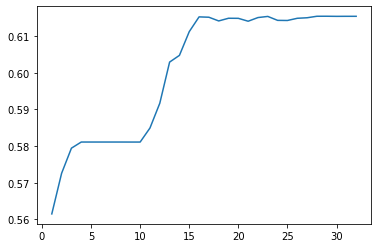

In [32]:
### 特徴数とスコアの変化をプロット(右から左に移動)
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

### ラッパー法（RFECV)のデータ生成

In [33]:
# ここでTrueになっている特徴が削除してもよい特徴
remove_idx = ~rfecv.support_
train_x.columns[remove_idx]

Index(['Art', 'JPY', 'NZD'], dtype='object')

In [34]:
# 削除してもよい特徴の名前を取得
remove_feature = train_x.columns[remove_idx]
# drop関数で特徴を削除
rfecv_train = train_x.drop(remove_feature, axis=1)
rfecv_test = val_x.drop(remove_feature, axis=1)

In [35]:
# 行数 / 列数
print(rfecv_train.shape)
rfecv_train.head()

(178896, 29)


,goal,usd_goal_real,period,Comics,Crafts,Dance,Design,Fashion,Film & Video,Food,...,CHF,DKK,EUR,GBP,HKD,MXN,NOK,SEK,SGD,USD
12064,-0.332701,-0.054035,-1.113019,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
100143,0.594001,-0.011553,-0.210989,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
107878,0.594001,-0.011553,0.797223,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
208246,-0.994631,-0.084380,-0.374636,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1170,-0.663666,-0.069208,-0.340543,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


### 精度評価

In [11]:
# k分割交差検証の実行(最適な組み合わせ)
scores = cross_val_score(estimator, rfecv_train.iloc[0:10000, :], train_y.iloc[0:10000])

#結果表示
print('Cross validation scores : {}'.format(scores))
print('Cross validation scores : {:.3f}+-{:.3f}'.format(scores.mean(), scores.std()))

Cross validation scores : [0.604  0.62   0.598  0.6215 0.617 ]
Cross validation scores : 0.612+-0.009


## 3.2 埋め込み法（Lasso）

In [36]:
# estimatorにモデルをセット
# LassoCVを使って、正則化の強さは自動決定
estimator = LassoCV(normalize=True, cv=10)

# 係数が1e-5以下である特徴を削除する
sfm = SelectFromModel(estimator, threshold=1e-5)

# 特徴選択を実行
sfm.fit(train_x, train_y)

SelectFromModel(estimator=LassoCV(cv=10, normalize=True), threshold=1e-05)

In [37]:
# 削除すべき特徴の名前を取得 
removed_idx  = ~sfm.get_support()
train_x.columns[removed_idx]

Index(['Art', 'CHF', 'JPY'], dtype='object')

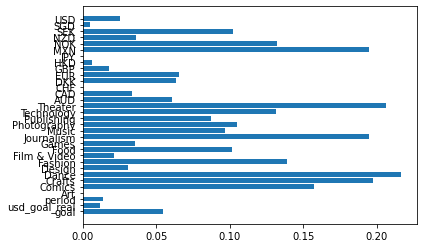

In [38]:
# LASSOで得た各特徴の係数の値を確認
# 係数の絶対値を取得
abs_coef = np.abs(sfm.estimator_.coef_)
# 係数を棒グラフで表示
plt.barh(np.arange(0, len(abs_coef)), abs_coef, tick_label=train_x.columns.values)
plt.show()

In [44]:
removed_idx

array([False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False,  True, False,
       False, False, False, False, False])

In [39]:
# drop関数で特徴を削除
remove_feature = train_x.columns[removed_idx]
lasso_train = train_x.drop(remove_feature, axis=1)
lasso_test = val_x.drop(remove_feature, axis=1)

# 行数 / 列数
print(lasso_train.shape)
lasso_train.head()

(178896, 29)


,goal,usd_goal_real,period,Comics,Crafts,Dance,Design,Fashion,Film & Video,Food,...,DKK,EUR,GBP,HKD,MXN,NOK,NZD,SEK,SGD,USD
12064,-0.332701,-0.054035,-1.113019,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
100143,0.594001,-0.011553,-0.210989,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
107878,0.594001,-0.011553,0.797223,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
208246,-0.994631,-0.084380,-0.374636,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1170,-0.663666,-0.069208,-0.340543,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [16]:
# k分割交差検証の実行
scores = cross_val_score(estimator, lasso_train.iloc[0:10000, :], train_y.iloc[0:10000])

#結果表示
print('Cross validation scores : {}'.format(scores))
print('Cross validation scores : {:.3f}+-{:.3f}'.format(scores.mean(), scores.std()))

Cross validation scores : [0.05590182 0.05992083 0.05840842 0.06696311 0.05986065]
Cross validation scores : 0.060+-0.004


# 4.決定木モデル生成

## 4.1 決定木系モデルのデフォルト値

* それぞれ（デフォルトデータ、ラッパー法データ、埋め込み法データ）のデータに対して学習

### ① デフォルトデータ

In [17]:
# #機械学習モデルをリストに格納
models = []

models.append(("決定木", "DecisionTree", DecisionTreeClassifier(random_state=0)))
models.append(("ランダムフォレスト","RandomForestClassifier",RandomForestClassifier(random_state=0)))
models.append(("アダブースト(決定木)","AdaBoostClassifier",AdaBoostClassifier(DecisionTreeClassifier(random_state=0))))

names_jp = []
names_en = []
results = []
    
for name_jp,name_en,model in models:

    print(model.fit(train_x.iloc[0:10000, :],train_y.iloc[0:10000]),"\n")
    
    kfold = KFold(n_splits=5, shuffle=True)
    result = cross_val_score(model,train_x.iloc[0:10000, :],train_y.iloc[0:10000], cv = kfold, scoring = "accuracy")
    names_jp.append(name_jp)
    names_en.append(name_en)
    results.append(result)

list_df = pd.DataFrame(columns=['識別子','識別子(英名)','スコア(平均)'])
 
for i in range(len(names_jp)):
    list_df = list_df.append( pd.Series( [names_jp[i],names_en[i],results[i].mean()], index=list_df.columns ), ignore_index=True)

list_df

DecisionTreeClassifier(random_state=0) 

RandomForestClassifier(random_state=0) 

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(random_state=0)) 



,識別子,識別子(英名),スコア(平均)
0,決定木,DecisionTree,0.5786
1,ランダムフォレスト,RandomForestClassifier,0.5956
2,アダブースト(決定木),AdaBoostClassifier,0.5842


### ② ラッパー法（RFECV)のデータ

In [18]:
list_df = []
names_jp = []
names_en = []
results = []

for name_jp,name_en,model in models:

    print(model.fit(rfecv_train.iloc[0:10000, :],train_y.iloc[0:10000]),"\n")
    
    kfold = KFold(n_splits=5, shuffle=True)
    result = cross_val_score(model,rfecv_train.iloc[0:10000, :],train_y.iloc[0:10000], cv = kfold, scoring = "accuracy")
    names_jp.append(name_jp)
    names_en.append(name_en)
    results.append(result)

list_df = pd.DataFrame(columns=['識別子','識別子(英名)','スコア(平均)'])
 
for i in range(len(names_jp)):
    list_df = list_df.append( pd.Series( [names_jp[i],names_en[i],results[i].mean()], index=list_df.columns ), ignore_index=True)

list_df

DecisionTreeClassifier(random_state=0) 

RandomForestClassifier(random_state=0) 

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(random_state=0)) 



,識別子,識別子(英名),スコア(平均)
0,決定木,DecisionTree,0.5775
1,ランダムフォレスト,RandomForestClassifier,0.5827
2,アダブースト(決定木),AdaBoostClassifier,0.5744


### ③ Lasso

In [19]:
list_df = []
names_jp = []
names_en = []
results = []

for name_jp,name_en,model in models:

    print(model.fit(lasso_train.iloc[0:10000, :],train_y.iloc[0:10000]),"\n")
    
    kfold = KFold(n_splits=5, shuffle=True)
    result = cross_val_score(model,lasso_train.iloc[0:10000, :],train_y.iloc[0:10000], cv = kfold, scoring = "accuracy")
    names_jp.append(name_jp)
    names_en.append(name_en)
    results.append(result)

list_df = pd.DataFrame(columns=['識別子','識別子(英名)','スコア(平均)'])
 
for i in range(len(names_jp)):
    list_df = list_df.append( pd.Series( [names_jp[i],names_en[i],results[i].mean()], index=list_df.columns ), ignore_index=True)

list_df

DecisionTreeClassifier(random_state=0) 

RandomForestClassifier(random_state=0) 

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(random_state=0)) 



,識別子,識別子(英名),スコア(平均)
0,決定木,DecisionTree,0.5767
1,ランダムフォレスト,RandomForestClassifier,0.6019
2,アダブースト(決定木),AdaBoostClassifier,0.5806


## 4.2 決定木

In [20]:
import optuna
import sklearn

def objective(trial):

    # パラメータ種類 & 探索範囲
    max_depth = int(trial.suggest_float('max_depth', 1, 10, log=True))
    min_samples_split = trial.suggest_int("min_samples_split", 2, 11)
    max_leaf_nodes = int(trial.suggest_int("max_leaf_nodes", 2, 11))
    
    clf = DecisionTreeClassifier(max_depth=max_depth, 
                min_samples_split=min_samples_split, 
                max_leaf_nodes=max_leaf_nodes)
    
    # 層化分割交差検証
    skf = StratifiedKFold(shuffle=True, random_state=0)
    
    return sklearn.model_selection.cross_val_score(
        clf, train_x,  train_y, n_jobs=-1, cv=skf).mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

trial = study.best_trial

print('Accuracy: {}'.format(trial.value))
print("Best hyperparameters: {}".format(trial.params))

[I 2021-03-30 22:28:51,897] A new study created in memory with name: no-name-2c12c05c-d723-4c67-a23b-b0bac4104814
[I 2021-03-30 22:28:54,422] Trial 0 finished with value: 0.5664799547111077 and parameters: {'max_depth': 1.4571870931307465, 'min_samples_split': 3, 'max_leaf_nodes': 5}. Best is trial 0 with value: 0.5664799547111077.
[I 2021-03-30 22:28:54,960] Trial 1 finished with value: 0.5664799547111077 and parameters: {'max_depth': 1.6810247083951386, 'min_samples_split': 4, 'max_leaf_nodes': 2}. Best is trial 0 with value: 0.5664799547111077.
[I 2021-03-30 22:28:55,516] Trial 2 finished with value: 0.5664799547111077 and parameters: {'max_depth': 1.4908673369540077, 'min_samples_split': 8, 'max_leaf_nodes': 3}. Best is trial 0 with value: 0.5664799547111077.
[I 2021-03-30 22:28:56,062] Trial 3 finished with value: 0.5664799547111077 and parameters: {'max_depth': 1.0437563738466344, 'min_samples_split': 5, 'max_leaf_nodes': 11}. Best is trial 0 with value: 0.5664799547111077.
[I 20

[I 2021-03-30 22:29:27,859] Trial 35 finished with value: 0.5664799547111077 and parameters: {'max_depth': 7.3465529556575415, 'min_samples_split': 5, 'max_leaf_nodes': 2}. Best is trial 9 with value: 0.6066038236312226.
[I 2021-03-30 22:29:28,557] Trial 36 finished with value: 0.5812706784808441 and parameters: {'max_depth': 2.2605596558615537, 'min_samples_split': 8, 'max_leaf_nodes': 11}. Best is trial 9 with value: 0.6066038236312226.
[I 2021-03-30 22:29:29,679] Trial 37 finished with value: 0.6024449885516221 and parameters: {'max_depth': 9.95936814676168, 'min_samples_split': 7, 'max_leaf_nodes': 10}. Best is trial 9 with value: 0.6066038236312226.
[I 2021-03-30 22:29:30,514] Trial 38 finished with value: 0.5812706784808441 and parameters: {'max_depth': 6.475882657725088, 'min_samples_split': 10, 'max_leaf_nodes': 4}. Best is trial 9 with value: 0.6066038236312226.
[I 2021-03-30 22:29:31,668] Trial 39 finished with value: 0.6066038236312226 and parameters: {'max_depth': 8.6324011

[I 2021-03-30 22:30:05,895] Trial 70 finished with value: 0.6066038236312226 and parameters: {'max_depth': 6.768511060820683, 'min_samples_split': 9, 'max_leaf_nodes': 11}. Best is trial 9 with value: 0.6066038236312226.
[I 2021-03-30 22:30:07,055] Trial 71 finished with value: 0.6066038236312226 and parameters: {'max_depth': 7.968227157775606, 'min_samples_split': 9, 'max_leaf_nodes': 11}. Best is trial 9 with value: 0.6066038236312226.
[I 2021-03-30 22:30:08,177] Trial 72 finished with value: 0.6066038236312226 and parameters: {'max_depth': 6.890191186370122, 'min_samples_split': 10, 'max_leaf_nodes': 11}. Best is trial 9 with value: 0.6066038236312226.
[I 2021-03-30 22:30:09,289] Trial 73 finished with value: 0.6024449885516221 and parameters: {'max_depth': 6.200212032907635, 'min_samples_split': 11, 'max_leaf_nodes': 10}. Best is trial 9 with value: 0.6066038236312226.
[I 2021-03-30 22:30:10,391] Trial 74 finished with value: 0.6028027403054441 and parameters: {'max_depth': 5.44958

Accuracy: 0.6066038236312226
Best hyperparameters: {'max_depth': 8.034119627733254, 'min_samples_split': 11, 'max_leaf_nodes': 11}


* Accuracy: 0.603110190092958
* Best hyperparameters: {'max_depth': 6.897760318563767, 'min_samples_split': 5, 'max_leaf_nodes': 11}

In [21]:
trial.params

{'max_depth': 8.034119627733254, 'min_samples_split': 11, 'max_leaf_nodes': 11}

In [22]:
clf = DecisionTreeClassifier(**trial.params)
clf.fit(train_x.iloc[0:10000, :], train_y.iloc[0:10000])

DecisionTreeClassifier(max_depth=8.034119627733254, max_leaf_nodes=11,
                       min_samples_split=11)

1) period 0.4009888732944172
2) goal 0.32502510707655713
3) Theater 0.11082634026148656
4) Music 0.08464786031989564
5) Film & Video 0.04242078788072854
6) Comics 0.03609103116691485
7) Photography 0.0
8) usd_goal_real 0.0
9) Art 0.0
10) Crafts 0.0
11) Dance 0.0
12) Design 0.0
13) Fashion 0.0
14) Food 0.0
15) Games 0.0
16) Journalism 0.0
17) USD 0.0
18) SGD 0.0
19) Technology 0.0
20) AUD 0.0
21) CAD 0.0
22) CHF 0.0
23) DKK 0.0
24) EUR 0.0
25) GBP 0.0
26) HKD 0.0
27) JPY 0.0
28) MXN 0.0
29) NOK 0.0
30) NZD 0.0
31) SEK 0.0
32) Publishing 0.0


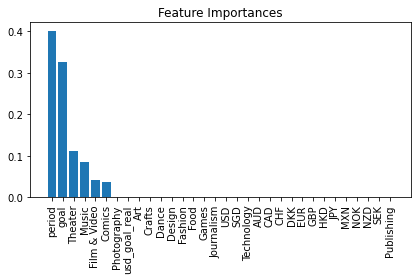

In [23]:
# 特微量
feat_label = train_x.columns
# 特微量の重要度を抽出
importances = clf.feature_importances_

# 重要度の降順で特微量のインデックス抽出
indices = np.argsort(importances)[::-1]

# 重要度の降順で特微量の名称,重要度を表示
for f in range(train_x.shape[1]):
  print("{}) {} {}".format(f+1, feat_label[indices[f]], importances[indices[f]]))

plt.title("Feature Importances")
plt.bar(range(train_x.shape[1]), importances[indices], align="center")
plt.xticks(range(train_x.shape[1]), feat_label[indices], rotation=90)
plt.tight_layout()
plt.show()

In [24]:
! pip install pydotplus

     |████████████████████████████████| 278 kB 412 kB/s eta 0:00:01
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24566 sha256=42f9e5d66288177e46d45e8c4f992c5dcb7f6315c6aa9494c7a23d78b77da8a6
  Stored in directory: /root/.cache/pip/wheels/1e/7b/04/7387cf6cc9e48b4a96e361b0be812f0708b394b821bf8c9c50
Successfully built pydotplus


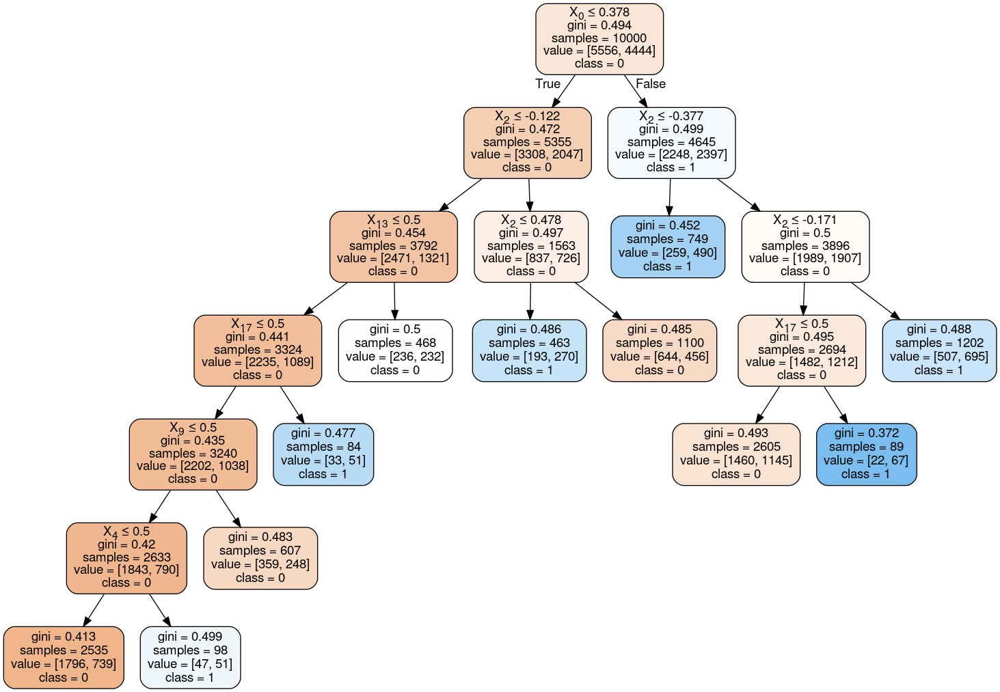

In [25]:
# 決定木の描画
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from io import StringIO
import graphviz
import pydotplus
from IPython.display import Image
dot_data = StringIO() #dotファイル情報の格納先
export_graphviz(clf, out_file=dot_data,  
                     #feature_names=list(train_x.columns), 
                     class_names=["0","1"],  
                     filled=True, rounded=True,  
                     special_characters=True) 
graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
Image(graph.create_png())

## 4.3 RandomForest

In [26]:
import optuna
import sklearn

def objective(trial):

    # パラメータ種類 & 探索範囲
    n_estimators = trial.suggest_int('n_estimators', 4, 100)
    max_depth = int(trial.suggest_loguniform('max_depth', 1, 32))
    min_samples_split = trial.suggest_int("min_samples_split", 2, 11)
    max_leaf_nodes = int(trial.suggest_int("max_leaf_nodes", 2, 11))
    
    clf = RandomForestClassifier(max_depth=max_depth, 
                n_estimators = n_estimators)
    
    # 層化分割交差検証
    skf = StratifiedKFold(shuffle=True, random_state=0)
    
    return sklearn.model_selection.cross_val_score(
        clf, train_x,  train_y, n_jobs=-1, cv=skf).mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

trial = study.best_trial

print('Accuracy: {}'.format(trial.value))
print("Best hyperparameters: {}".format(trial.params))

[I 2021-03-30 22:30:50,733] A new study created in memory with name: no-name-147dafd0-fd74-43e2-a7f9-a7d434651957
[I 2021-03-30 22:30:55,554] Trial 0 finished with value: 0.6083646375752044 and parameters: {'n_estimators': 31, 'max_depth': 5.355755698401343, 'min_samples_split': 5, 'max_leaf_nodes': 7}. Best is trial 0 with value: 0.6083646375752044.
[I 2021-03-30 22:31:02,245] Trial 1 finished with value: 0.6057821189770485 and parameters: {'n_estimators': 52, 'max_depth': 4.874055460165551, 'min_samples_split': 8, 'max_leaf_nodes': 3}. Best is trial 0 with value: 0.6083646375752044.
[I 2021-03-30 22:31:09,555] Trial 2 finished with value: 0.6128700523215376 and parameters: {'n_estimators': 43, 'max_depth': 6.180683156018054, 'min_samples_split': 4, 'max_leaf_nodes': 8}. Best is trial 2 with value: 0.6128700523215376.
[I 2021-03-30 22:31:31,949] Trial 3 finished with value: 0.629728999515706 and parameters: {'n_estimators': 57, 'max_depth': 18.73900712493686, 'min_samples_split': 10, 

[I 2021-03-30 22:42:33,079] Trial 32 finished with value: 0.6318587369881415 and parameters: {'n_estimators': 68, 'max_depth': 14.938577141168189, 'min_samples_split': 5, 'max_leaf_nodes': 9}. Best is trial 18 with value: 0.6324456718969665.
[I 2021-03-30 22:43:03,845] Trial 33 finished with value: 0.6265483842327451 and parameters: {'n_estimators': 75, 'max_depth': 20.8561887415448, 'min_samples_split': 6, 'max_leaf_nodes': 8}. Best is trial 18 with value: 0.6324456718969665.
[I 2021-03-30 22:43:18,399] Trial 34 finished with value: 0.6313780116622085 and parameters: {'n_estimators': 46, 'max_depth': 14.471506140967307, 'min_samples_split': 4, 'max_leaf_nodes': 10}. Best is trial 18 with value: 0.6324456718969665.
[I 2021-03-30 22:43:28,710] Trial 35 finished with value: 0.6187673623264962 and parameters: {'n_estimators': 56, 'max_depth': 7.238577136239367, 'min_samples_split': 2, 'max_leaf_nodes': 7}. Best is trial 18 with value: 0.6324456718969665.
[I 2021-03-30 22:43:52,517] Trial 

[I 2021-03-30 22:54:39,111] Trial 65 finished with value: 0.6286110448136284 and parameters: {'n_estimators': 59, 'max_depth': 11.741746961391483, 'min_samples_split': 6, 'max_leaf_nodes': 8}. Best is trial 61 with value: 0.6327754730451899.
[I 2021-03-30 22:55:11,415] Trial 66 finished with value: 0.628175025021235 and parameters: {'n_estimators': 82, 'max_depth': 19.046860875343786, 'min_samples_split': 6, 'max_leaf_nodes': 9}. Best is trial 61 with value: 0.6327754730451899.
[I 2021-03-30 22:55:42,242] Trial 67 finished with value: 0.6109918459277781 and parameters: {'n_estimators': 64, 'max_depth': 28.34812245634129, 'min_samples_split': 9, 'max_leaf_nodes': 10}. Best is trial 61 with value: 0.6327754730451899.
[I 2021-03-30 22:55:59,197] Trial 68 finished with value: 0.6314674613178338 and parameters: {'n_estimators': 53, 'max_depth': 14.666697978952762, 'min_samples_split': 5, 'max_leaf_nodes': 9}. Best is trial 61 with value: 0.6327754730451899.
[I 2021-03-30 22:56:33,857] Trial

[I 2021-03-30 23:08:28,862] Trial 98 finished with value: 0.631875508632578 and parameters: {'n_estimators': 80, 'max_depth': 15.96301928988446, 'min_samples_split': 7, 'max_leaf_nodes': 11}. Best is trial 61 with value: 0.6327754730451899.
[I 2021-03-30 23:08:53,932] Trial 99 finished with value: 0.6269340842487321 and parameters: {'n_estimators': 62, 'max_depth': 20.468246547758984, 'min_samples_split': 9, 'max_leaf_nodes': 10}. Best is trial 61 with value: 0.6327754730451899.


Accuracy: 0.6327754730451899
Best hyperparameters: {'n_estimators': 72, 'max_depth': 16.37553933556912, 'min_samples_split': 6, 'max_leaf_nodes': 10}


* Accuracy: 0.6315960011705297
* Best hyperparameters: {'n_estimators': 61, 'max_depth': 14.885790691179874, 'min_samples_split': 5, 'max_leaf_nodes': 10}

In [21]:
best_param = {'n_estimators': 61, 'max_depth': 14.885790691179874, 'min_samples_split': 5, 'max_leaf_nodes': 10}
clf = RandomForestClassifier(**best_param)
clf.fit(train_x.iloc[0:10000, :], train_y.iloc[0:10000])
rf_val_prob = clf.predict_proba(val_x)

1) goal 0.19967061605673822
2) period 0.19247996891500108
3) usd_goal_real 0.15727846109061358
4) Theater 0.09833006430078299
5) Music 0.0900826789593616
6) Technology 0.039405310846845114
7) Comics 0.038080861107132866
8) Fashion 0.034052999244129495
9) Publishing 0.028993254427035736
10) Games 0.02232086719811171
11) USD 0.022022620775481585
12) Food 0.018889603792512696
13) Crafts 0.014383291777241024
14) Photography 0.011311494984050976
15) EUR 0.008870146560660985
16) Film & Video 0.007297894350074948
17) Dance 0.005987305989234035
18) GBP 0.003519756230117236
19) Journalism 0.0030110983700851954
20) Art 0.0012355611673531676
21) Design 0.00101473514138895
22) AUD 0.0009087088511170599
23) NZD 0.0004661371050935645
24) HKD 0.00038656275983613305
25) SEK 0.0
26) NOK 0.0
27) MXN 0.0
28) SGD 0.0
29) CAD 0.0
30) DKK 0.0
31) JPY 0.0
32) CHF 0.0


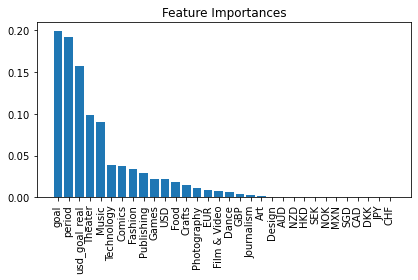

In [29]:
# 特微量
feat_label = train_x.columns
# 特微量の重要度を抽出
importances = clf.feature_importances_

# 重要度の降順で特微量のインデックス抽出
indices = np.argsort(importances)[::-1]

# 重要度の降順で特微量の名称,重要度を表示
for f in range(train_x.shape[1]):
  print("{}) {} {}".format(f+1, feat_label[indices[f]], importances[indices[f]]))

plt.title("Feature Importances")
plt.bar(range(train_x.shape[1]), importances[indices], align="center")
plt.xticks(range(train_x.shape[1]), feat_label[indices], rotation=90)
plt.tight_layout()
plt.show()

0


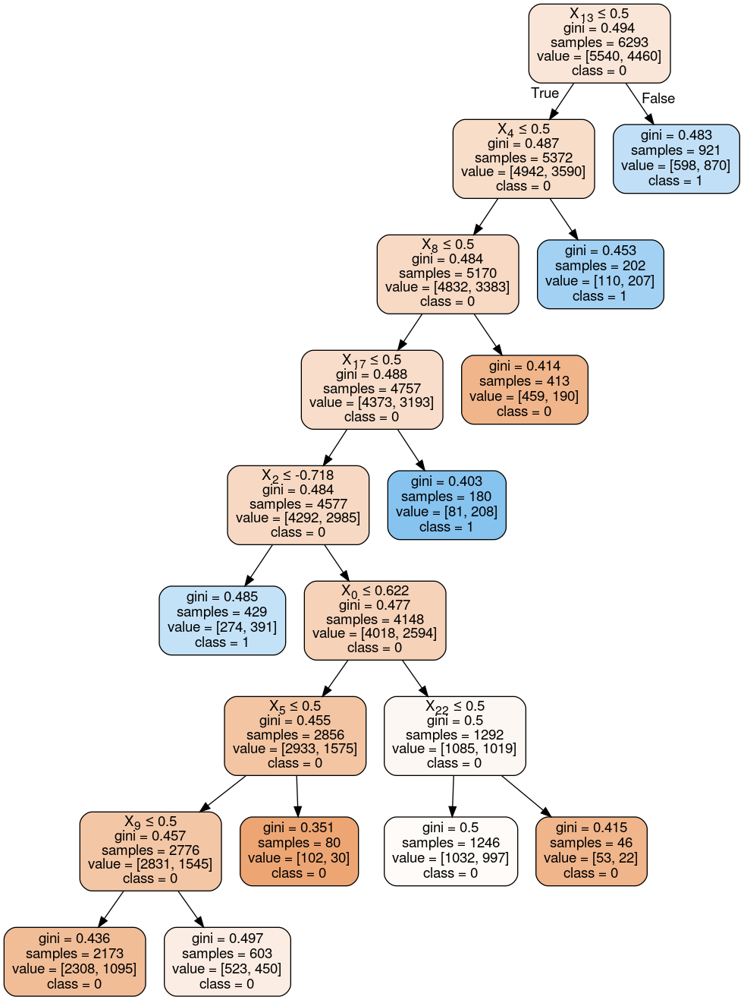

1


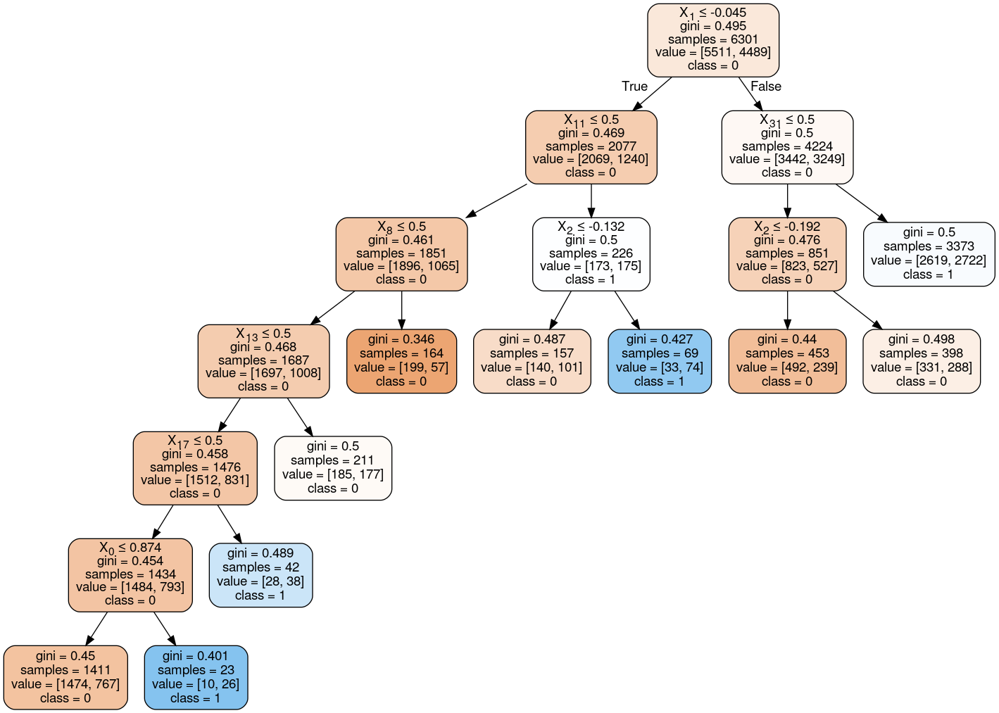

2


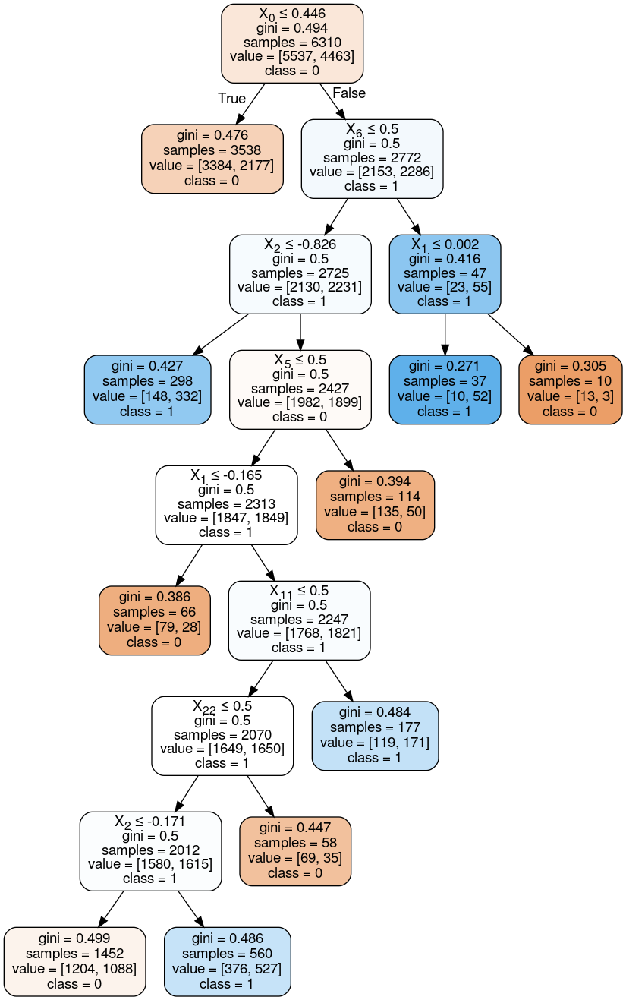

3


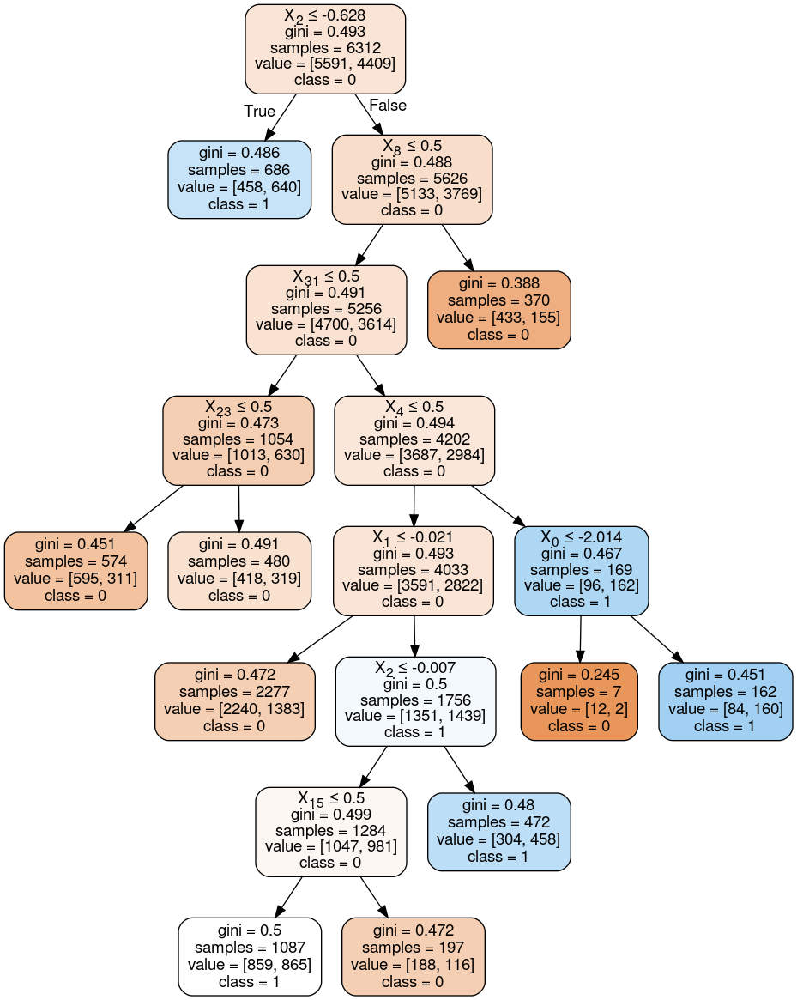

4


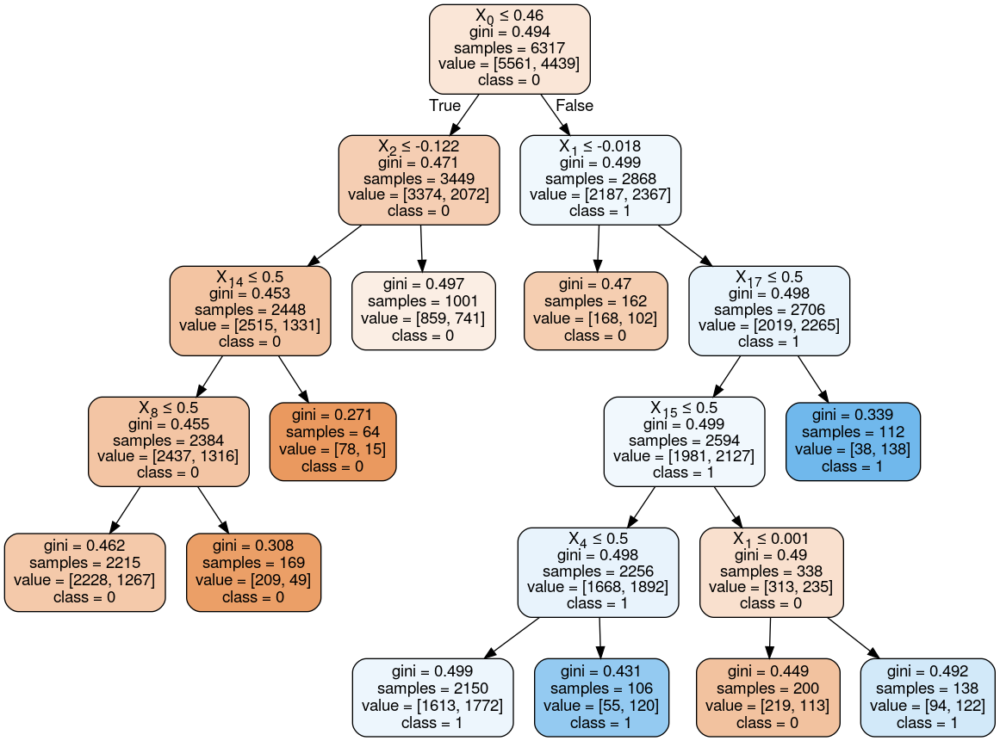

5


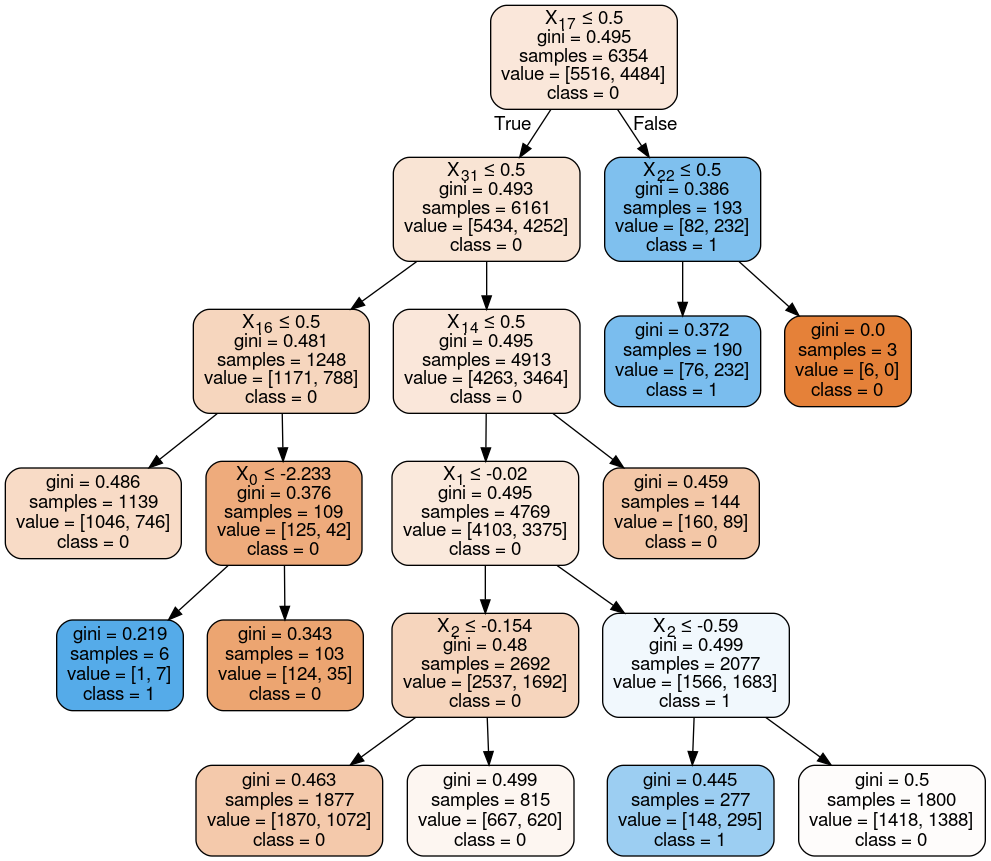

6


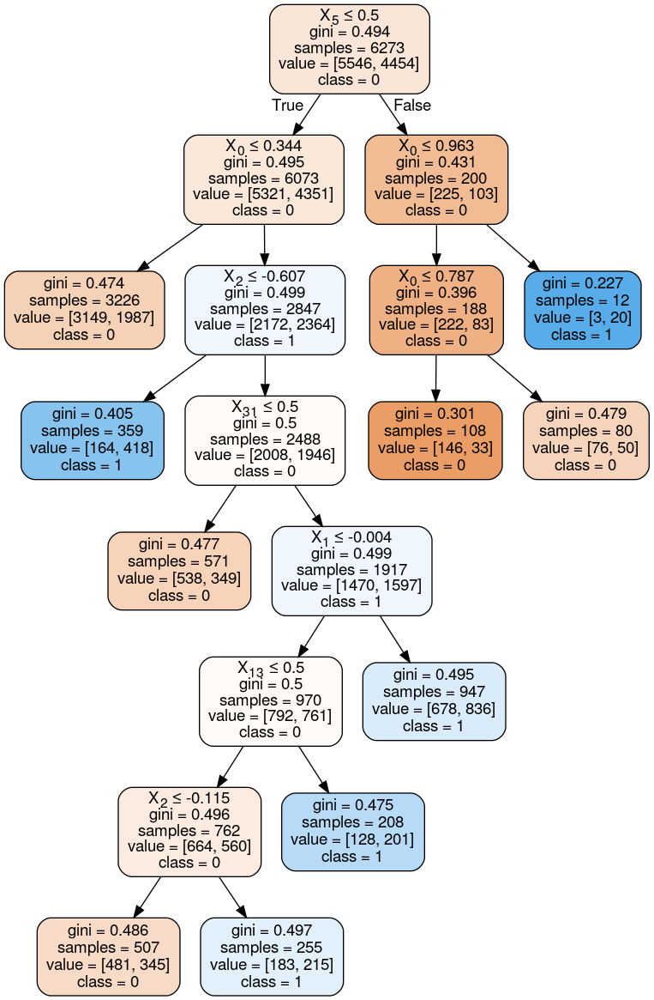

7


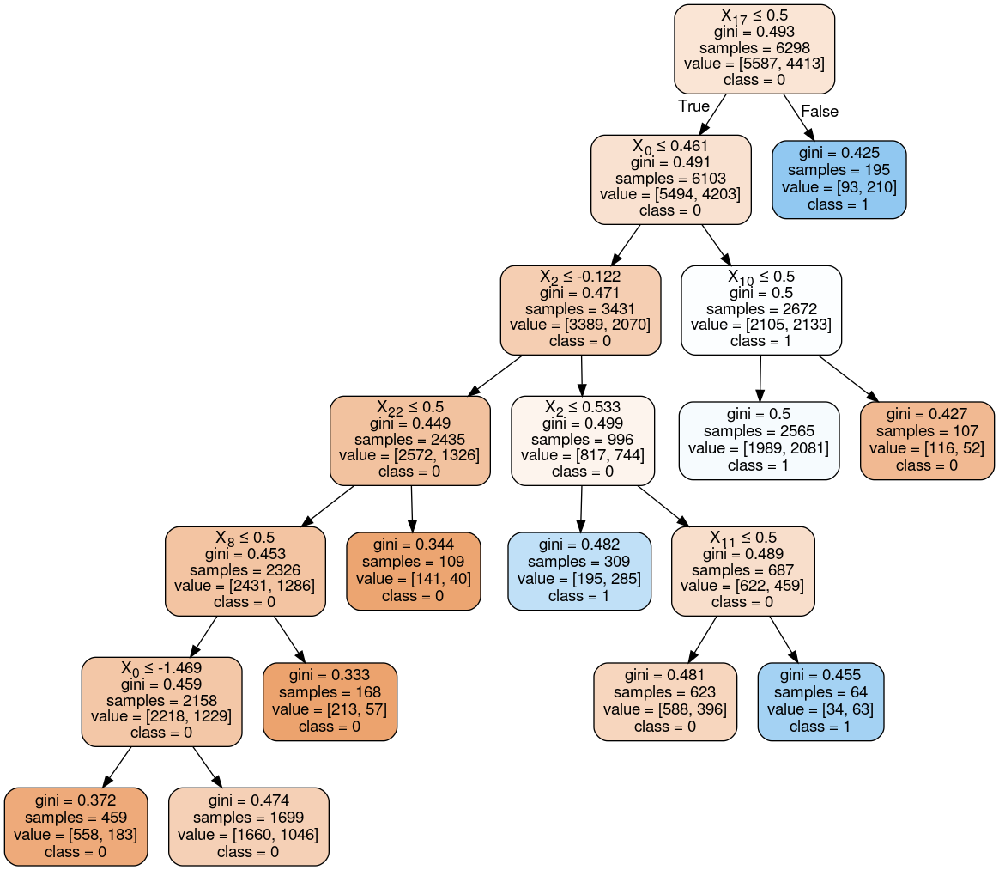

8


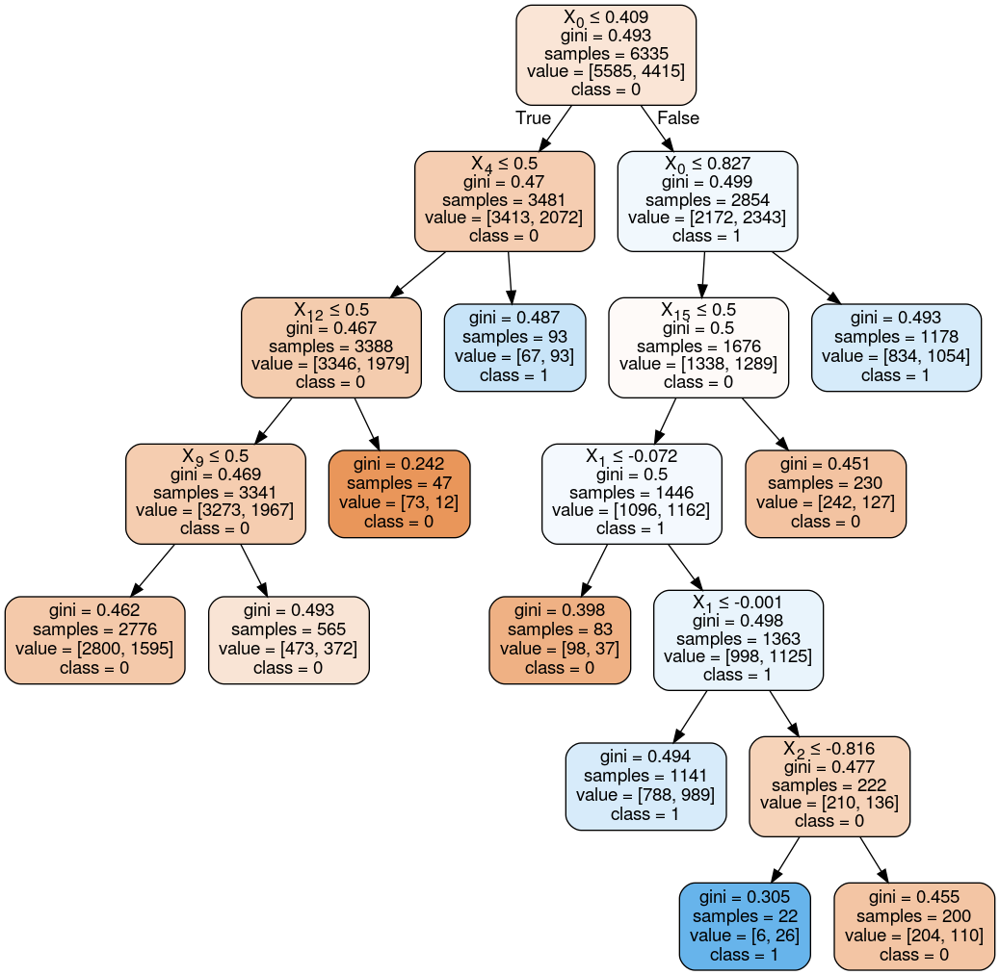

9


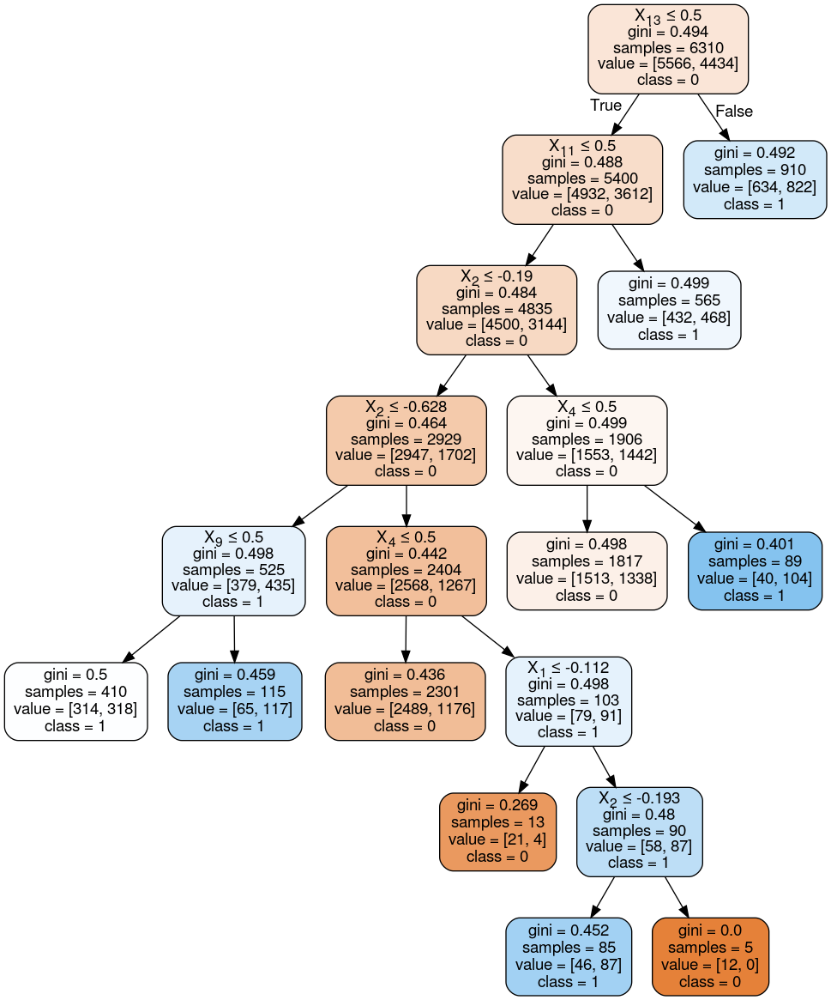

10


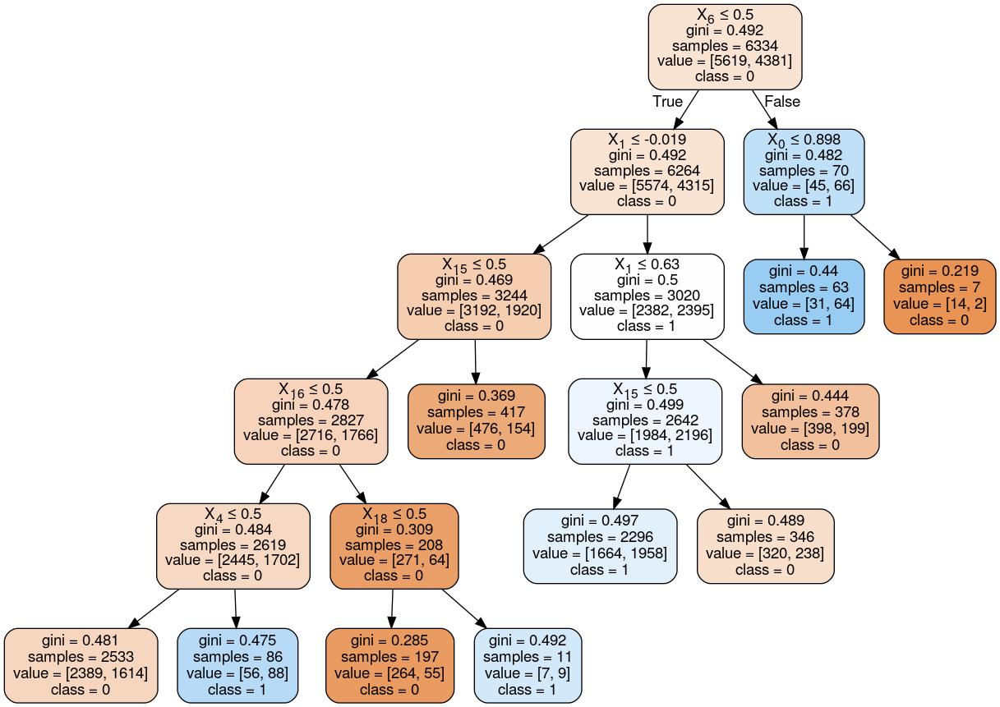

11


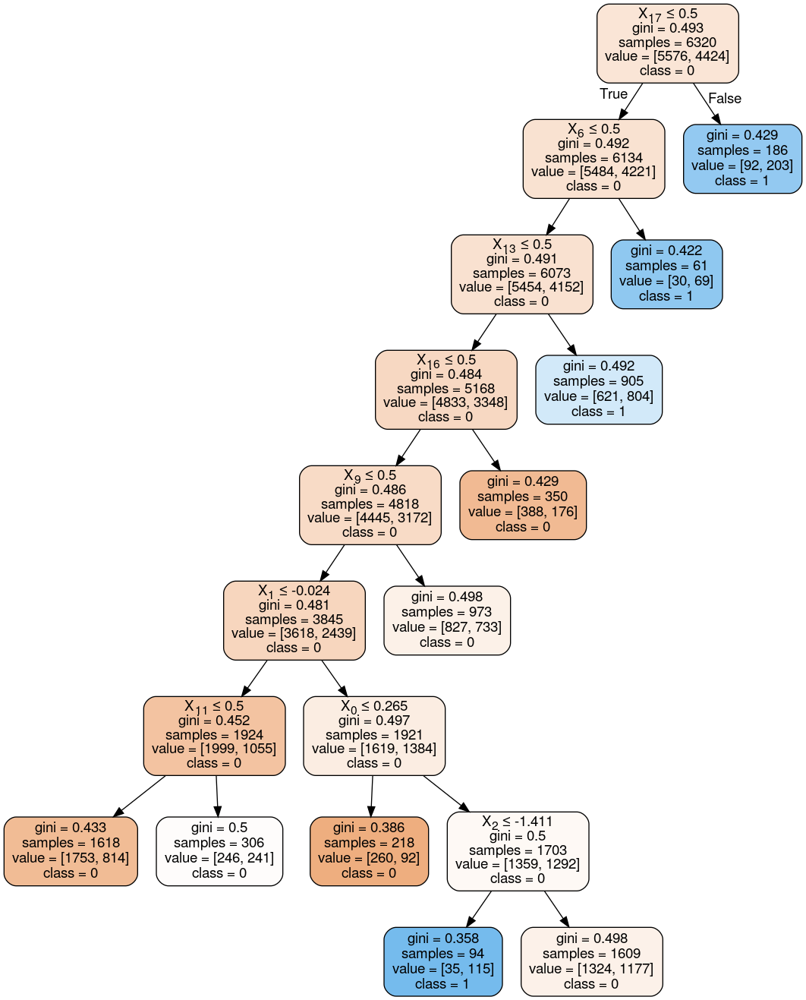

12


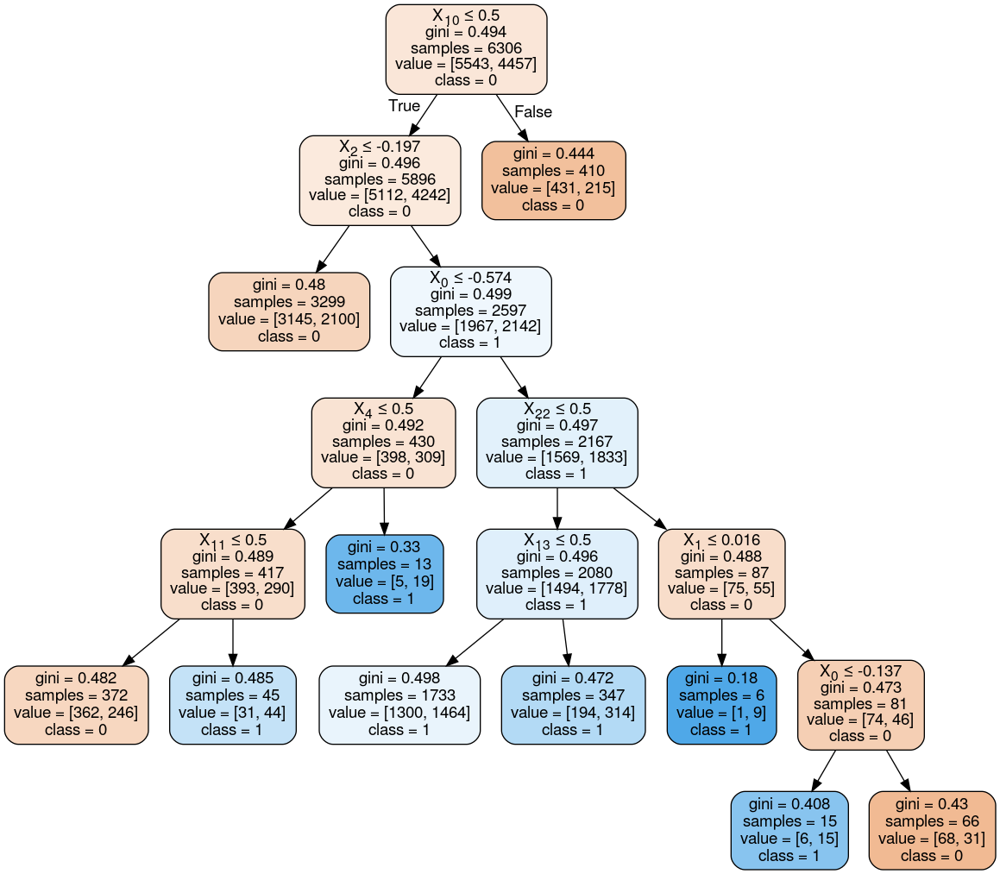

13


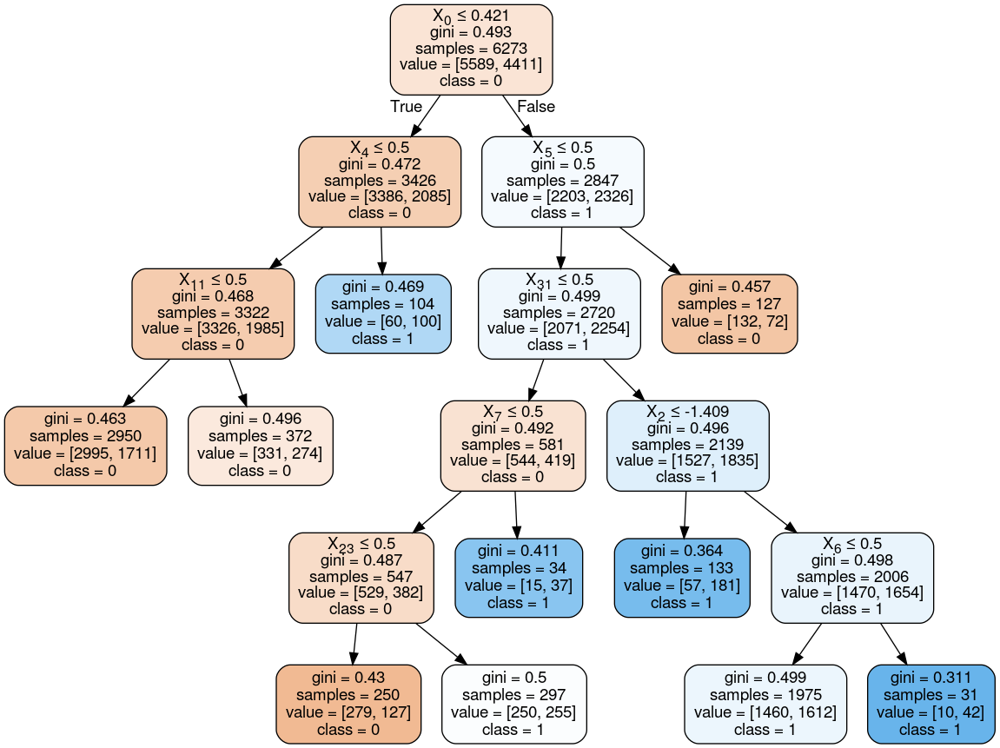

14


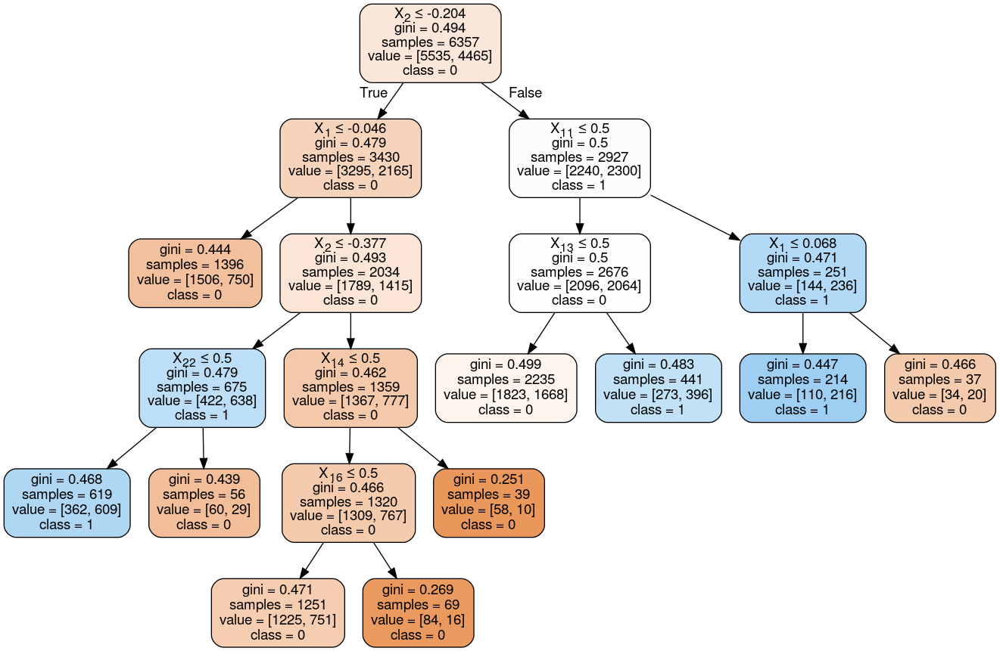

15


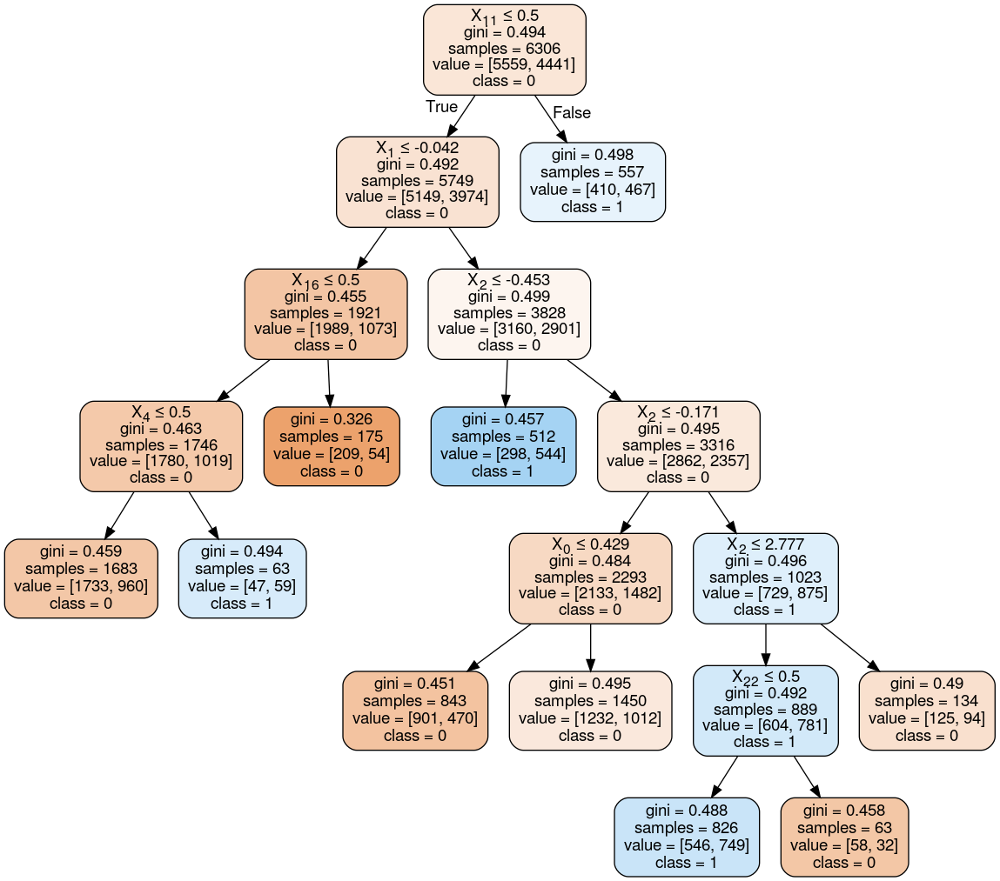

16


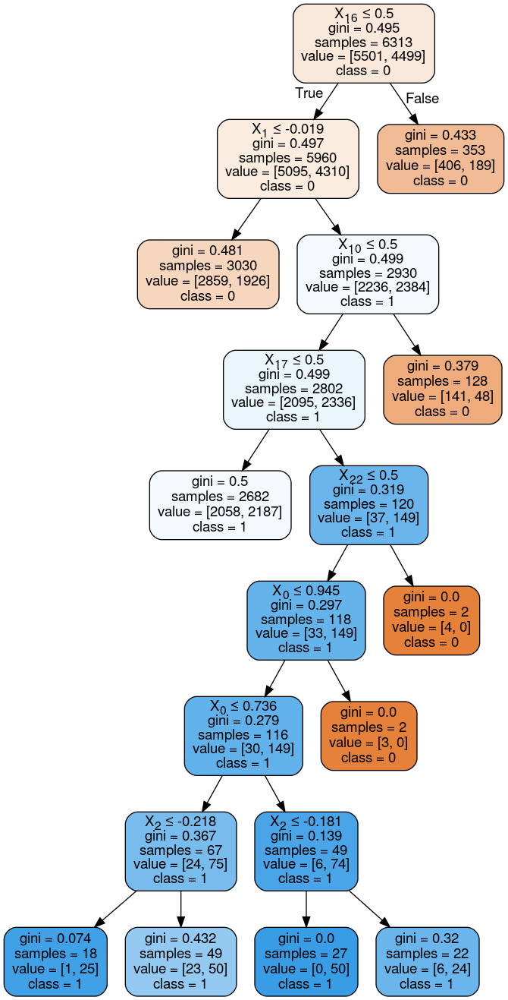

17


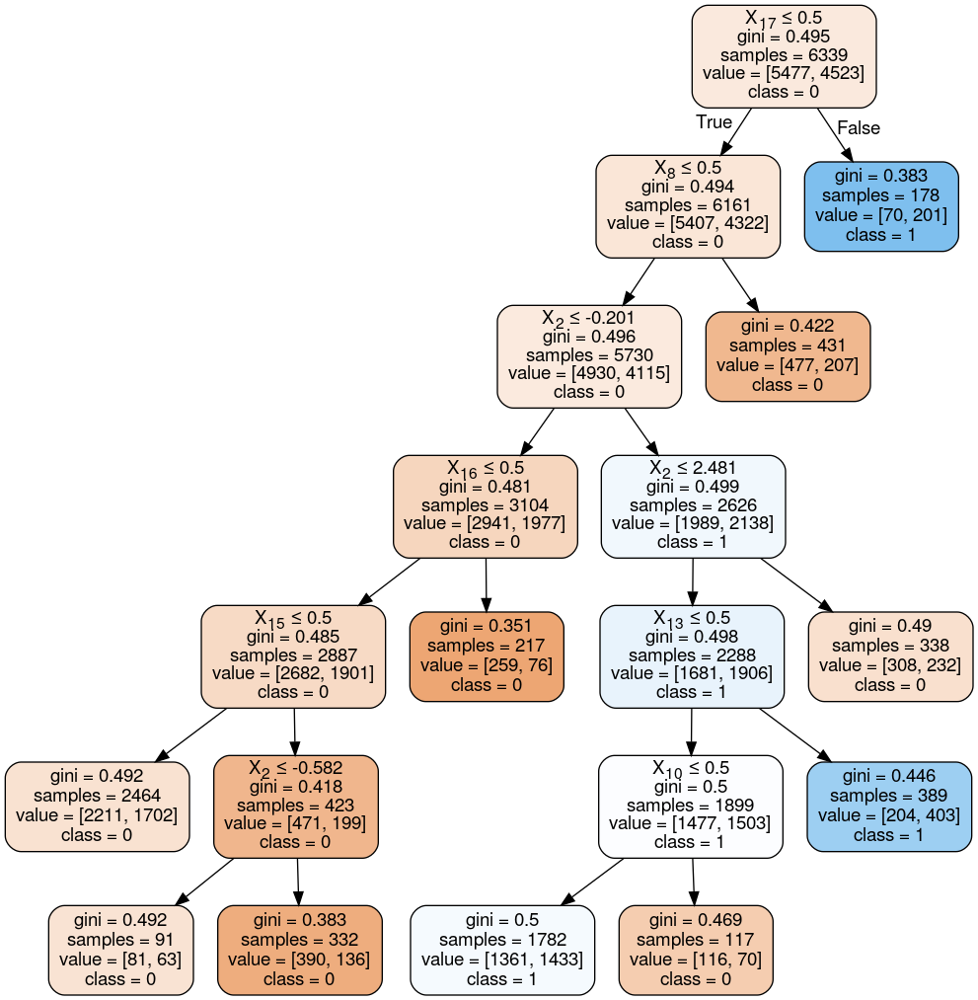

18


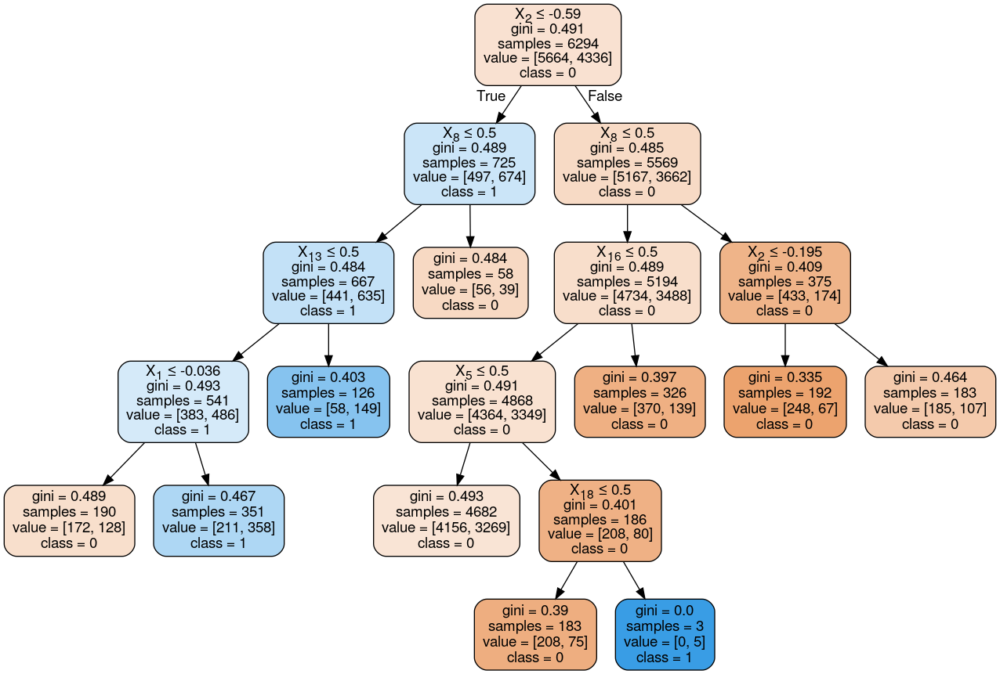

19


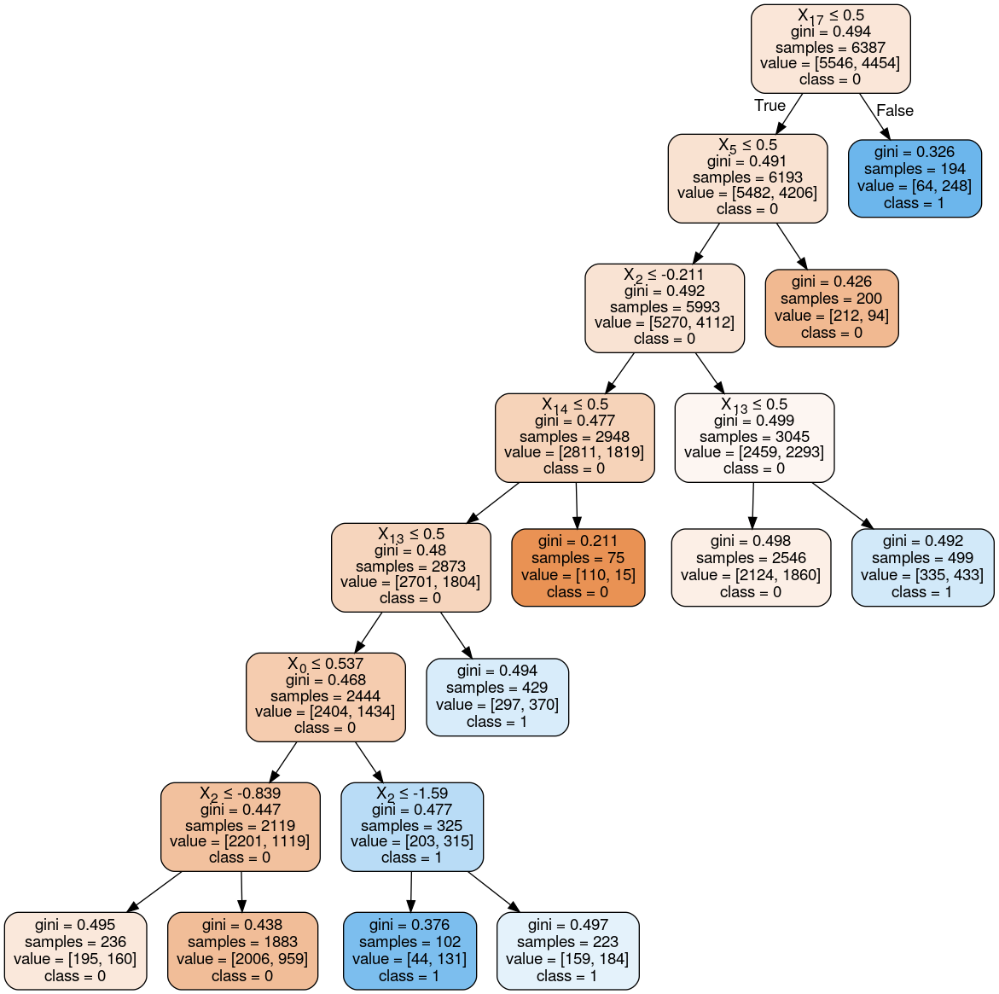

20


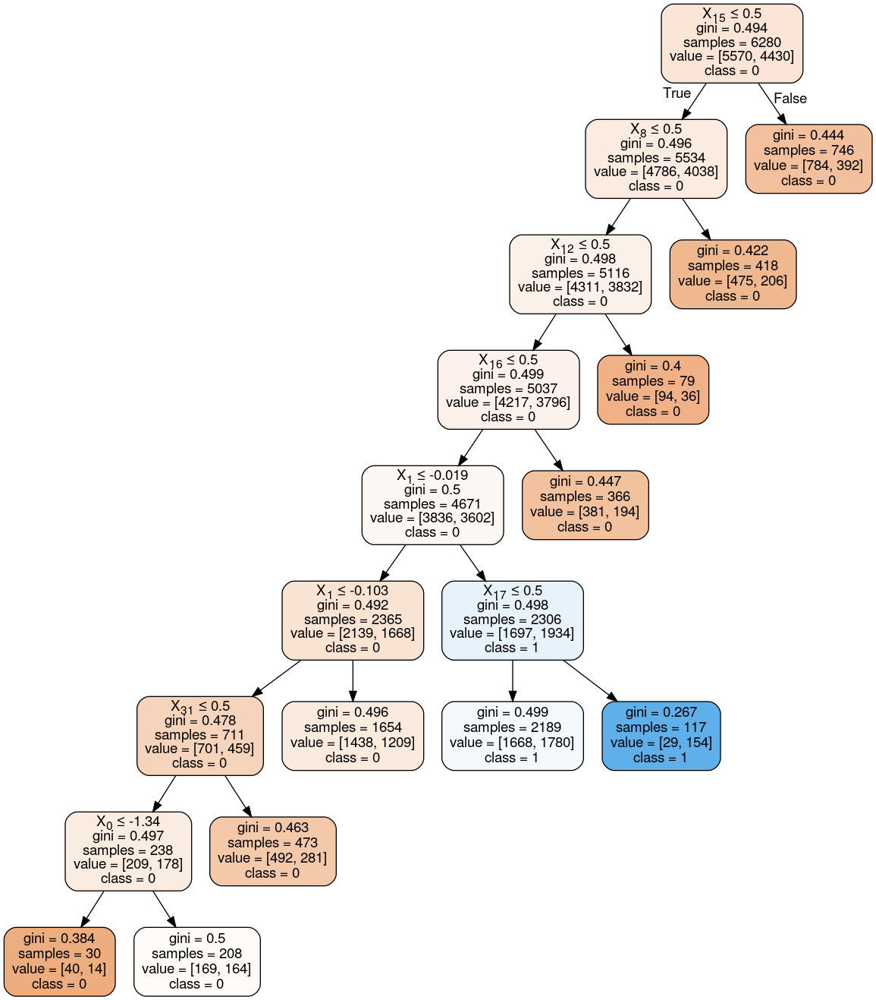

21


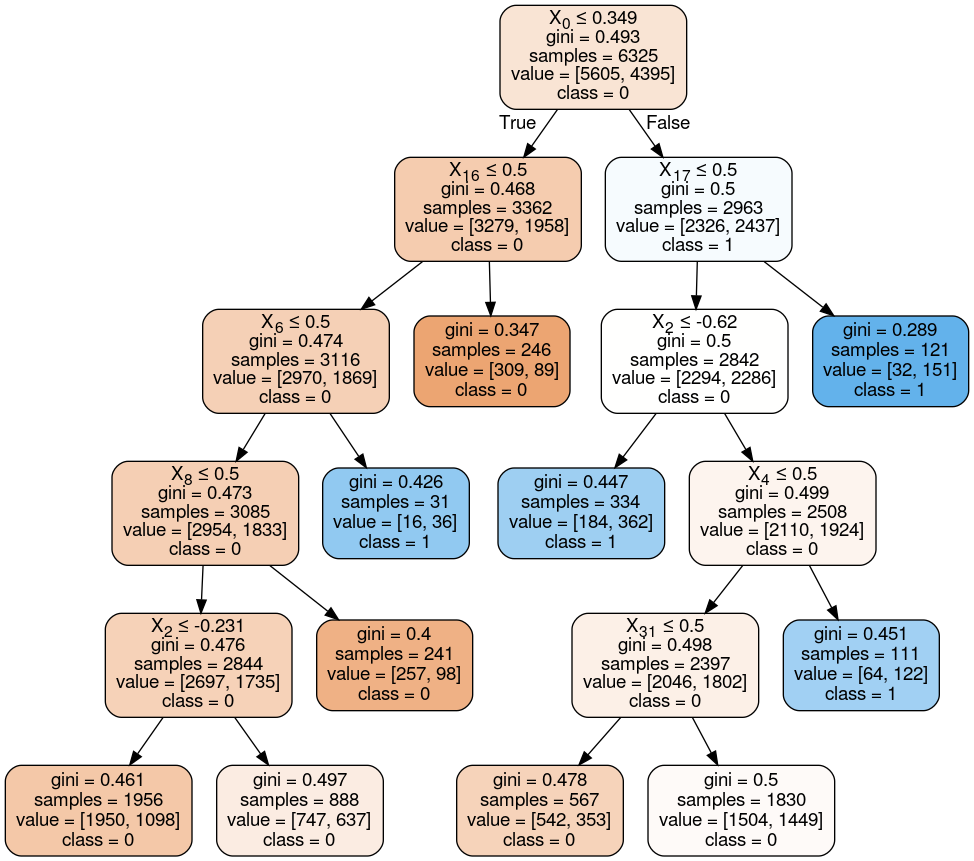

22


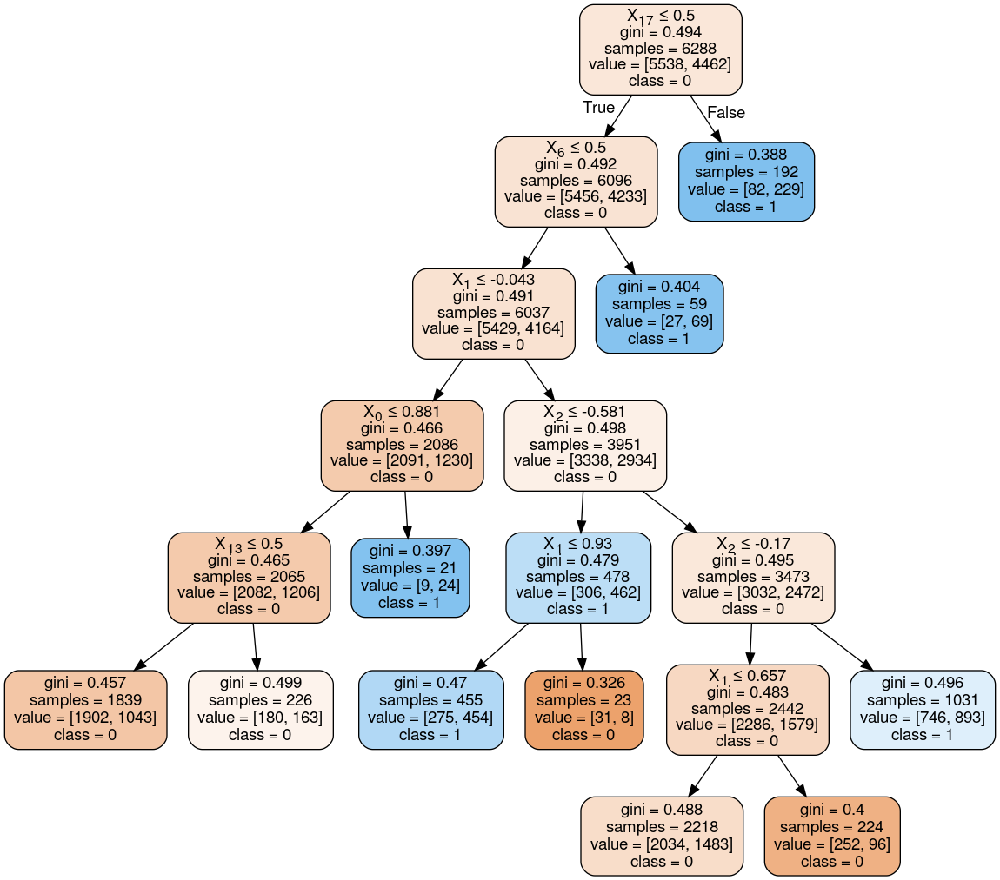

23


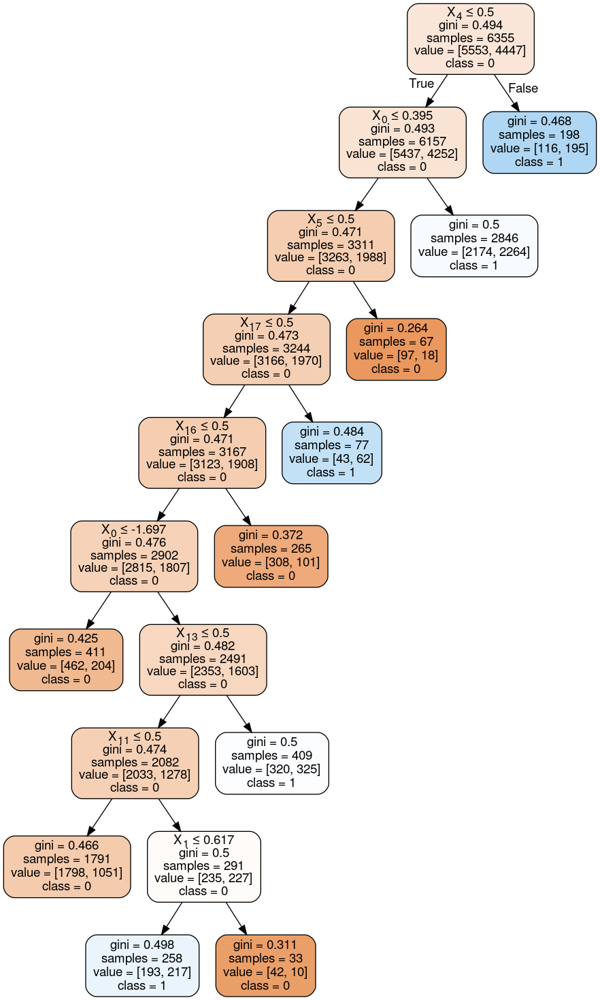

24


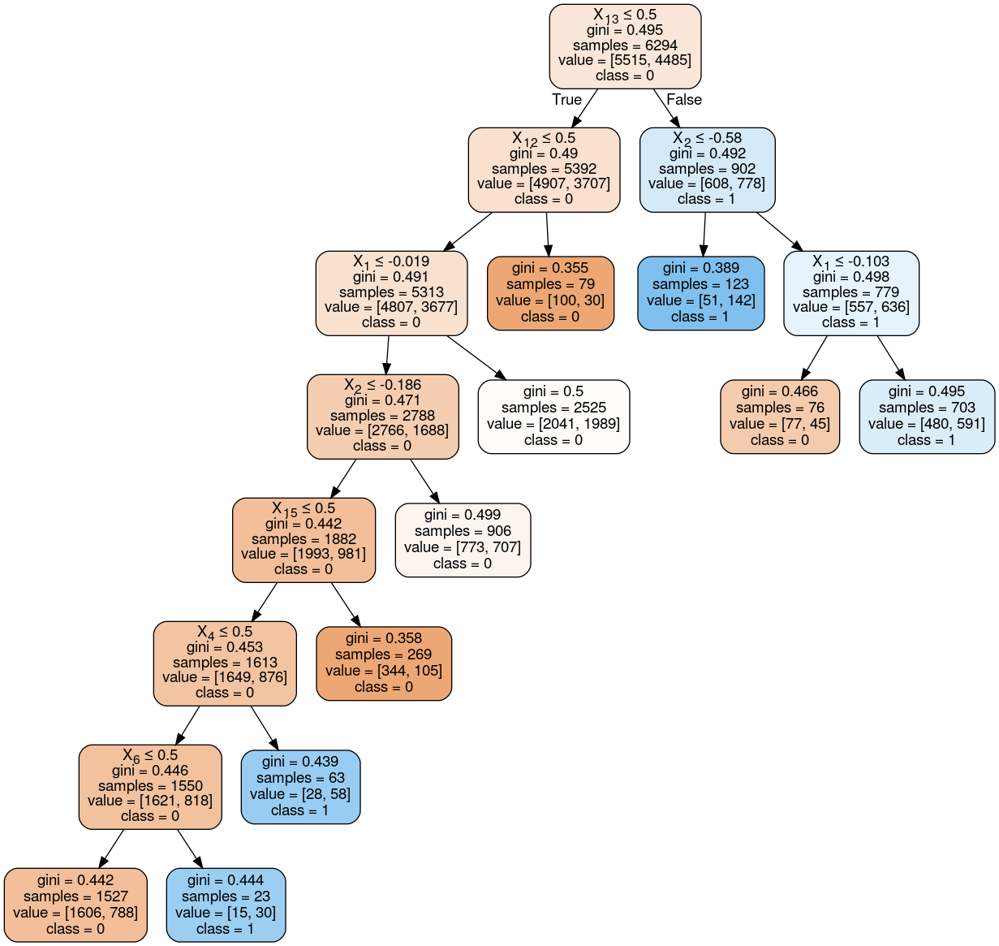

25


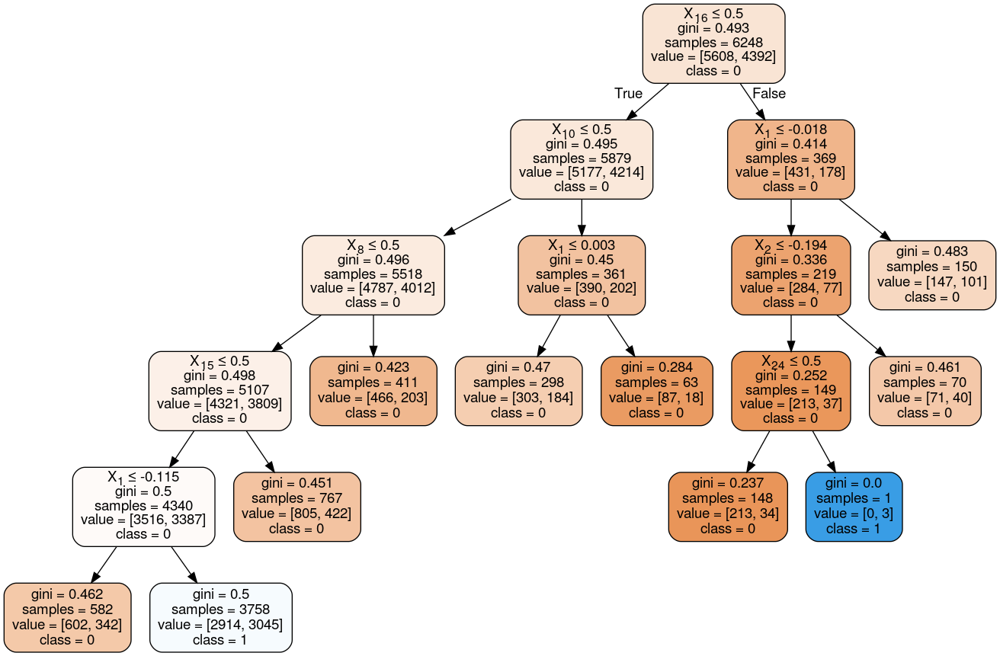

26


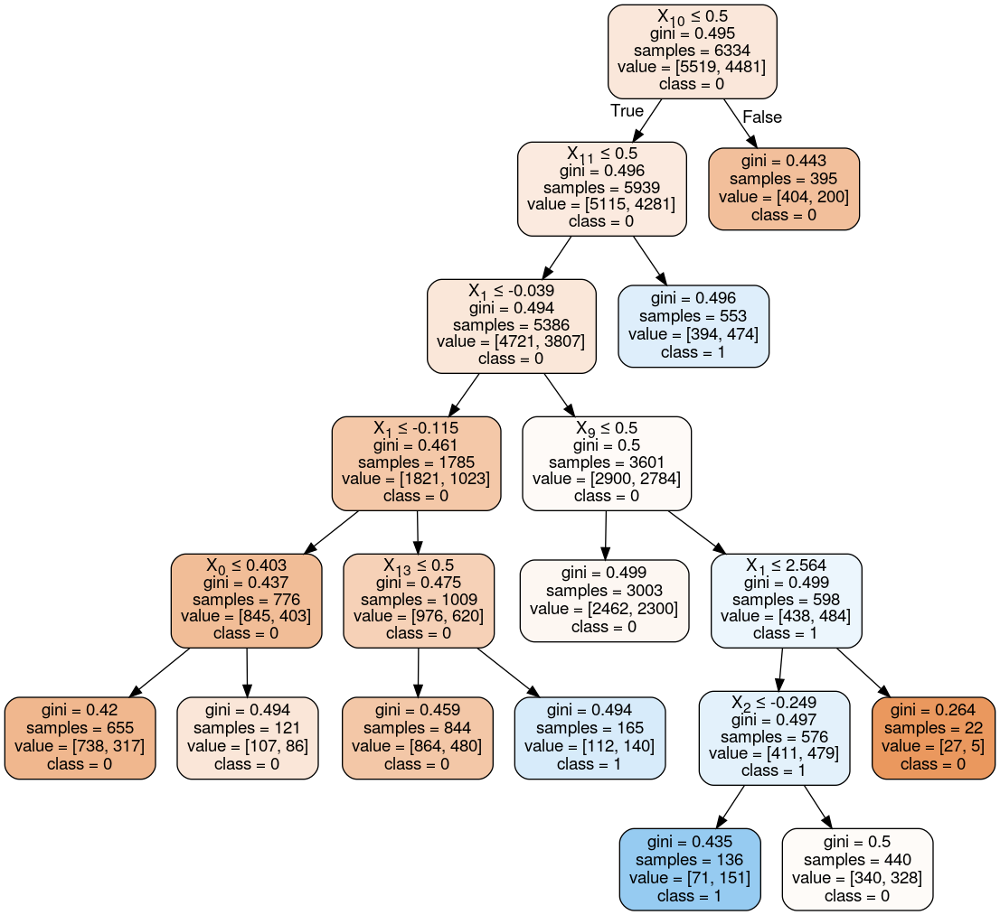

27


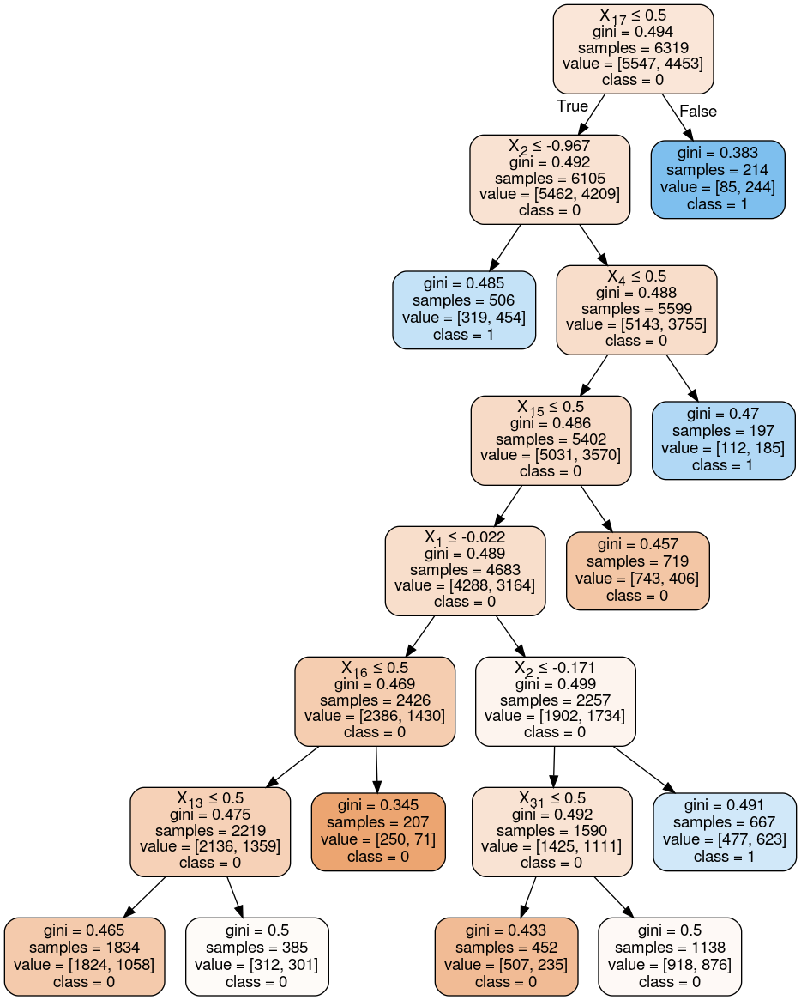

28


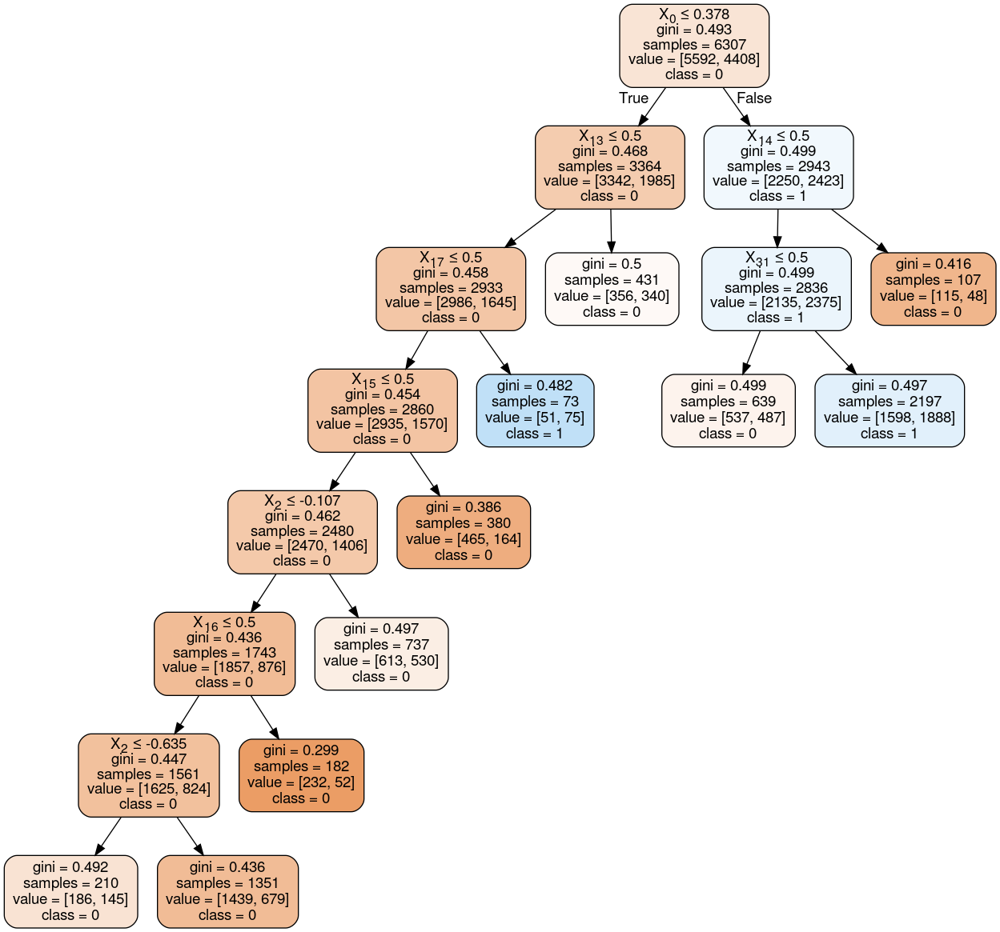

29


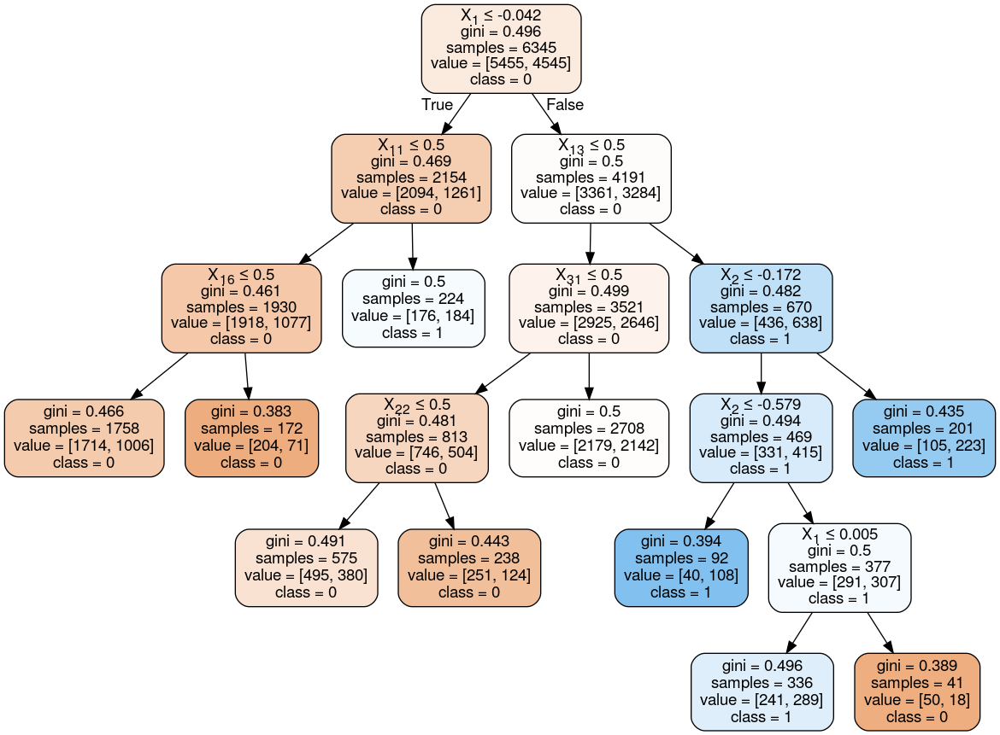

30


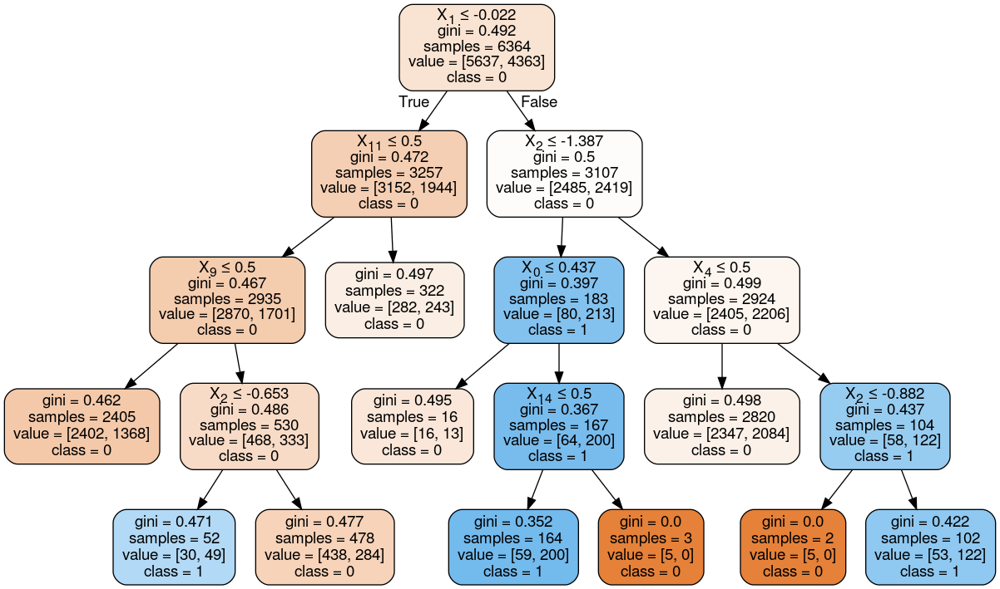

31


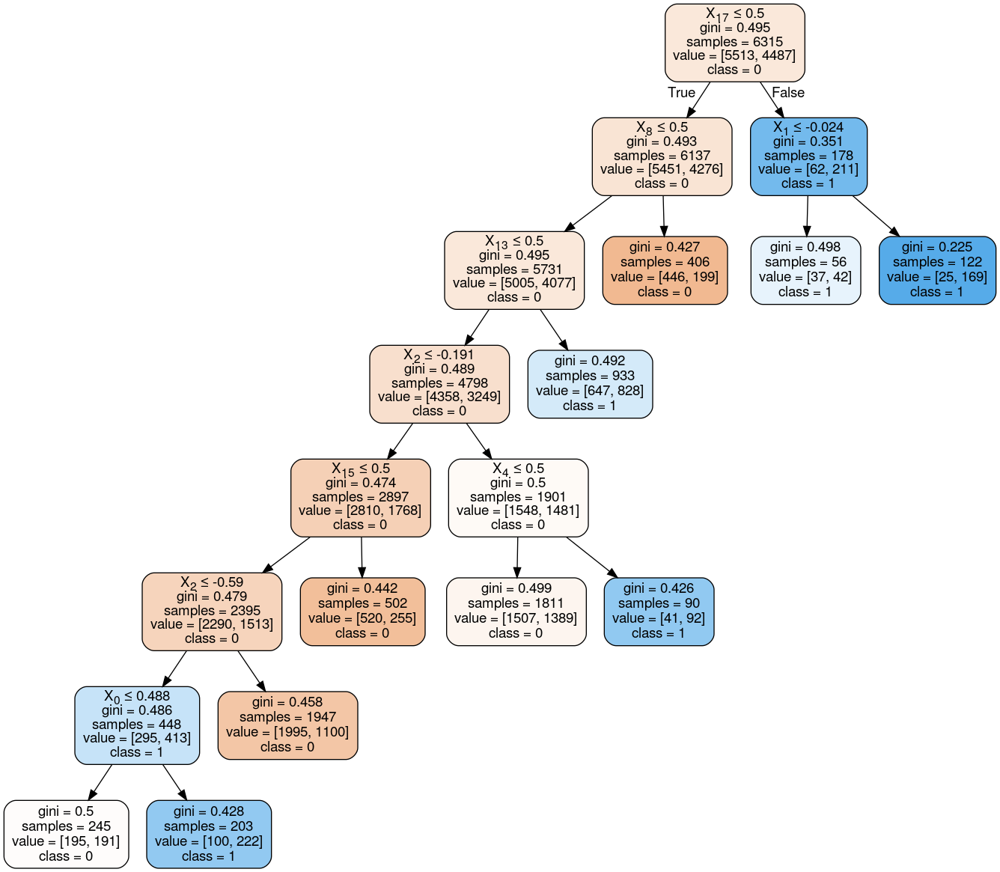

32


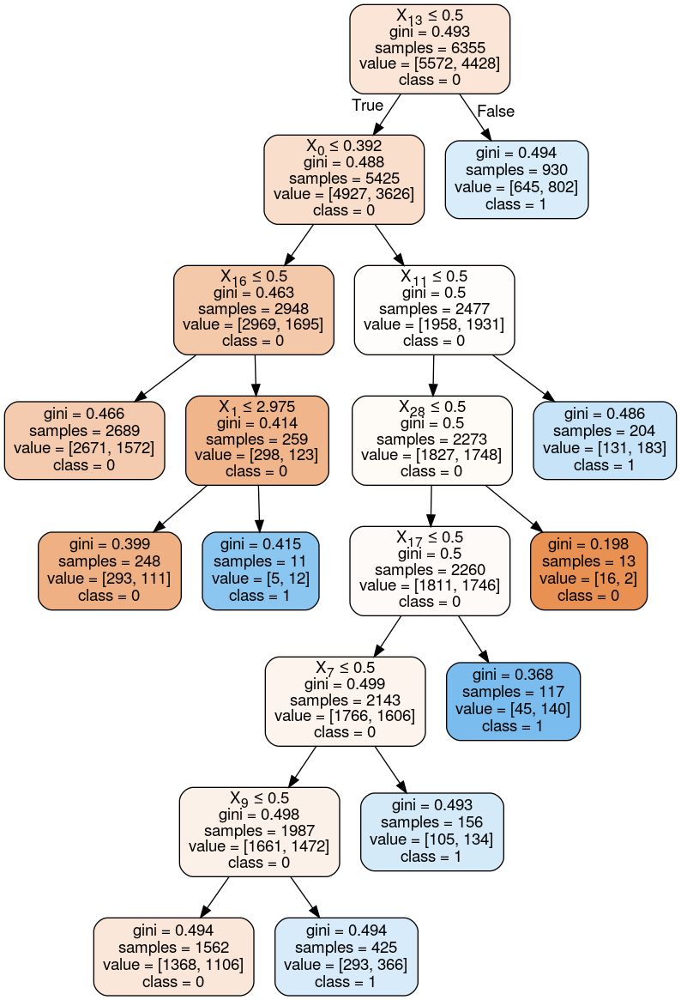

33


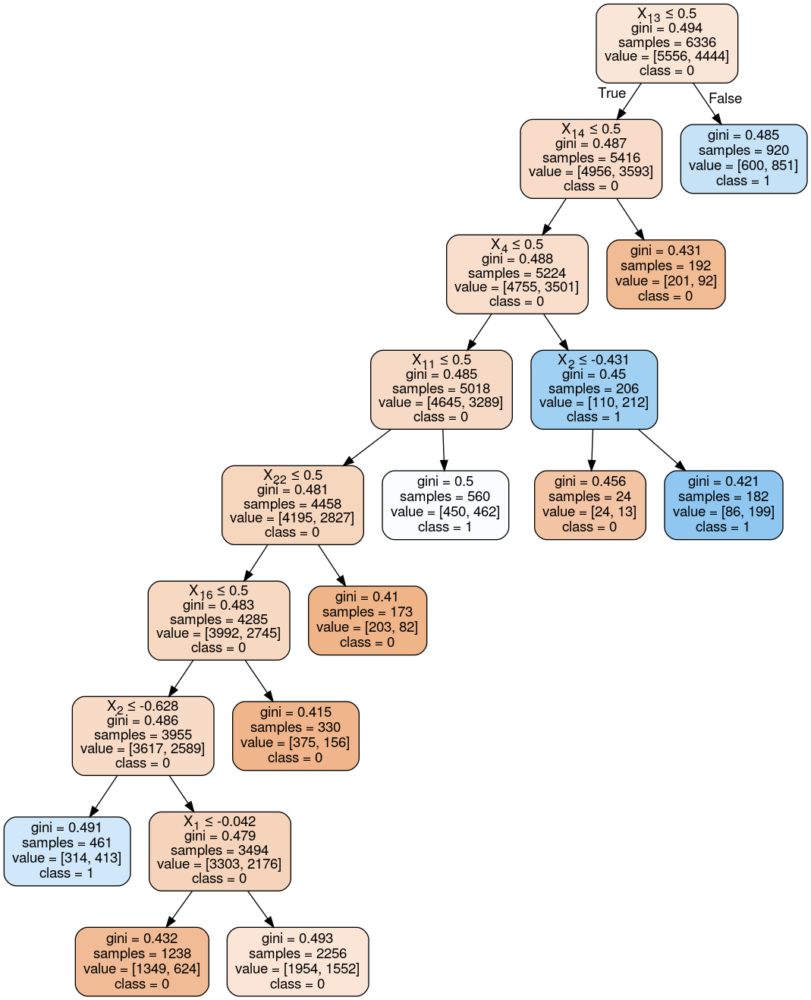

34


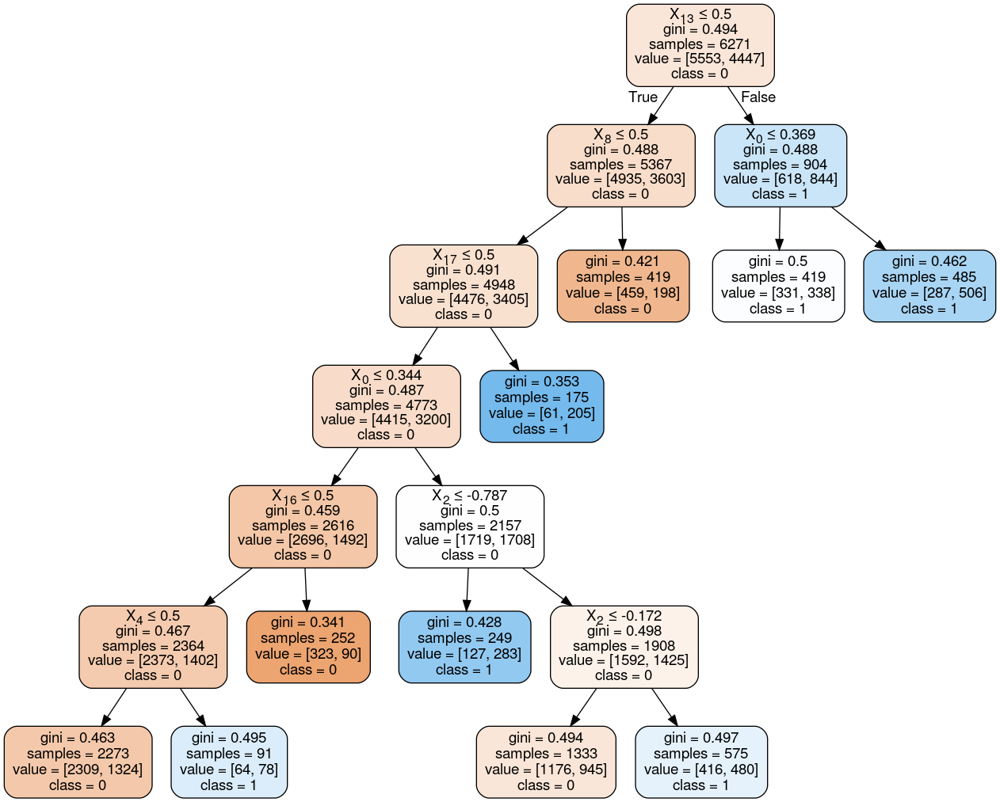

35


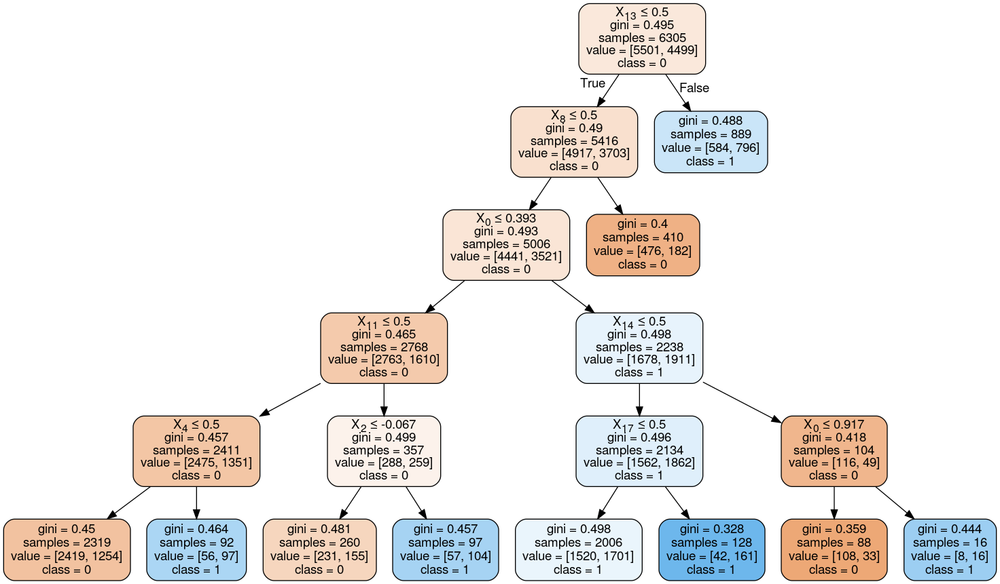

36


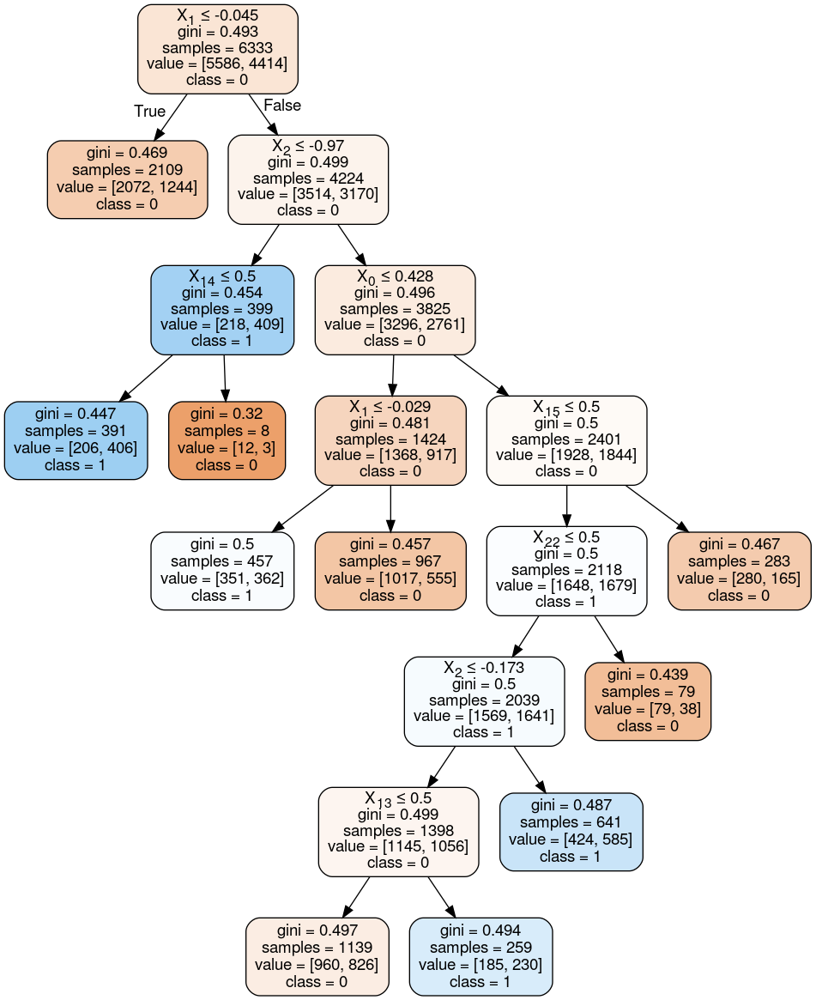

37


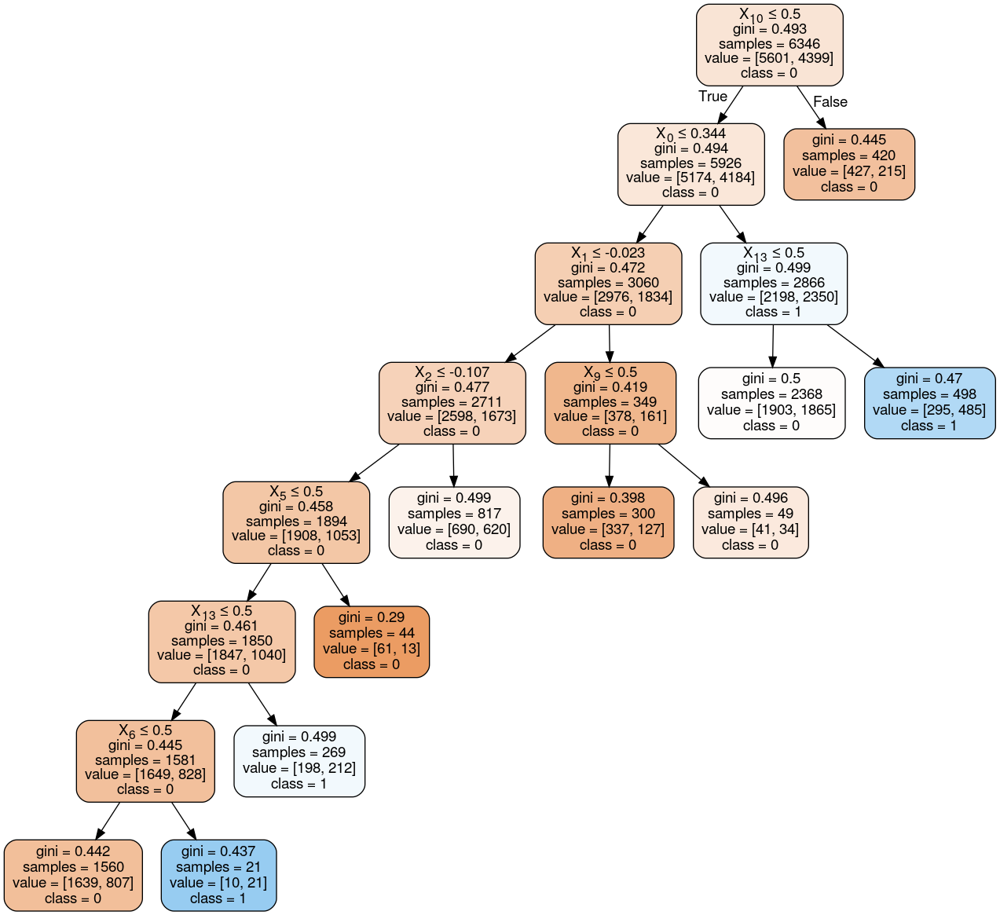

38


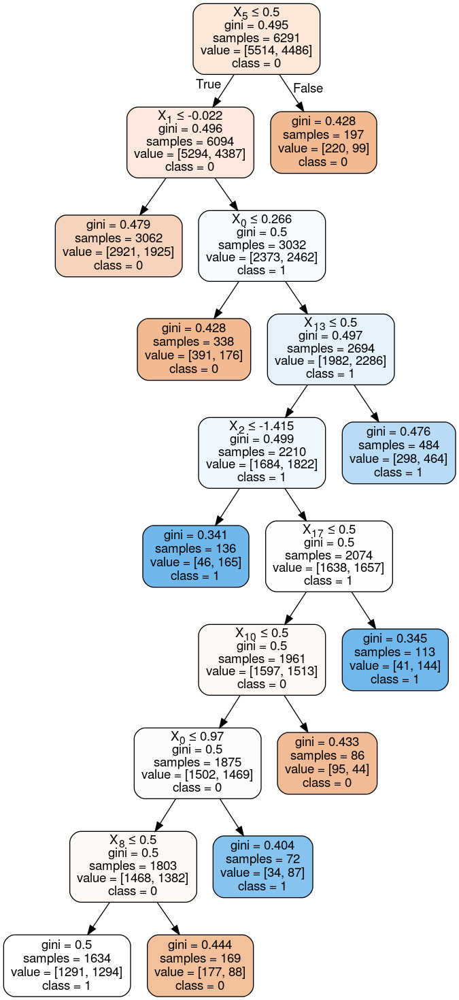

39


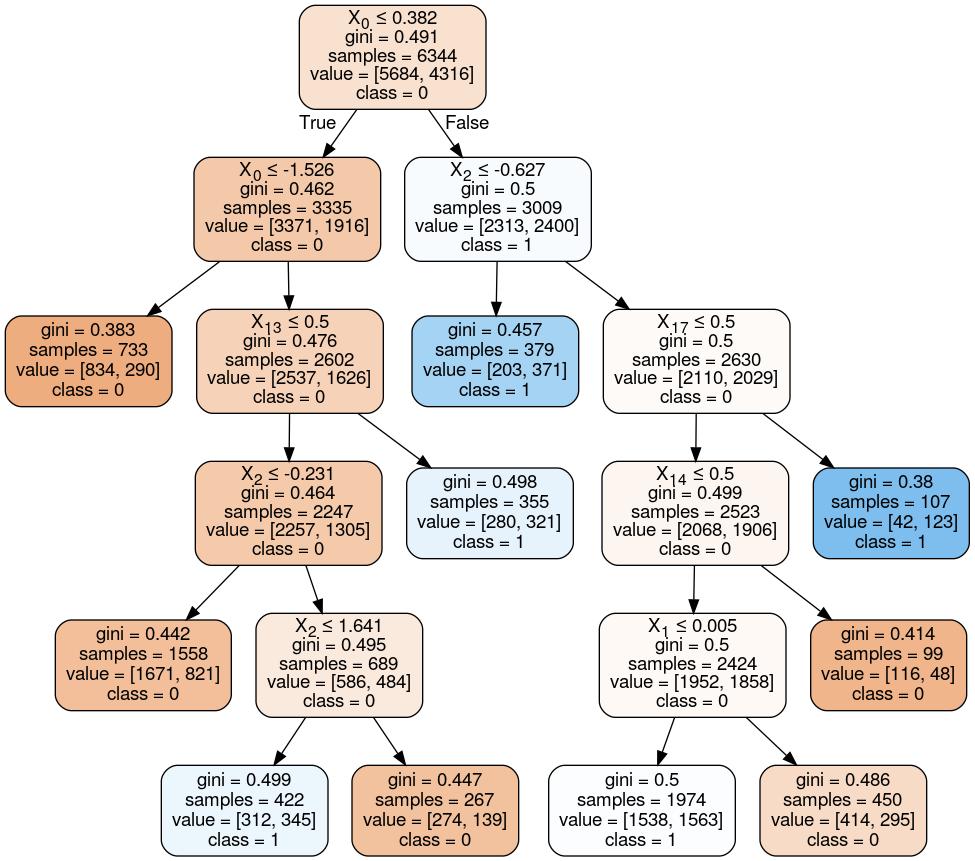

40


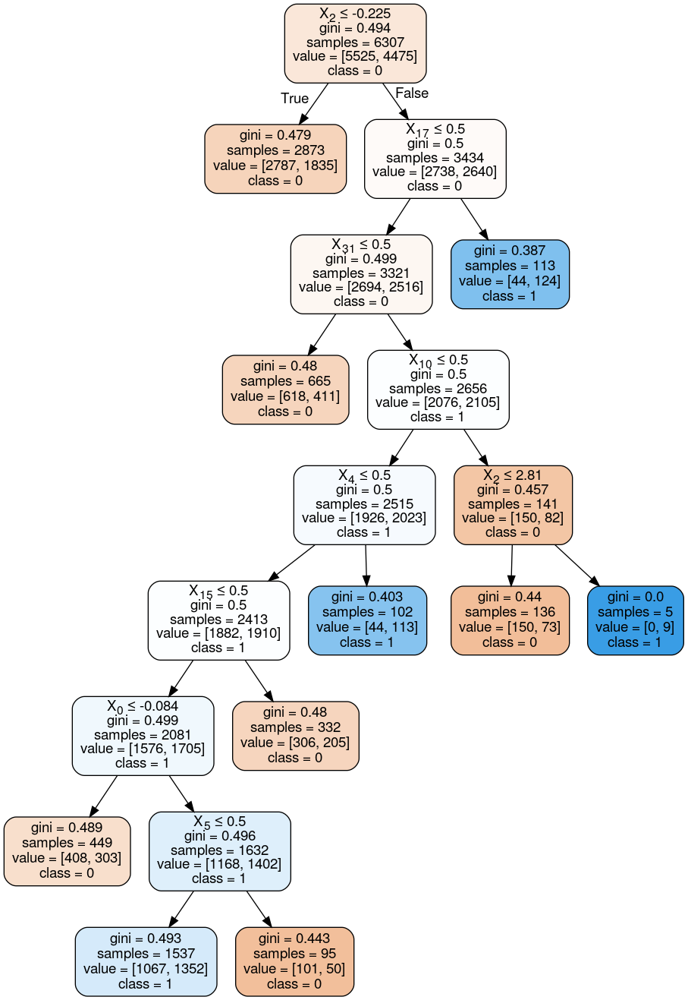

41


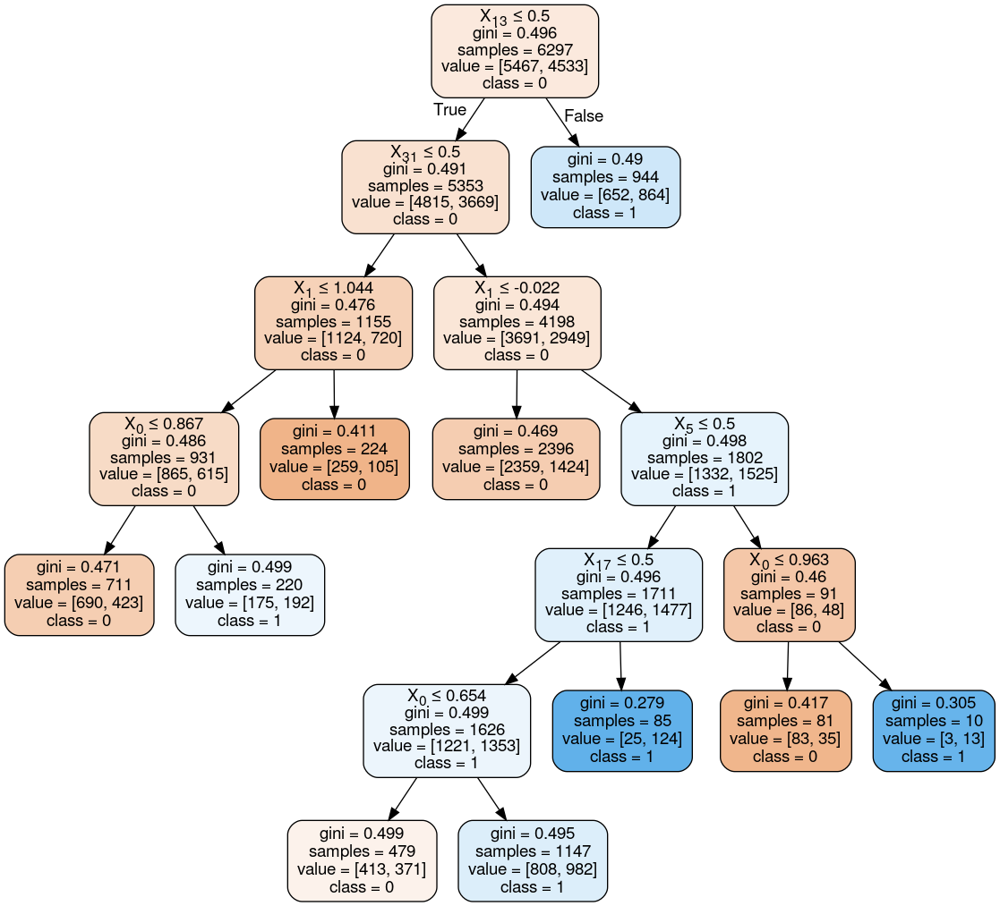

42


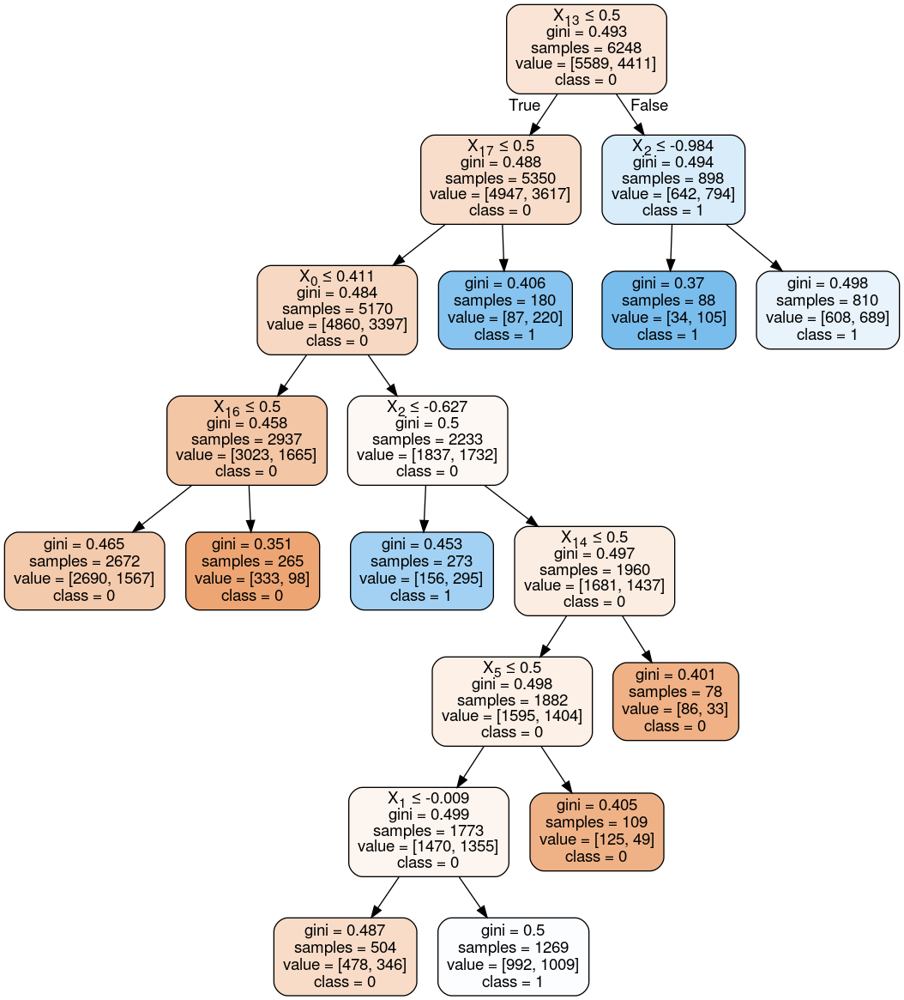

43


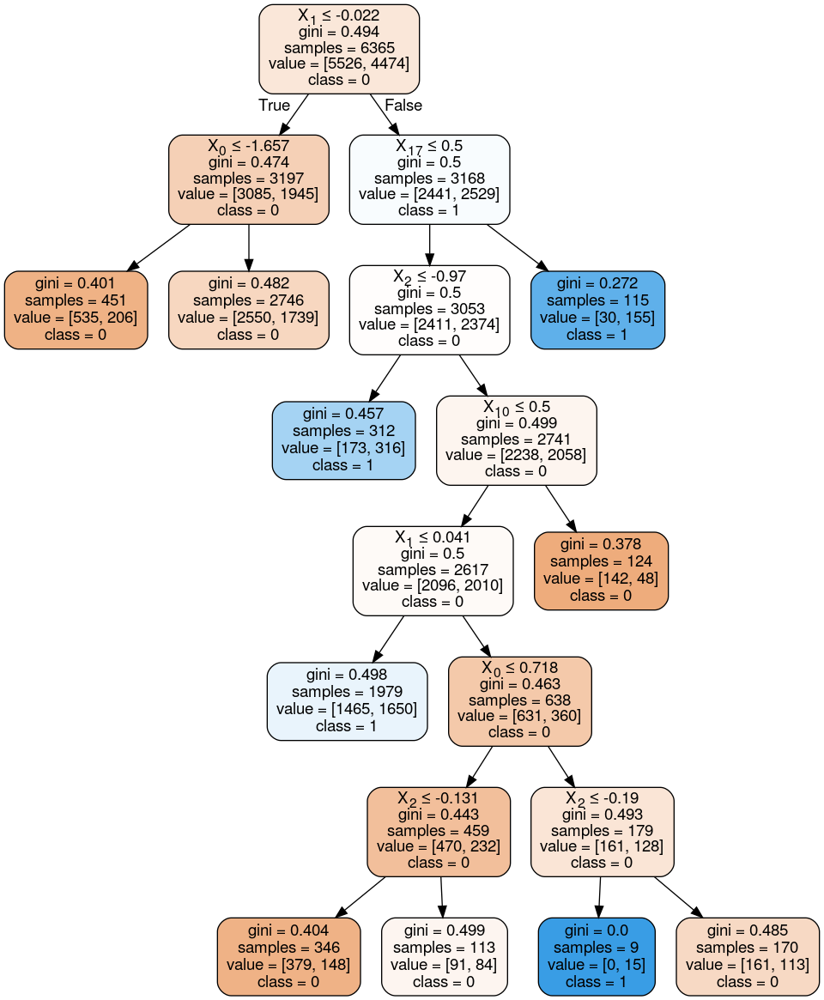

44


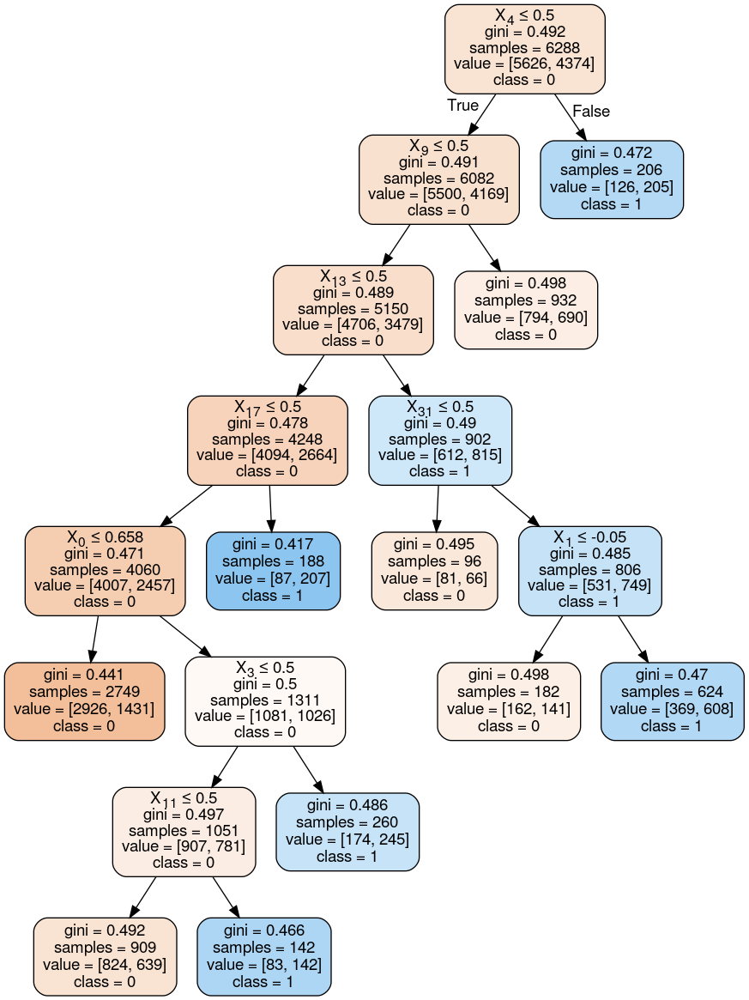

45


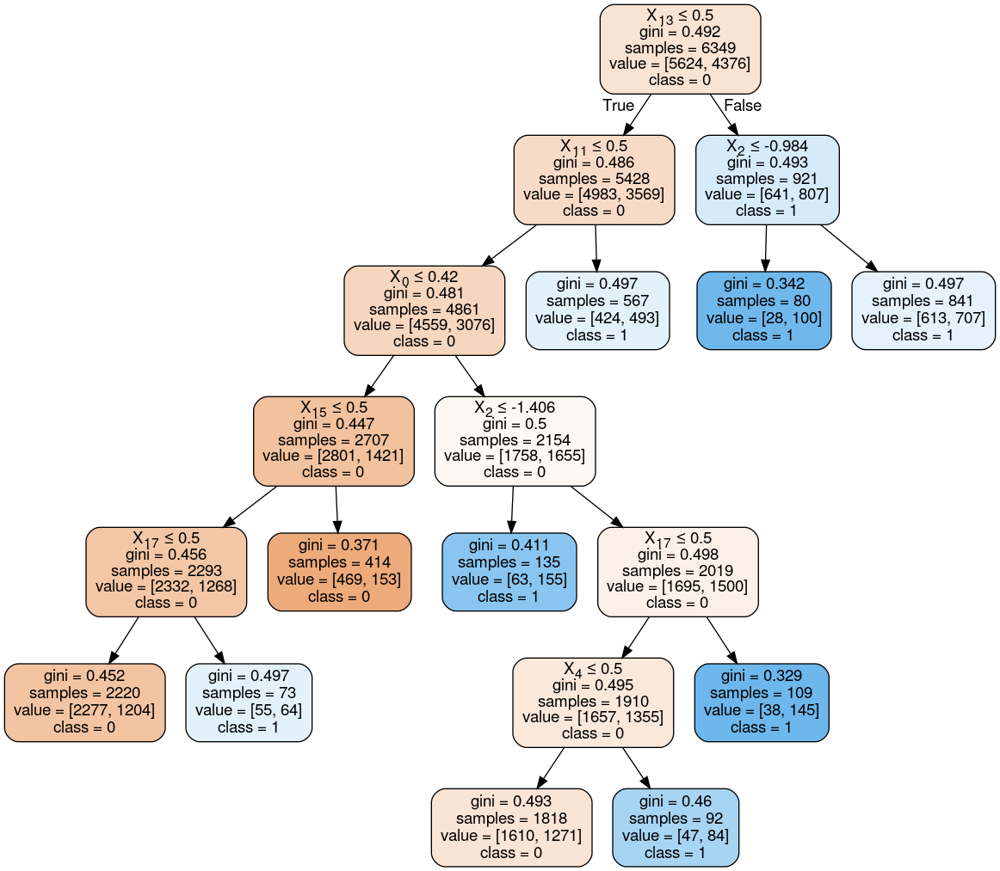

46


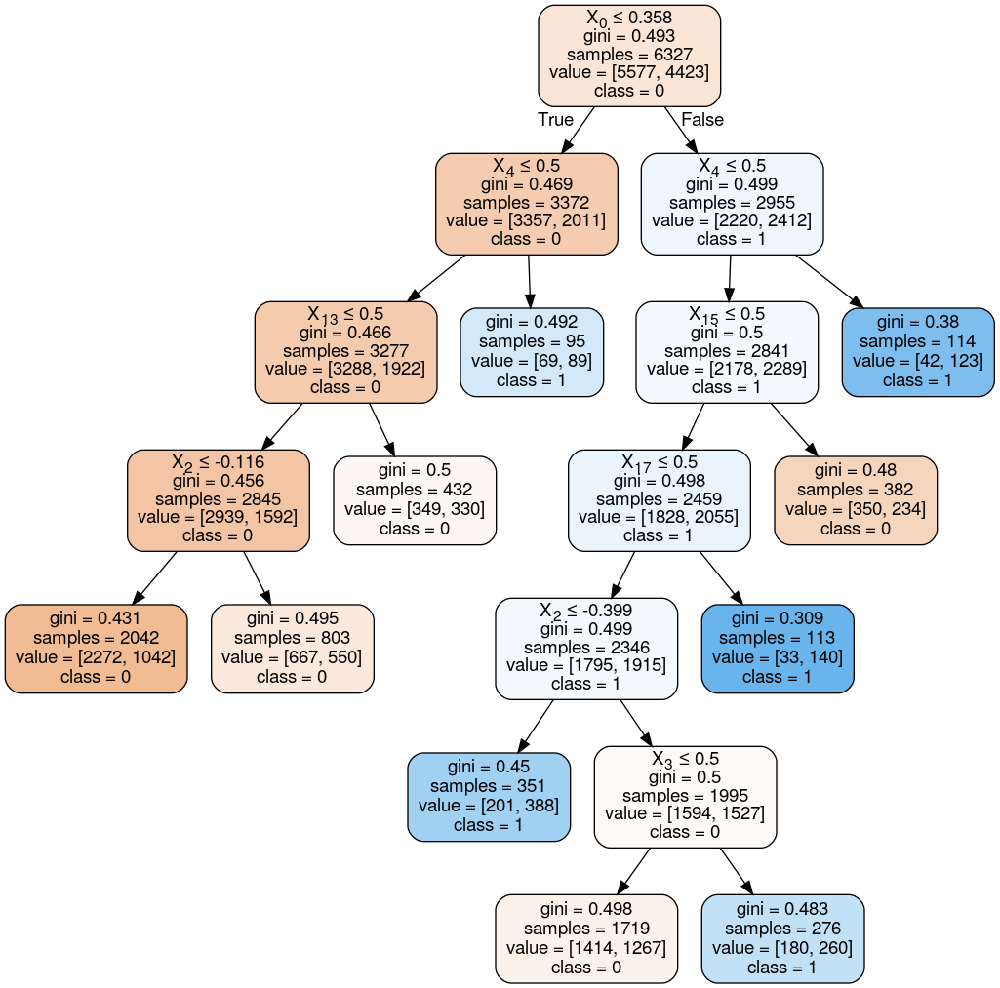

47


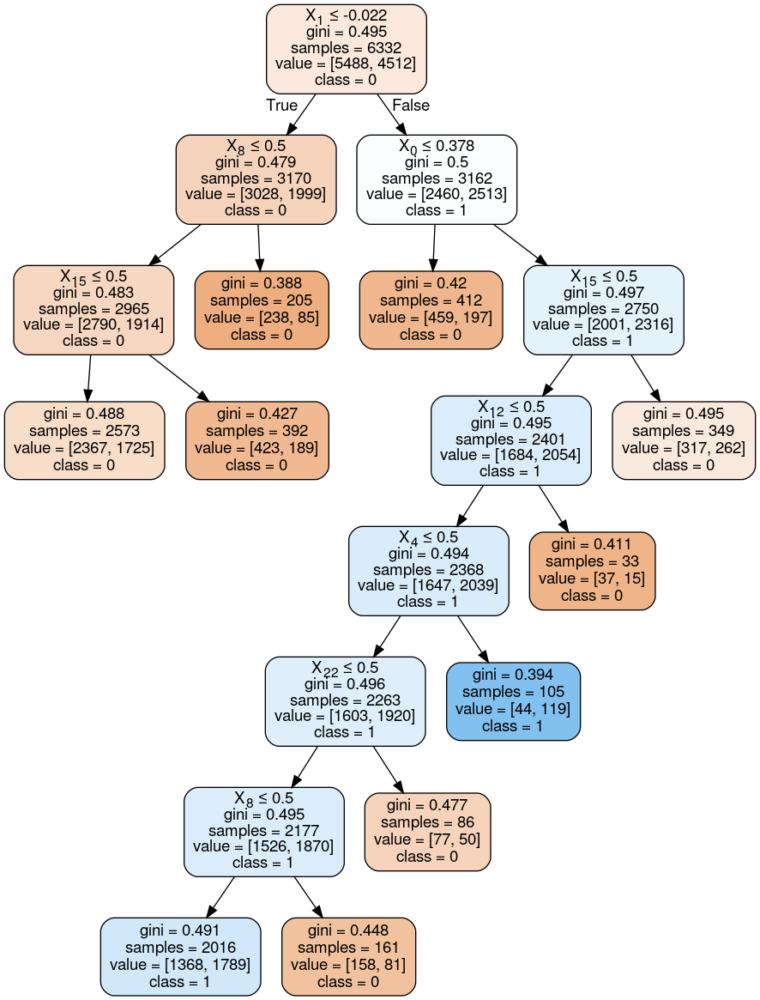

48


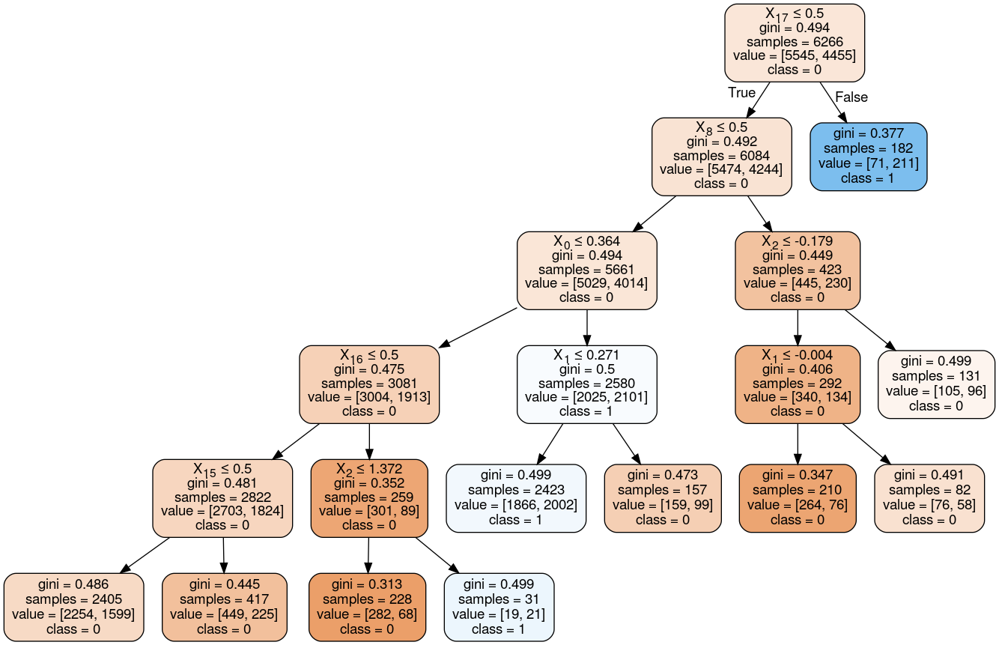

49


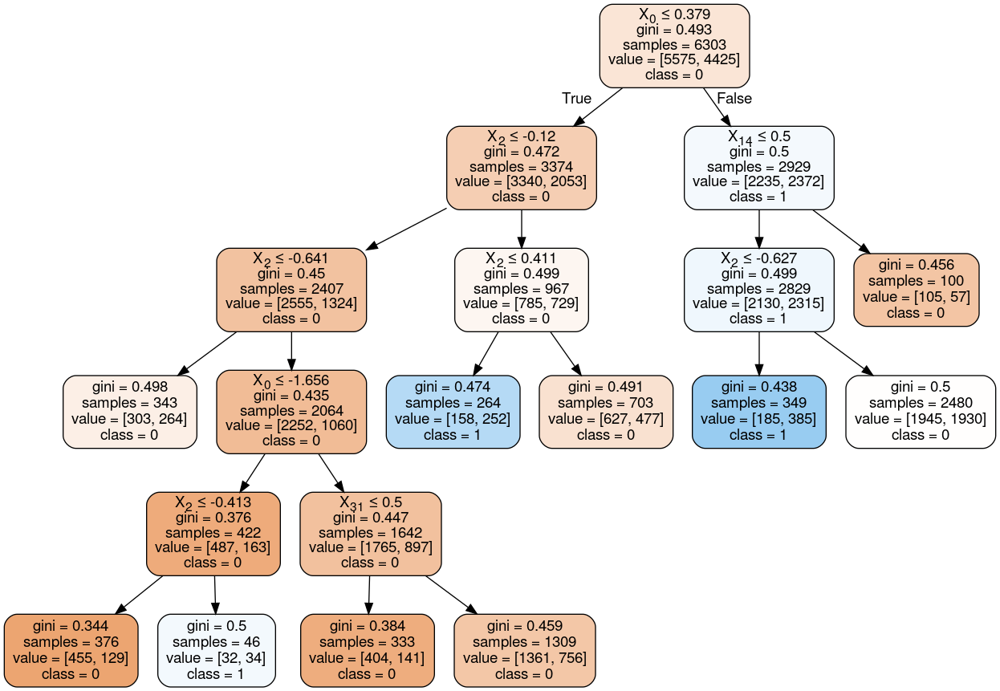

50


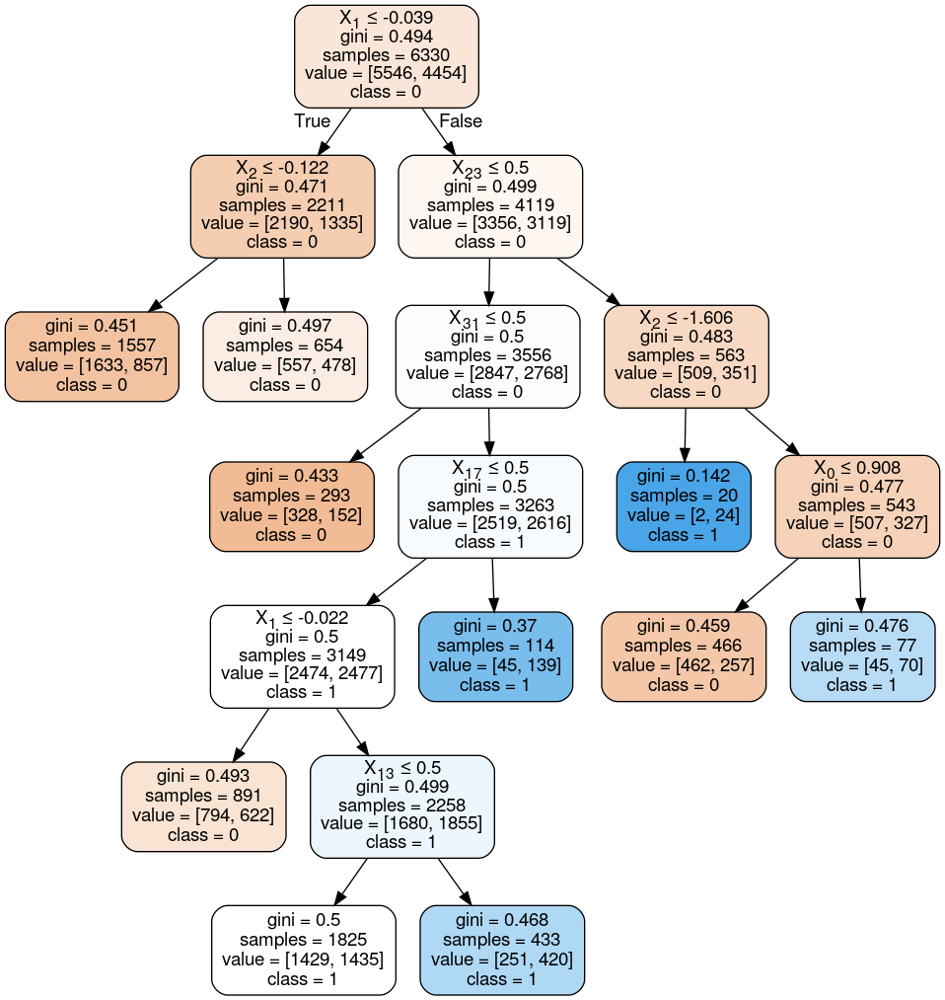

51


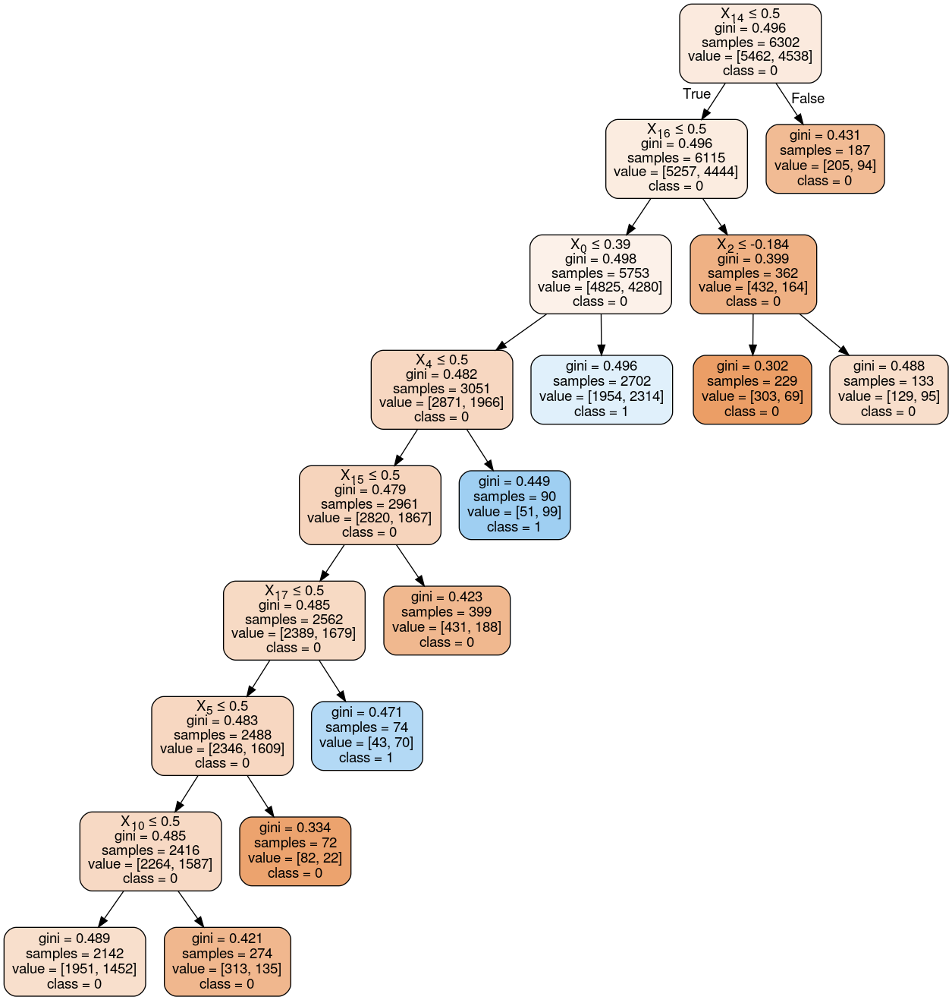

52


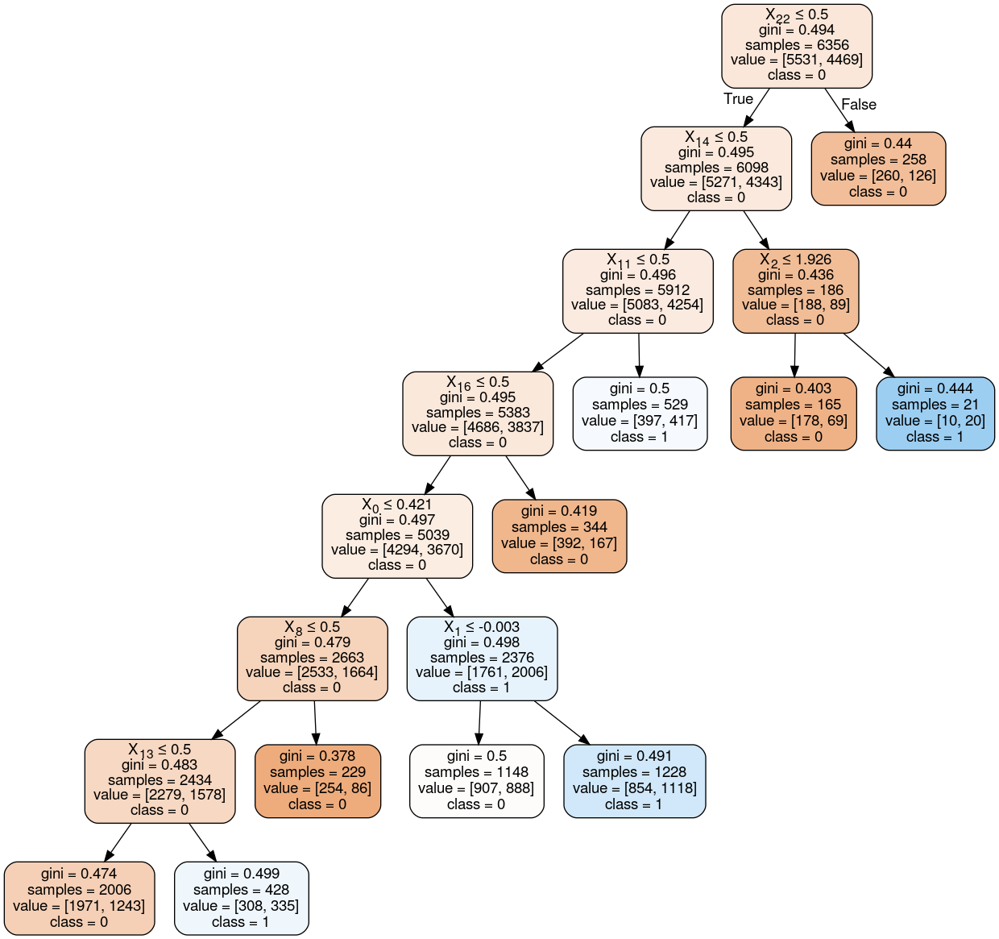

53


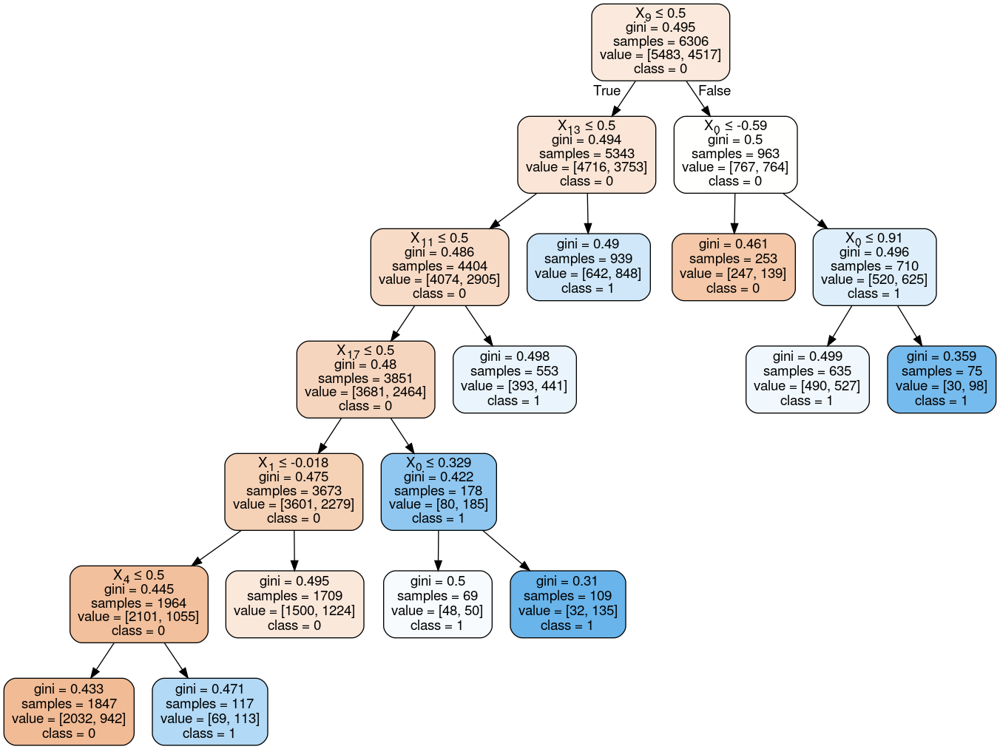

54


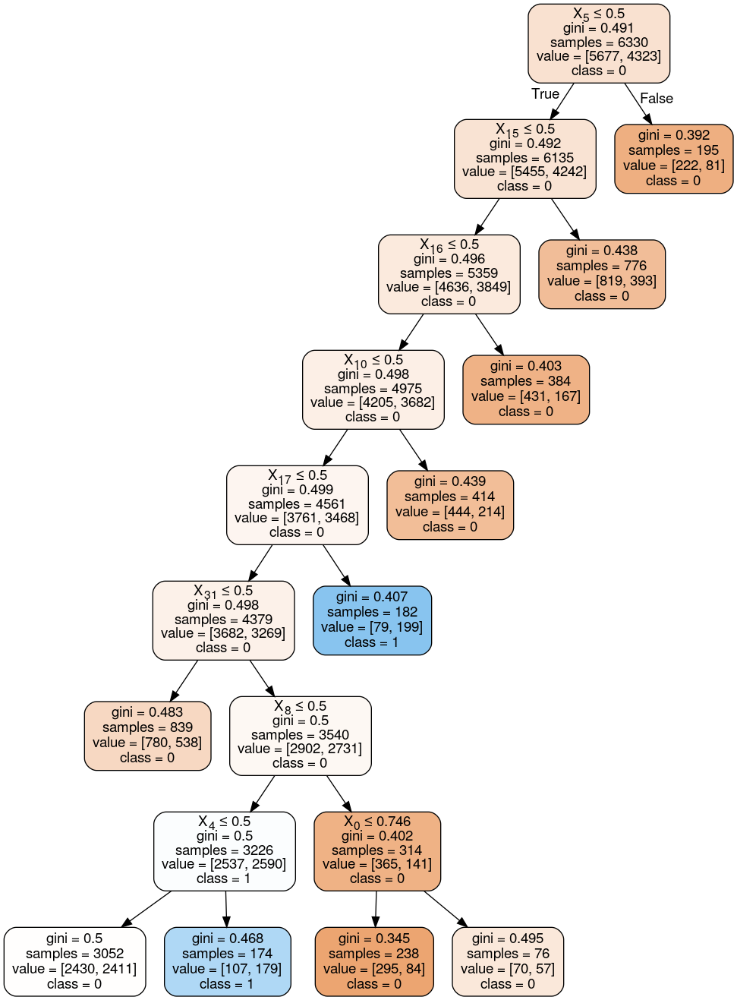

55


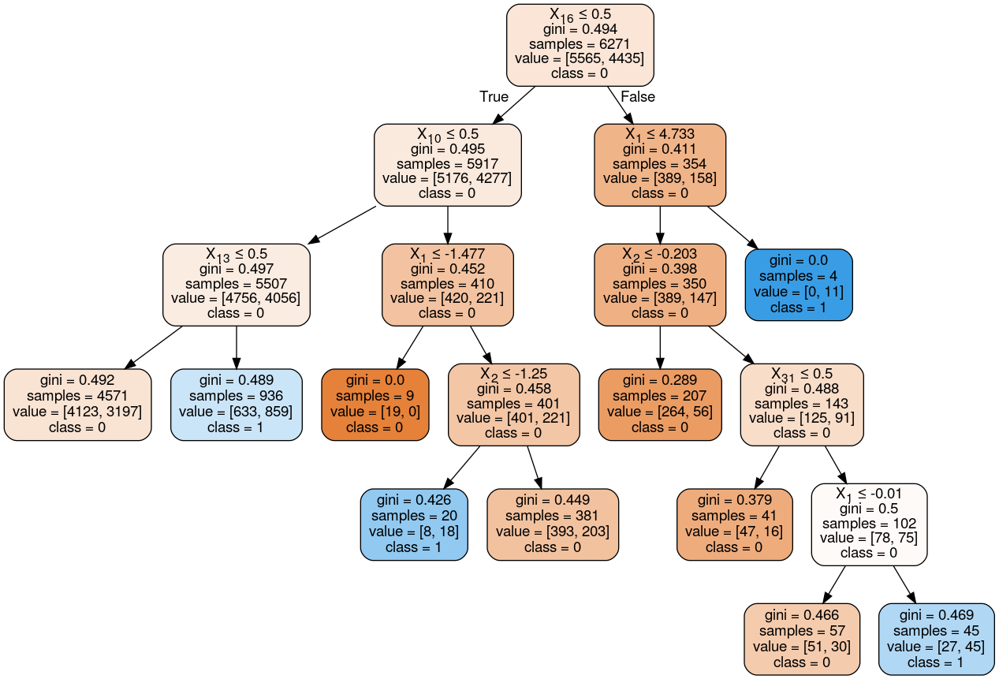

56


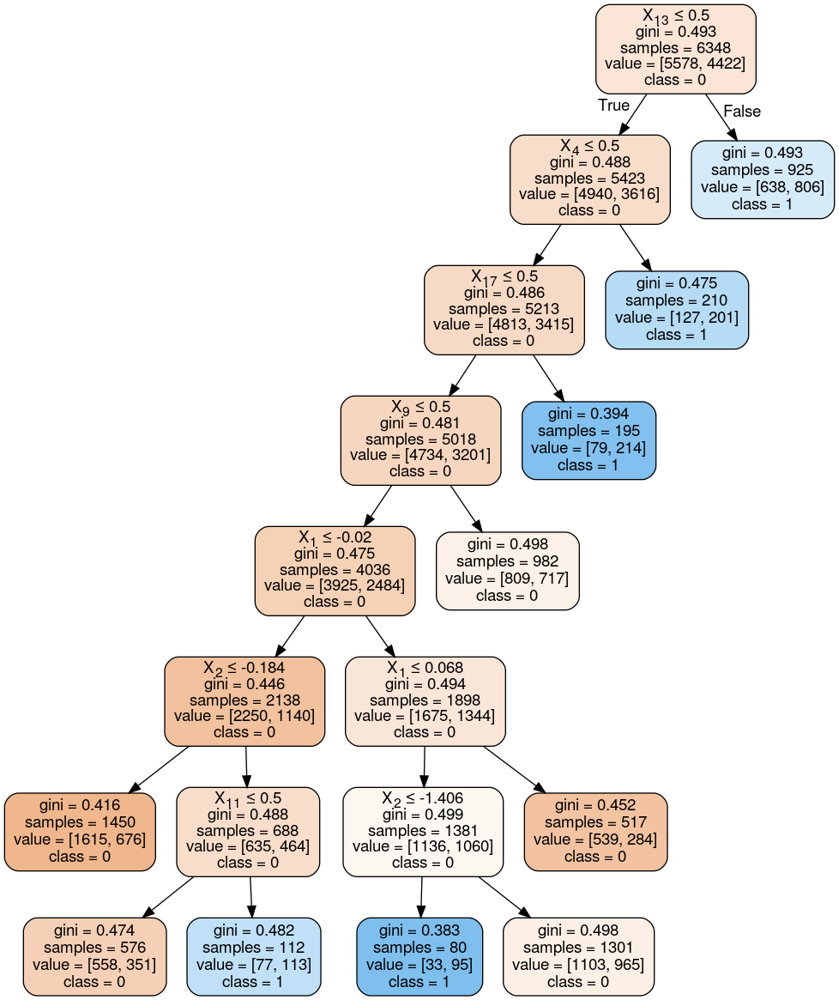

57


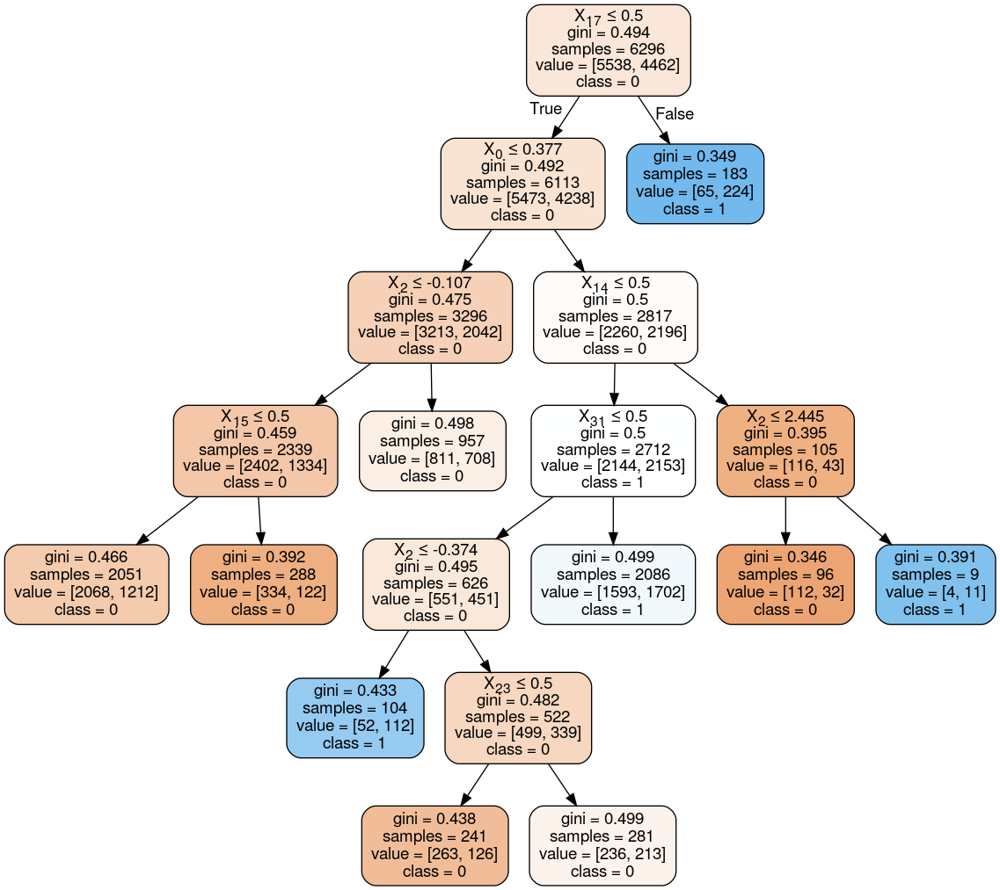

58


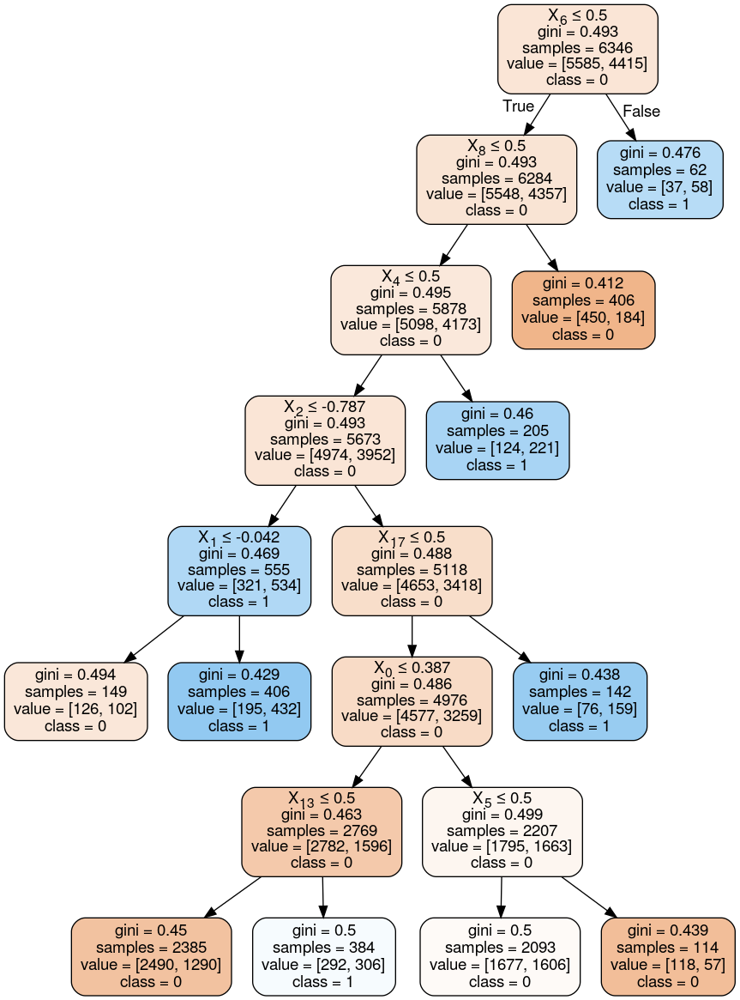

59


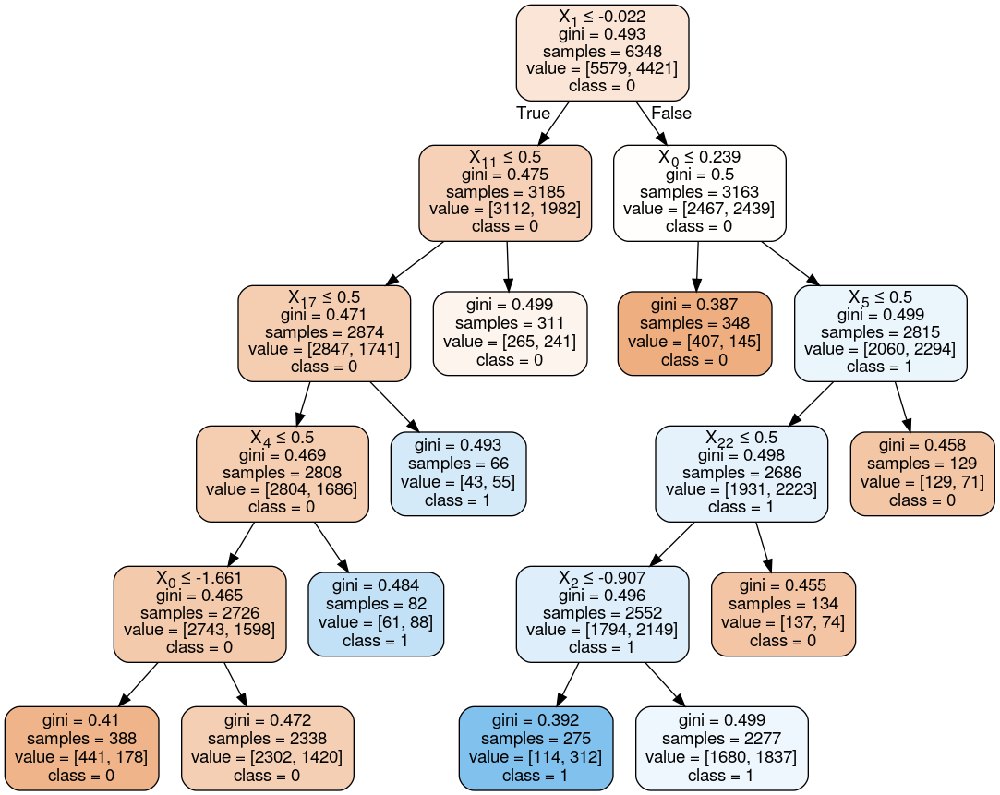

60


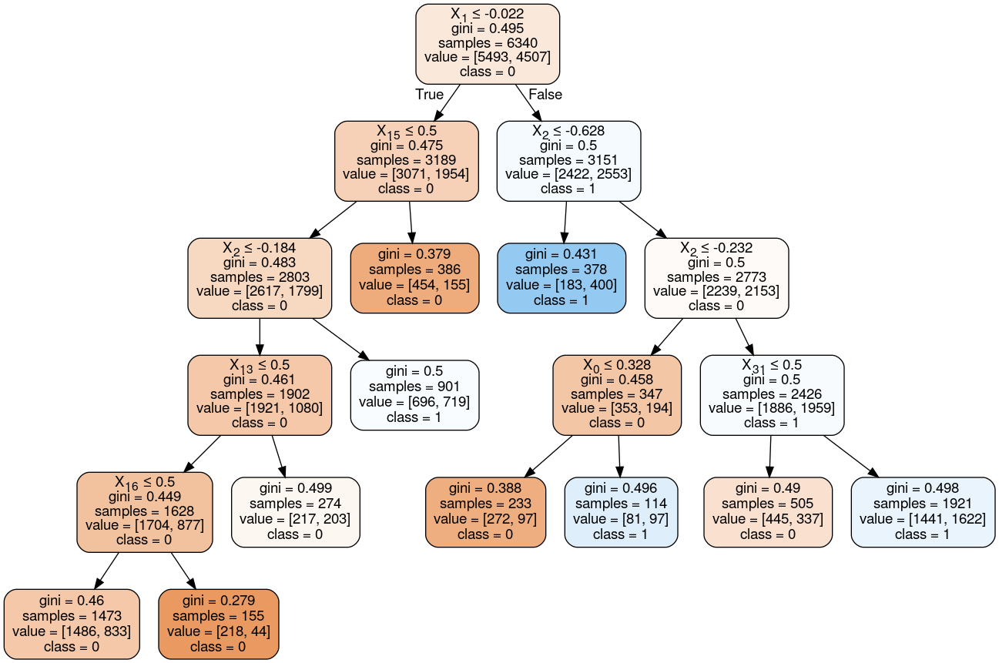

In [30]:
# 決定木の描画
from io import StringIO
import graphviz
import pydotplus
from IPython.display import Image


for i, est in enumerate(clf.estimators_):
    print(i)
    
    # 決定木の描画
    dot_data = StringIO() #dotファイル情報の格納先
    export_graphviz(est, out_file=dot_data,  
                         #feature_names=list(train_x.columns), 
                         class_names=["0","1"],  
                         filled=True, rounded=True,  
                         special_characters=True) 
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
    display(Image(graph.create_png()))

## 4.4 AdaBoostClassifier 

In [31]:
estimator = AdaBoostClassifier(DecisionTreeClassifier(max_depth= 10, min_samples_leaf=2, min_samples_split=2, random_state=0))


# k分割交差検証の実行
estimator.fit(train_x.iloc[0:10000, :], train_y.iloc[0:10000])

#結果表示
print('Cross validation scores : {}'.format(scores))
print('Cross validation scores : {:.3f}+-{:.3f}'.format(scores.mean(), scores.std()))

Cross validation scores : [0.05590182 0.05992083 0.05840842 0.06696311 0.05986065]
Cross validation scores : 0.060+-0.004


In [6]:
# 混合行列/AUC
def evaluate_model_performnce(y_test, y_pred):
    
    cm = confusion_matrix(y_test, y_pred)
    
    ax = plt.subplot()
    sns.heatmap(cm, annot=True, ax = ax , fmt="g")
    
    # labels, title and ticks
    ax.set_xlabel("Predicted labels"); ax.set_ylabel("True labels");
    ax.set_title("Confusion Matrix");
    
    tn, fp, fn, tp = cm.ravel()
    
    # 正確性(陽性だと予測した対象の中で、実際に陽性だった割合)
    precision = tp / (tp + fp)
    # 再現性(実際に陽性だった対象に対して、陽性だと予測した割合)
    recall = tp / (tp + fn)
    # F1 調和平均 (正確性と再現率)
    f1 = 2 * (precision * recall) / (precision + recall)
    # 精度
    accuracy = ((tp + tn) / (tp + fp + tn + fn))
    print("Precision : ",precision)
    print("Recall : ",recall)
    print("F1 Score : ",f1)
    print("Validation Accuracy : ",accuracy)
    accuracy = metrics.accuracy_score(y_test, y_pred)
    print("Accuracy Score : ", accuracy)
    
    # 偽陽性レート、真陽性レート
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
    # AUC値を算出
    auc = metrics.auc(fpr, tpr)
    print("AUC Value : ", auc)
    
    return accuracy, auc, f1

In [33]:
# #機械学習モデルをリストに格納
models = []

models.append(("XGBClassifier", XGBClassifier(random_state=0)))
models.append(("LightGBM",LGBMClassifier(random_state=0)))
models.append(("CatBoost",CatBoostClassifier(verbose=0,random_state=0)))

names = []
results = []
    
for name, model in models:

    print(model.fit(train_x.iloc[0:10000, :],train_y.iloc[0:10000]),"\n")
    
    kfold = KFold(n_splits=5, shuffle=True)
    result = cross_val_score(model,train_x.iloc[0:10000, :],train_y.iloc[0:10000], cv = kfold, scoring = "accuracy")
    names.append(name)
    results.append(result)

list_df = pd.DataFrame(columns=['識別子','スコア(平均)'])
 
for i in range(len(names_jp)):
    list_df = list_df.append( pd.Series( [names[i],results[i].mean()], index=list_df.columns ), ignore_index=True)

list_df

[23:30:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None) 

[23:30:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'err

,識別子,スコア(平均)
0,XGBClassifier,0.6208
1,LightGBM,0.6229
2,CatBoost,0.6275


* 識別子	      スコア(平均)
* XGBClassifier	0.6083
* LightGBM	    0.6215
* CatBoost	    0.6220

## 4.4 XGB 

* ハイパーパラメータ探索(ベイズ最適化）

In [ ]:
import optuna
import sklearn

def objective(trial):

    # パラメータ種類 & 探索範囲
    n_estimators = trial.suggest_int('n_estimators', 4, 100)
    max_depth = int(trial.suggest_loguniform('max_depth', 1, 32))
    subsample = trial.suggest_discrete_uniform('subsample', 0.5, 0.9, 0.1)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 20)
    colsample_bytree = trial.suggest_discrete_uniform('colsample_bytree', 0.5, 0.9, 0.1)
    max_leaf_nodes = int(trial.suggest_int("max_leaf_nodes", 2, 11))
    
    clf = XGBClassifier(
        random_state=0,
        n_estimators = n_estimators,
        max_depth = max_depth,
        subsample = subsample,
        max_leaf_nodes = max_leaf_nodes,
        colsample_bytree = colsample_bytree,
        min_child_weight = min_child_weight
    )
    
    # 層化分割交差検証
    skf = StratifiedKFold(shuffle=True, random_state=0)
    
    return sklearn.model_selection.cross_val_score(
        clf, train_x,  train_y, n_jobs=-1, cv=skf).mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

trial = study.best_trial

print('Accuracy: {}'.format(trial.value))
print("Best hyperparameters: {}".format(trial.params))

[I 2021-03-30 23:30:49,125] A new study created in memory with name: no-name-31bc4791-6622-4179-826f-d4bc4784a83e
[I 2021-03-30 23:31:04,329] Trial 0 finished with value: 0.6315177690646125 and parameters: {'n_estimators': 5, 'max_depth': 8.767745109138964, 'subsample': 0.7, 'min_child_weight': 2, 'colsample_bytree': 0.9, 'max_leaf_nodes': 9}. Best is trial 0 with value: 0.6315177690646125.
[I 2021-03-30 23:32:07,516] Trial 1 finished with value: 0.6358163398307957 and parameters: {'n_estimators': 100, 'max_depth': 3.9471863658468127, 'subsample': 0.8, 'min_child_weight': 3, 'colsample_bytree': 0.9, 'max_leaf_nodes': 10}. Best is trial 1 with value: 0.6358163398307957.
[I 2021-03-30 23:33:56,969] Trial 2 finished with value: 0.6357492530968206 and parameters: {'n_estimators': 65, 'max_depth': 8.395230295750103, 'subsample': 0.8, 'min_child_weight': 16, 'colsample_bytree': 0.7, 'max_leaf_nodes': 11}. Best is trial 1 with value: 0.6358163398307957.
[I 2021-03-30 23:40:35,624] Trial 3 fin

[I 2021-03-31 00:12:57,413] Trial 30 finished with value: 0.6360846595828615 and parameters: {'n_estimators': 92, 'max_depth': 8.217259310534319, 'subsample': 0.5, 'min_child_weight': 9, 'colsample_bytree': 0.5, 'max_leaf_nodes': 10}. Best is trial 16 with value: 0.6373591458314427.
[I 2021-03-31 00:14:04,884] Trial 31 finished with value: 0.6364871312432849 and parameters: {'n_estimators': 56, 'max_depth': 6.517355205561553, 'subsample': 0.6, 'min_child_weight': 13, 'colsample_bytree': 0.6, 'max_leaf_nodes': 10}. Best is trial 16 with value: 0.6373591458314427.
[I 2021-03-31 00:15:19,159] Trial 32 finished with value: 0.6358666569513102 and parameters: {'n_estimators': 65, 'max_depth': 6.493051821308818, 'subsample': 0.7, 'min_child_weight': 12, 'colsample_bytree': 0.6, 'max_leaf_nodes': 9}. Best is trial 16 with value: 0.6373591458314427.
[I 2021-03-31 00:16:01,110] Trial 33 finished with value: 0.6357436840041151 and parameters: {'n_estimators': 53, 'max_depth': 4.435886503869914, '

*  Accuracy:  0.6373591458314427
* Best hyperparameters:  {'n_estimators': 89, 'max_depth': 7.817190096191746, 'subsample': 0.7, 'min_child_weight': 18, 'colsample_bytree': 0.7}

### 特微量選択

#### ① デフォルトデータ

Precision :  0.6097894279147773
Recall :  0.49391225598712013
F1 Score :  0.5457678943710911
Validation Accuracy :  0.6346338736724427
Accuracy Score :  0.6346338736724427
AUC Value :  0.6205526509924735


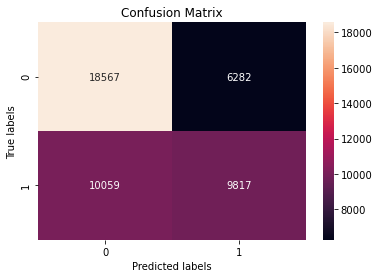

In [7]:
xgb_clf = XGBClassifier(**{'n_estimators': 89, 'max_depth': 8, 'subsample': 0.7, 'min_child_weight': 18, 'colsample_bytree': 0.7})
xgb_clf.fit(train_x, train_y, eval_metric=["auc", "logloss"],verbose = True)

threshold = 0.5
xgb_val_prob = xgb_clf.predict_proba(val_x)
xgb_val_prob = pd.DataFrame(xgb_val_prob)[1]
xgb_val_pred = [ 1 if x >= threshold else 0 for x in xgb_val_prob]
xgb_acc, xgb_auc, xgb_f1 = evaluate_model_performnce(val_y, xgb_val_pred)

#### ② RFE

Precision :  0.6057345515748979
Recall :  0.5069933588247132
F1 Score :  0.5519829097283085
Validation Accuracy :  0.634253773057574
Accuracy Score :  0.634253773057574
AUC Value :  0.6215195374750553


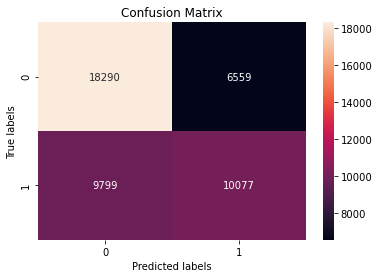

In [50]:
xgb_clf = XGBClassifier(**{'n_estimators': 89, 'max_depth': 8, 'subsample': 0.7, 'min_child_weight': 18, 'colsample_bytree': 0.7})
xgb_clf.fit(rfecv_train, train_y, eval_metric=["auc", "logloss"],verbose = True)

threshold = 0.5
xgb_rfecv_val_prob = xgb_clf.predict_proba(rfecv_test)
xgb_rfecv_val_prob = pd.DataFrame(xgb_rfecv_val_prob)[1]
xgb_rfecv_val_pred = [ 1 if x >= threshold else 0 for x in xgb_rfecv_val_prob]
xgb_rfecv_acc, xgb_rfecv_auc, xgb_rfecv_f1 = evaluate_model_performnce(val_y, xgb_rfecv_val_pred)

#### ③ Lasso

Precision :  0.6067134574305767
Recall :  0.5001509358019722
F1 Score :  0.5483025840434625
Validation Accuracy :  0.6337842370039128
Accuracy Score :  0.6337842370039128
AUC Value :  0.6204123023812469


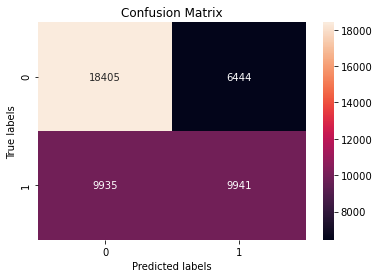

In [51]:
xgb_clf = XGBClassifier(**{'n_estimators': 89, 'max_depth': 8, 'subsample': 0.7, 'min_child_weight': 18, 'colsample_bytree': 0.7})
xgb_clf.fit(lasso_train, train_y, eval_metric=["auc", "logloss"],verbose = True)

threshold = 0.5
xgb_lasso_val_prob = xgb_clf.predict_proba(lasso_test)
xgb_lasso_val_prob = pd.DataFrame(xgb_lasso_val_prob)[1]
xgb_lasso_val_pred = [ 1 if x >= threshold else 0 for x in xgb_lasso_val_prob]
xgb_lasso_acc, xgb_lasso_auc, xgb_lasso_f1 = evaluate_model_performnce(val_y, xgb_lasso_val_pred)

## 4.5 LGBMClassifier 

* ハイパーパラメータ探索(ベイズ最適化）

In [ ]:
import optuna
import sklearn

def objective(trial):

    # パラメータ種類 & 探索範囲
    n_estimators = trial.suggest_int('n_estimators', 4, 100)
    max_depth = int(trial.suggest_loguniform('max_depth', 1, 32))
    subsample = trial.suggest_discrete_uniform('subsample', 0.5, 0.9, 0.1)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 20)
    colsample_bytree = trial.suggest_discrete_uniform('colsample_bytree', 0.5, 0.9, 0.1)
    alpha = int(trial.suggest_int("max_leaf_nodes", 2, 11))
    
    clf = LGBMClassifier(
        random_state=0,
        n_estimators = n_estimators,
        max_depth = max_depth,
        subsample = subsample,
        alpha = alpha,
        colsample_bytree = colsample_bytree,
        min_child_weight = min_child_weight
    )
    
    # 層化分割交差検証
    skf = StratifiedKFold(shuffle=True, random_state=0)
    
    return sklearn.model_selection.cross_val_score(
        clf, train_x,  train_y, n_jobs=-1, cv=skf).mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

trial = study.best_trial

print('Accuracy: {}'.format(trial.value))
print("Best hyperparameters: {}".format(trial.params))

* Accuracy: 0.6359840244044588
* Best hyperparameters: {'n_estimators': 87, 'max_depth': 11.187104401214084, 
                        'subsample': 0.8, 'min_child_weight': 8, 'colsample_bytree': 0.7, 'max_leaf_nodes': 8}

### 特微量選択

#### ① デフォルトデータ

[LightGBM] [Warning] Unknown parameter: max_leaf_nodes
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Precision :  0.6139049534825245
Recall :  0.4913463473535923
F1 Score :  0.5458305387882852
Validation Accuracy :  0.6366238121855785
Accuracy Score :  0.6366238121855785
AUC Value :  0.6220867114449156


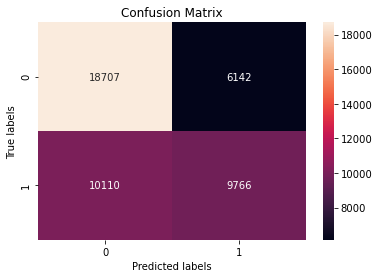

In [8]:
param = {'n_estimators': 87, 'max_depth': 11,'subsample': 0.8, 'min_child_weight': 8, 'colsample_bytree': 0.7, 'max_leaf_nodes': 8}
clf = LGBMClassifier(**param)
clf.fit(train_x, train_y, eval_metric=["auc", "logloss"],verbose = True)

threshold = 0.5
lgb_val_prob = clf.predict_proba(val_x)
val_prob = clf.predict_proba(val_x)
val_prob = pd.DataFrame(val_prob)[1]
val_pred = [ 1 if x >= threshold else 0 for x in val_prob]
acc, auc, f1 = evaluate_model_performnce(val_y, val_pred)

#### ② RFE

[LightGBM] [Warning] Unknown parameter: max_leaf_nodes
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Precision :  0.6108450012281995
Recall :  0.5004528074059167
F1 Score :  0.5501659292035399
Validation Accuracy :  0.6363107881498044
Accuracy Score :  0.6363107881498044
AUC Value :  0.6227162423282553


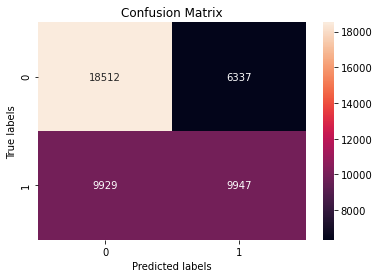

In [52]:
param = {'n_estimators': 87, 'max_depth': 11,'subsample': 0.8, 'min_child_weight': 8, 'colsample_bytree': 0.7, 'max_leaf_nodes': 8}
clf = LGBMClassifier(**param)
clf.fit(rfecv_train, train_y, eval_metric=["auc", "logloss"],verbose = True)

threshold = 0.5
lgb_rfecv_val_prob = clf.predict_proba(rfecv_test)
lgb_rfecv_val_prob = pd.DataFrame(lgb_rfecv_val_prob)[1]
lgb_rfecv_val_pred = [ 1 if x >= threshold else 0 for x in lgb_rfecv_val_prob]
lgb_rfecv_acc, lgb_rfecv_auc, lgb_rfecv_f1 = evaluate_model_performnce(val_y, lgb_rfecv_val_pred)

#### ③ Lasso

[LightGBM] [Warning] Unknown parameter: max_leaf_nodes
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Precision :  0.6115272704760726
Recall :  0.49698128396055546
F1 Score :  0.5483360626162258
Validation Accuracy :  0.6361542761319172
Accuracy Score :  0.6361542761319172
AUC Value :  0.6222280157176514


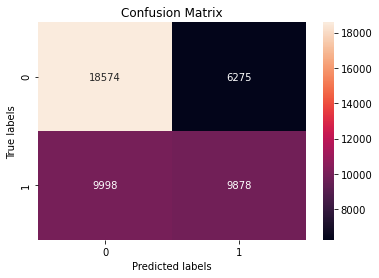

In [53]:
param = {'n_estimators': 87, 'max_depth': 11,'subsample': 0.8, 'min_child_weight': 8, 'colsample_bytree': 0.7, 'max_leaf_nodes': 8}
clf = LGBMClassifier(**param)
clf.fit(lasso_train, train_y, eval_metric=["auc", "logloss"],verbose = True)

threshold = 0.5
lgb_lasso_val_prob = clf.predict_proba(lasso_test)
lgb_lasso_val_prob = pd.DataFrame(lgb_lasso_val_prob)[1]
lgb_lasso_val_pred = [ 1 if x >= threshold else 0 for x in lgb_lasso_val_prob]
lgb_lasso_acc, lgb_lasso_auc, lgb_lasso_f1 = evaluate_model_performnce(val_y, lgb_lasso_val_pred)

## 4.6 CatBoostClassifier

In [ ]:

model = CatBoostClassifier()
#pprint.pprint(model.get_params())
# パラメーターを設定する
param_grid = {'depth': [i for i in range(4, 11)],
         'learning_rate' : [0.01, 0.1, 0.15],
         'l2_leaf_reg': [i for i in range(1, 11)],
         "bagging_temperature":[i for i in range(1, 11)],
         'iterations': [300]}

# パラメータチューニングをグリッドサーチで行うために設定する
## このGridSearchCV には注意が必要 scoring は そのスコアを基準にして最適化する
grid_result = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'accuracy',
                           cv = 3,
                           verbose=3,
                           return_train_score = True,
                           n_jobs = -1)
grid_result.fit(train_x, train_y)

In [ ]:
import optuna
import sklearn

def objective(trial):

    # パラメータ種類 & 探索範囲
    n_estimators = trial.suggest_int('n_estimators', 4, 100)
    max_depth = int(trial.suggest_loguniform('max_depth', 1, 32))
    subsample = trial.suggest_discrete_uniform('subsample', 0.5, 0.9, 0.1)
    
    clf = CatBoostClassifier(
        random_state=0,
        n_estimators = n_estimators,
        max_depth = max_depth,
        subsample = subsample
    )
    
    # 層化分割交差検証
    skf = StratifiedKFold(shuffle=True, random_state=0)
    
    return sklearn.model_selection.cross_val_score(
        clf, train_x,  train_y, n_jobs=-1, cv=skf).mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

trial = study.best_trial

print('Accuracy: {}'.format(trial.value))
print("Best hyperparameters: {}".format(trial.params))

* Accuracy: 0.6350281703415904
* Best hyperparameters: {'n_estimators': 77, 'max_depth': 4.030614882212476, 'subsample': 0.8}

### 特微量選択

#### ① デフォルトデータ

Learning rate set to 0.5
0:	learn: 0.6728225	total: 99.8ms	remaining: 7.58s
1:	learn: 0.6636647	total: 131ms	remaining: 4.93s
2:	learn: 0.6577779	total: 164ms	remaining: 4.03s
3:	learn: 0.6543920	total: 196ms	remaining: 3.58s
4:	learn: 0.6507965	total: 231ms	remaining: 3.33s
5:	learn: 0.6490465	total: 267ms	remaining: 3.16s
6:	learn: 0.6472814	total: 299ms	remaining: 2.98s
7:	learn: 0.6457919	total: 331ms	remaining: 2.85s
8:	learn: 0.6448305	total: 365ms	remaining: 2.76s
9:	learn: 0.6441651	total: 403ms	remaining: 2.7s
10:	learn: 0.6434772	total: 435ms	remaining: 2.61s
11:	learn: 0.6429765	total: 468ms	remaining: 2.53s
12:	learn: 0.6424953	total: 502ms	remaining: 2.47s
13:	learn: 0.6419962	total: 532ms	remaining: 2.39s
14:	learn: 0.6416427	total: 563ms	remaining: 2.33s
15:	learn: 0.6414132	total: 597ms	remaining: 2.28s
16:	learn: 0.6413234	total: 632ms	remaining: 2.23s
17:	learn: 0.6409693	total: 664ms	remaining: 2.17s
18:	learn: 0.6406774	total: 695ms	remaining: 2.12s
19:	learn: 0.640

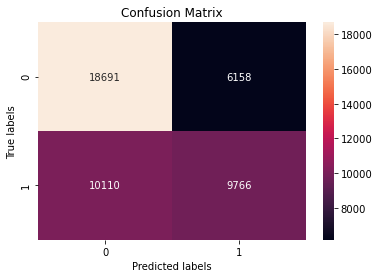

In [9]:
param ={'n_estimators': 77, 'max_depth': 4, 'subsample': 0.8}
clf = CatBoostClassifier(**param)
clf.fit(train_x, train_y)

threshold = 0.5
cat_val_prob = clf.predict_proba(val_x)
cat_val_prob = pd.DataFrame(cat_val_prob)[1]
cat_val_pred = [ 1 if x >= threshold else 0 for x in cat_val_prob]
acc, auc, f1 = evaluate_model_performnce(val_y, cat_val_pred)

#### ② RFE

Learning rate set to 0.5
0:	learn: 0.6734049	total: 33ms	remaining: 2.51s
1:	learn: 0.6640897	total: 60.9ms	remaining: 2.29s
2:	learn: 0.6578750	total: 91.1ms	remaining: 2.25s
3:	learn: 0.6536803	total: 123ms	remaining: 2.24s
4:	learn: 0.6514704	total: 159ms	remaining: 2.29s
5:	learn: 0.6489042	total: 199ms	remaining: 2.35s
6:	learn: 0.6470087	total: 235ms	remaining: 2.35s
7:	learn: 0.6459912	total: 266ms	remaining: 2.29s
8:	learn: 0.6449259	total: 300ms	remaining: 2.27s
9:	learn: 0.6442092	total: 339ms	remaining: 2.27s
10:	learn: 0.6435900	total: 370ms	remaining: 2.22s
11:	learn: 0.6429274	total: 404ms	remaining: 2.19s
12:	learn: 0.6424635	total: 446ms	remaining: 2.2s
13:	learn: 0.6420680	total: 478ms	remaining: 2.15s
14:	learn: 0.6415930	total: 514ms	remaining: 2.13s
15:	learn: 0.6412712	total: 550ms	remaining: 2.1s
16:	learn: 0.6410135	total: 585ms	remaining: 2.06s
17:	learn: 0.6406730	total: 620ms	remaining: 2.03s
18:	learn: 0.6405245	total: 656ms	remaining: 2s
19:	learn: 0.6403996

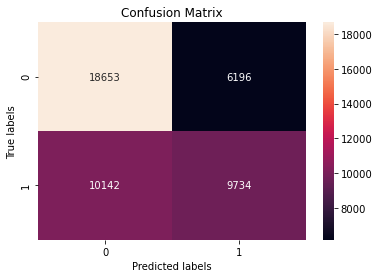

In [56]:
param ={'n_estimators': 77, 'max_depth': 4, 'subsample': 0.8}
clf = CatBoostClassifier(**param)
clf.fit(rfecv_train, train_y)

threshold = 0.5
cat_rfecv_val_prob = clf.predict_proba(rfecv_test )
cat_rfecv_val_prob = pd.DataFrame(cat_rfecv_val_prob)[1]
cat_rfecv_val_pred = [ 1 if x >= threshold else 0 for x in cat_rfecv_val_prob]
cat_rfecv_acc, cat_rfecv_auc, cat_rfecv_f1 = evaluate_model_performnce(val_y, cat_rfecv_val_pred)

#### ③ Lasso

Learning rate set to 0.5
0:	learn: 0.6734049	total: 31.9ms	remaining: 2.42s
1:	learn: 0.6640897	total: 64.3ms	remaining: 2.41s
2:	learn: 0.6578750	total: 102ms	remaining: 2.52s
3:	learn: 0.6544477	total: 133ms	remaining: 2.44s
4:	learn: 0.6511643	total: 170ms	remaining: 2.44s
5:	learn: 0.6490319	total: 211ms	remaining: 2.5s
6:	learn: 0.6475715	total: 243ms	remaining: 2.43s
7:	learn: 0.6461435	total: 277ms	remaining: 2.39s
8:	learn: 0.6455409	total: 309ms	remaining: 2.33s
9:	learn: 0.6447179	total: 343ms	remaining: 2.3s
10:	learn: 0.6440938	total: 381ms	remaining: 2.29s
11:	learn: 0.6434997	total: 417ms	remaining: 2.26s
12:	learn: 0.6430168	total: 455ms	remaining: 2.24s
13:	learn: 0.6424173	total: 493ms	remaining: 2.22s
14:	learn: 0.6419626	total: 524ms	remaining: 2.17s
15:	learn: 0.6414429	total: 563ms	remaining: 2.14s
16:	learn: 0.6411707	total: 604ms	remaining: 2.13s
17:	learn: 0.6408437	total: 645ms	remaining: 2.11s
18:	learn: 0.6406090	total: 682ms	remaining: 2.08s
19:	learn: 0.640

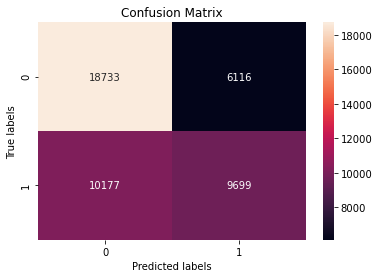

In [57]:
param ={'n_estimators': 77, 'max_depth': 4, 'subsample': 0.8}
clf = CatBoostClassifier(**param)
clf.fit(lasso_train, train_y)

threshold = 0.5
cat_lasso_val_prob = clf.predict_proba(lasso_test )
cat_lasso_val_prob = pd.DataFrame(cat_lasso_val_prob)[1]
cat_lasso_val_pred = [ 1 if x >= threshold else 0 for x in cat_lasso_val_prob]
cat_lasso_acc, cat_lasso_auc, cat_lasso_f1 = evaluate_model_performnce(val_y, cat_lasso_val_pred)

# 5.ニューラルネットワーク

## 5.1 TensorFlow

In [59]:
from tensorflow.compat.v1.keras import Sequential
from tensorflow.compat.v1.keras.layers import Dense, Dropout, Activation
from tensorflow.compat.v1.keras.optimizers import SGD, RMSprop, Adagrad, Adadelta, Adam

model = Sequential()

model.add(Dense(6, activation="relu", input_dim=32)) # 第1層
model.add(Dense(5, activation="tanh", input_dim=6)) # 第2層
model.add(Dense(7, activation="sigmoid", input_dim=6)) # 第3層
model.add(Dense(3, activation="tanh", input_dim=6)) # 第4層
model.add(Dense(7, activation="relu", input_dim=6)) # 第5層
model.add(Dense(7, activation="sigmoid", input_dim=6)) # 第6層
model.add(Dense(3, activation="tanh", input_dim=6)) # 第7層
model.add(Dense(1, activation="sigmoid"))           # 第8層

# 最適化手法
# sgd = SGD(lr=0.01, momentum=0.9, nesterov=False)
# rms = RMSprop(lr=0.01)
# adag = Adagrad(lr=0.01)
# adad = Adadelta(lr=0.01)
adam = Adam(lr=0.01)

model.compile(loss="binary_crossentropy",
             optimizer=adam,
             metrics=["accuracy"])

In [11]:
# 計算の実行
fit = model.fit(train_x, train_y,
    epochs=100,
    batch_size=5000, 
    validation_data=(val_x, val_y))
tensorflow_val_prob = model.predict(val_x)

Epoch 1/100
36/36 [==============================] - 1s 19ms/step - loss: 0.6898 - accuracy: 0.5552 - val_loss: 0.6862 - val_accuracy: 0.5556
Epoch 2/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6785 - accuracy: 0.5690 - val_loss: 0.6582 - val_accuracy: 0.6138
Epoch 3/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6557 - accuracy: 0.6181 - val_loss: 0.6554 - val_accuracy: 0.6132
Epoch 4/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6526 - accuracy: 0.6193 - val_loss: 0.6513 - val_accuracy: 0.6170
Epoch 5/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6499 - accuracy: 0.6196 - val_loss: 0.6502 - val_accuracy: 0.6180
Epoch 6/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6477 - accuracy: 0.6241 - val_loss: 0.6470 - val_accuracy: 0.6239
Epoch 7/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6454 - accuracy: 0.6249 - val_loss: 0.6447 - val_accuracy: 0.6264
Epoch 8/100


Epoch 59/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6406 - accuracy: 0.6310 - val_loss: 0.6405 - val_accuracy: 0.6307
Epoch 60/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6398 - accuracy: 0.6320 - val_loss: 0.6406 - val_accuracy: 0.6316
Epoch 61/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6405 - accuracy: 0.6321 - val_loss: 0.6408 - val_accuracy: 0.6316
Epoch 62/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6402 - accuracy: 0.6314 - val_loss: 0.6401 - val_accuracy: 0.6297
Epoch 63/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6400 - accuracy: 0.6329 - val_loss: 0.6402 - val_accuracy: 0.6320
Epoch 64/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6395 - accuracy: 0.6323 - val_loss: 0.6405 - val_accuracy: 0.6315
Epoch 65/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6396 - accuracy: 0.6332 - val_loss: 0.6414 - val_accuracy: 0.6307
Epoch 

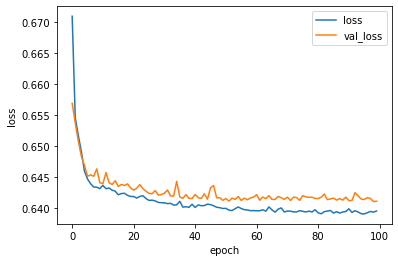

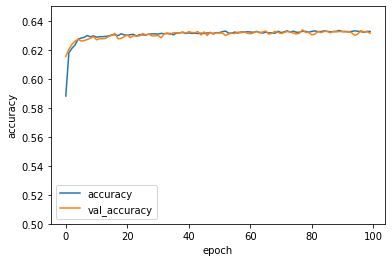

In [40]:
# 各epochにおける損失と精度をdf化
nn_df = pd.DataFrame(fit.history)

# グラフ化
nn_df[["loss", "val_loss"]].plot()
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

nn_df[["accuracy", "val_accuracy"]].plot()
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.ylim([0.5, 0.65])
plt.show()

## ベイズ最適化

In [ ]:
import optuna
import sklearn

# モデルの作成
def create_model(num_layer, activation):
   model = Sequential()
   model.add(Dense(256, activation=activation, input_shape=(32,))) # 入力層
   for i in range(num_layer):
       model.add(Dense(128, activation=activation)) # 隠れ層
       model.add(Dropout(rate=0.5)) # ドロップアウト
   model.add(Dense(1, activation='sigmoid')) # 出力層
   return model

def objective(trial):

   # パラメータ種類 & 探索範囲
   # 最適化パラメータ「層の数」
   num_layer = trial.suggest_int("num_layer", 2, 100)

   # 最適化パラメータ「活性化関数」
   activation = trial.suggest_categorical("activation", ["relu", "sigmoid", "tanh"])

   # 最適化パラメータ「オプティマイザ」
   optimizer = trial.suggest_categorical("optimizer", ["adam"])
    
   # モデルの生成
   model = create_model(num_layer, activation)

   # コンパイル
   model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

   # 学習
   history = model.fit(train_x, train_y, batch_size=1000,
       epochs=100, validation_split=0.2)

   # この戻り値が最小になるパラメータの組み合わせを探索
   return 1 - history.history["val_accuracy"][-1]

study = optuna.create_study()
study.optimize(objective, n_trials=100)

trial = study.best_trial

print('Accuracy: {}'.format(trial.value))
print("Best hyperparameters: {}".format(trial.params))

### 特微量選択

#### ② RFE

In [61]:
from tensorflow.compat.v1.keras import Sequential
from tensorflow.compat.v1.keras.layers import Dense, Dropout, Activation
from tensorflow.compat.v1.keras.optimizers import SGD, RMSprop, Adagrad, Adadelta, Adam

model = Sequential()

model.add(Dense(6, activation="relu", input_dim=29)) # 第1層
model.add(Dense(5, activation="tanh", input_dim=6)) # 第2層
model.add(Dense(7, activation="sigmoid", input_dim=6)) # 第3層
model.add(Dense(3, activation="tanh", input_dim=6)) # 第4層
model.add(Dense(7, activation="relu", input_dim=6)) # 第5層
model.add(Dense(7, activation="sigmoid", input_dim=6)) # 第6層
model.add(Dense(3, activation="tanh", input_dim=6)) # 第7層
model.add(Dense(1, activation="sigmoid"))           # 第8層

# 最適化手法
# sgd = SGD(lr=0.01, momentum=0.9, nesterov=False)
# rms = RMSprop(lr=0.01)
# adag = Adagrad(lr=0.01)
# adad = Adadelta(lr=0.01)
adam = Adam(lr=0.01)

model.compile(loss="binary_crossentropy",
             optimizer=adam,
             metrics=["accuracy"])

Epoch 1/100
36/36 [==============================] - 1s 15ms/step - loss: 0.7671 - accuracy: 0.4757 - val_loss: 0.6875 - val_accuracy: 0.5556
Epoch 2/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.5601 - val_loss: 0.6856 - val_accuracy: 0.5556
Epoch 3/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6812 - accuracy: 0.5584 - val_loss: 0.6634 - val_accuracy: 0.6140
Epoch 4/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6605 - accuracy: 0.6158 - val_loss: 0.6579 - val_accuracy: 0.6147
Epoch 5/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6565 - accuracy: 0.6164 - val_loss: 0.6552 - val_accuracy: 0.6156
Epoch 6/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6543 - accuracy: 0.6181 - val_loss: 0.6555 - val_accuracy: 0.6146
Epoch 7/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6556 - accuracy: 0.6159 - val_loss: 0.6544 - val_accuracy: 0.6159
Epoch 8/100


Epoch 59/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6418 - accuracy: 0.6307 - val_loss: 0.6419 - val_accuracy: 0.6298
Epoch 60/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6422 - accuracy: 0.6307 - val_loss: 0.6425 - val_accuracy: 0.6281
Epoch 61/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6420 - accuracy: 0.6296 - val_loss: 0.6419 - val_accuracy: 0.6301
Epoch 62/100
36/36 [==============================] - 0s 10ms/step - loss: 0.6403 - accuracy: 0.6323 - val_loss: 0.6419 - val_accuracy: 0.6293
Epoch 63/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6415 - accuracy: 0.6306 - val_loss: 0.6419 - val_accuracy: 0.6293
Epoch 64/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6417 - accuracy: 0.6310 - val_loss: 0.6416 - val_accuracy: 0.6297
Epoch 65/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6411 - accuracy: 0.6314 - val_loss: 0.6417 - val_accuracy: 0.6302
Epoch

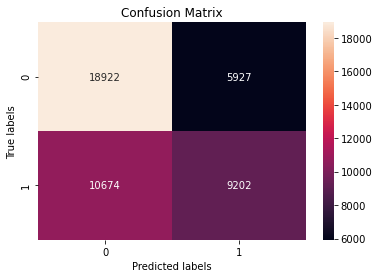

In [62]:
# 計算の実行
fit = model.fit(rfecv_train, train_y,
    epochs=100,
    batch_size=5000, 
    validation_data=(rfecv_test , val_y))
tensorflow_rfecv_val_prob = model.predict(rfecv_test )

tensorflow_rfecv_val_pred = [ 1 if x >= threshold else 0 for x in tensorflow_rfecv_val_prob]
tensorflow_rfecv__acc,tensorflow_rfecv_auc, tensorflow_rfecv_f1 = evaluate_model_performnce(val_y, tensorflow_rfecv_val_pred)

#### ③ Lasso

Epoch 1/100
36/36 [==============================] - 0s 11ms/step - loss: 0.6440 - accuracy: 0.6267 - val_loss: 0.6439 - val_accuracy: 0.6265
Epoch 2/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6428 - accuracy: 0.6284 - val_loss: 0.6436 - val_accuracy: 0.6277
Epoch 3/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6426 - accuracy: 0.6282 - val_loss: 0.6428 - val_accuracy: 0.6270
Epoch 4/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6422 - accuracy: 0.6295 - val_loss: 0.6429 - val_accuracy: 0.6264
Epoch 5/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6432 - accuracy: 0.6285 - val_loss: 0.6430 - val_accuracy: 0.6271
Epoch 6/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6424 - accuracy: 0.6291 - val_loss: 0.6434 - val_accuracy: 0.6278
Epoch 7/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6425 - accuracy: 0.6284 - val_loss: 0.6427 - val_accuracy: 0.6269
Epoch 8/100


Epoch 59/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6414 - accuracy: 0.6309 - val_loss: 0.6414 - val_accuracy: 0.6303
Epoch 60/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6411 - accuracy: 0.6308 - val_loss: 0.6414 - val_accuracy: 0.6295
Epoch 61/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6411 - accuracy: 0.6317 - val_loss: 0.6414 - val_accuracy: 0.6291
Epoch 62/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6408 - accuracy: 0.6319 - val_loss: 0.6422 - val_accuracy: 0.6297
Epoch 63/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6411 - accuracy: 0.6312 - val_loss: 0.6416 - val_accuracy: 0.6290
Epoch 64/100
36/36 [==============================] - 0s 9ms/step - loss: 0.6410 - accuracy: 0.6314 - val_loss: 0.6411 - val_accuracy: 0.6304
Epoch 65/100
36/36 [==============================] - 0s 8ms/step - loss: 0.6410 - accuracy: 0.6320 - val_loss: 0.6414 - val_accuracy: 0.6296
Epoch 

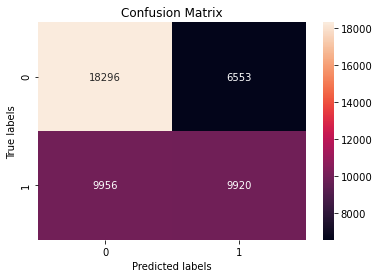

In [63]:
# 計算の実行
fit = model.fit(lasso_train, train_y,
    epochs=100,
    batch_size=5000, 
    validation_data=(lasso_test , val_y))
tensorflow_lasso_val_prob = model.predict(lasso_test )

tensorflow_lasso_val_pred = [ 1 if x >= threshold else 0 for x in tensorflow_lasso_val_prob]
tensorflow_lasso__acc,tensorflow_lasso_auc, tensorflow_lasso_f1 = evaluate_model_performnce(val_y, tensorflow_lasso_val_pred)

## 6. アンサンブル

## 6.1 加重アンサンブル

### 6.1.1 特微量選択

#### ① デフォルトデータ

In [28]:
# CatBoostClassifier, LGBMClassifier, XGBClassifier, TensorFlow
ens_val_prob = 0.3 * cat_val_prob[:100000,0] + \
               0.2 * lgb_val_prob[:100000,0] + \
               0.2 *  xgb_val_prob[:100000]  + \
               0.3 * tensorflow_val_prob[:100000].reshape(-1)

Precision :  0.4476404767696424
Recall :  0.3703461461058563
F1 Score :  0.40534140969162996
Validation Accuracy :  0.5170933482392398
Accuracy Score :  0.5170933482392398
AUC Value :  0.5024091791336558


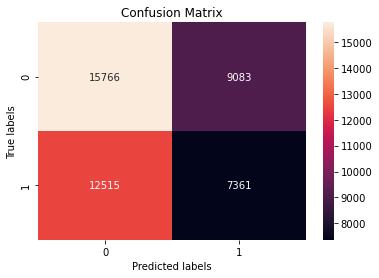

In [25]:
threshold = 0.5
ens_val_pred = [1 if x >= threshold else 0 for x in ens_val_prob]
ens_acc, ens_auc, ens_f1 = evaluate_model_performnce(val_y[:100000], ens_val_pred)

#### ② RFE

In [72]:
# CatBoostClassifier, LGBMClassifier, XGBClassifier, TensorFlow
ens_val_prob = 0.3 * cat_rfecv_val_prob[:100000] + \
               0.2 * lgb_rfecv_val_prob[:100000] + \
               0.2 *  xgb_rfecv_val_prob[:100000]  + \
               0.3 * tensorflow_rfecv_val_prob[:100000].reshape(-1)

Precision :  0.6135346040680568
Recall :  0.4825920708392031
F1 Score :  0.5402421852999156
Validation Accuracy :  0.634969256567915
Accuracy Score :  0.634969256567915
AUC Value :  0.6197217265942967


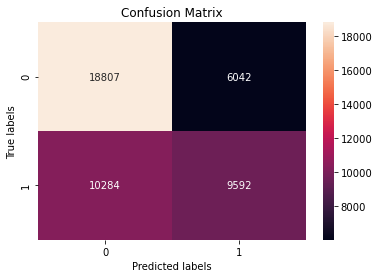

In [74]:
threshold = 0.5
ens_val_pred = [1 if x >= threshold else 0 for x in ens_val_prob]
ens_acc, ens_auc, ens_f1 = evaluate_model_performnce(val_y[:100000], ens_val_pred)

#### ③ Lasso

Precision :  0.6087808462433408
Recall :  0.500201247735963
F1 Score :  0.5491755737840749
Validation Accuracy :  0.6350363331470095
Accuracy Score :  0.6350363331470095
AUC Value :  0.6215441427218589


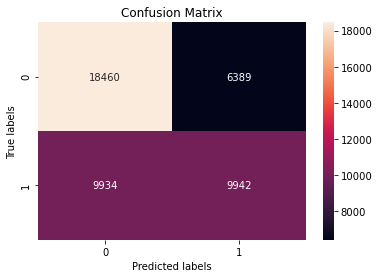

In [75]:
# CatBoostClassifier, LGBMClassifier, XGBClassifier, TensorFlow
ens_val_prob = 0.3 * cat_lasso_val_prob[:100000] + \
               0.2 * lgb_lasso_val_prob[:100000] + \
               0.2 *  xgb_lasso_val_prob[:100000]  + \
               0.3 * tensorflow_lasso_val_prob[:100000].reshape(-1)

threshold = 0.5
ens_val_pred = [1 if x >= threshold else 0 for x in ens_val_prob]
ens_acc, ens_auc, ens_f1 = evaluate_model_performnce(val_y[:100000], ens_val_pred)

## 6.2 多数決アンサンブル

### 多数決アンサンブル分類器クラス

In [78]:
from sklearn.base import BaseEstimator
from sklearn.base import ClassifierMixin
from sklearn.preprocessing import LabelEncoder
from sklearn.base import clone
from sklearn.pipeline import _name_estimators
import numpy as np
import operator

class MajorityVoteClassifier(BaseEstimator, ClassifierMixin):
  """
  多数決アンサンブル分類器
  パラメータ------------------
  classfiers : array-like アンサンブルの様々な学習器
  vote : str, {"classlabel, "probability} (defualt : "classlabel")
    "classlabel"の場合、クラスラベルの予測はクラスラベルのargmaxに基づく
    "probability"の場合、クラスラベルの予測はクラスの所属確率のargmaxに基づく（分類器が調整済みであることが推奨）
  weights : array-like (optional, defualt=None)
    int または float 型の値のリストが提供された場合、分類器は重要度で重み付けされる.
    weights-None の場合、均一の重みを使用.

  BaseEstimator------------------
    set_params : 分類器のパラメータを設定
    get_params : パラメータを取得
  ClassifierMixin------------------

  """
  def __init__(self, classifiers, vote="classlabel", weights=None):

    self.classifiers = classifiers
    self.named_classifiers = {key: value for key, value in _name_estimators(classifiers)}
    self.vote = vote
    self.weights = weights

  def fit(self, X, y):
    """
    分類器学習.

    パラメータ------------------
    X : 訓練データからなる行列
    y : クラスラベルのベクトル
    """
    if self.vote not in ('probability', 'classlabel'):
        raise ValueError("vote must be 'probability' or 'classlabel'"
                         "; got (vote=%r)"
                         % self.vote)

    if self.weights and len(self.weights) != len(self.classifiers):
        raise ValueError('Number of classifiers and weights must be equal'
                         '; got %d weights, %d classifiers'
                         % (len(self.weights), len(self.classifiers)))
    # Labelエンコーディング
    self.lablenc_ = LabelEncoder()
    self.lablenc_.fit(y)
    self.classes_ = self.lablenc_.classes_
    self.classifiers_ = []
    # 各分類器で学習
    for clf in self.classifiers:
        fitted_clf = clone(clf).fit(X, self.lablenc_.transform(y))
        self.classifiers_.append(fitted_clf)
    return self

  def predict(self, X):
    """ X のクラスラベルを予測.
    X : 訓練データからなる行列
    戻り値 : 予測されたクラスラベル
    """

    if self.vote == "probability":
      maj_vote = np.argmax(self.predict_proba(X), axis=1)
    else : 
      # classラベルでの多数決

      # clf.predictで各分類器の予測結果を収集
      predictions = np.asarray([clf.predict(X) for clf in self.classifiers_]).T

      # 各データ点のクラス確率に重みをかけて足し合わせた値が最大となる
      # 列番号を配列として返す (行単位で関数を適用)
      maj_vote = np.apply_along_axis(
          lambda x: np.argmax(np.bincount(x, weights=self.weights)), # np.bincount : 最頻値
          axis=1,
          arr = predictions
      )
    # 各データ点に確率の最大値を与えるクラスラベルを抽出
    maj_vote = self.lablenc_.inverse_transform(maj_vote)
    return maj_vote
  
  def predict_proba(self, X):
    """
    X のクラス確率を予測

    X : 訓練ベクトル（n_examplesはデータ点の個数, n_featuresは特微量の個数)
    avg_proba : 各データ点に対する各クラスで重み付けた平均確率

    """
    probas = np.asarray([clf.predict_proba(X) for clf in self.classifiers_])
    avg_proba = np.average(probas, axis=0, weights=self.weights)
    return avg_proba

  def get_params(self, deep=True):
    """
    GridSeachの実行時に分類器のパラメータ名を取得
    """
    if not deep:
        return super(MajorityVoteClassifier, self).get_params(deep=False)
    else:
        # キーを分類器の名前_パラメータ名
        # 値をパラメータの値とするディクショナリを生成
        out = self.named_classifiers.copy()
        for name, step in self.named_classifiers.items():
            for key, value in step.get_params(deep=True).items():
                out['%s__%s' % (name, key)] = value
        return out


### 学習・正解率確認

In [128]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

# アンサンブル学習に使うベース分類器
clf1 = make_pipeline(PolynomialFeatures(3),LogisticRegression(C=1, random_state=0, solver='saga'))
clf2 = DecisionTreeClassifier(**{'max_depth': 8, 'min_samples_split': 11, 'max_leaf_nodes': 11})
clf3 = RandomForestClassifier(**best_param)
clf4 = xgb_clf = XGBClassifier(**{'n_estimators': 91, 'max_depth': 4, 'subsample': 0.9, 'min_child_weight': 6, 'colsample_bytree': 0.7})
clf5 = LGBMClassifier(**param)
clf6 = CatBoostClassifier(**{'n_estimators': 77, 'max_depth': 4, 'subsample': 0.8})

# 分類器ラベル
clf_labels = []
clf_labels = ['Logistic regression', 'Decision tree','RandomForest', 'XGBClassifier', 'LGBMClassifier', 'CatBoostClassifier']

print('10-fold cross validation:\n')

list_df = pd.DataFrame()
mv_clf = MajorityVoteClassifier(classifiers=[clf1, clf2, clf3, clf4, clf5, clf6], weights=[0.025, 0.075, 0.25,0.15,0.25,0.25])

clf_labels += ['Majority voting']
all_clf = [clf1, clf2, clf3, clf4, clf5, clf6, mv_clf]

for clf, label in zip(all_clf, clf_labels):
    scores = cross_val_score(estimator=clf,
                             X=train_x.iloc[0:5000,:], 
                             y=train_y.iloc[0:5000],
                             cv=10,
                             scoring='accuracy')
    print("accuracy: %0.2f (+/- %0.2f) [%s]"
          % (scores.mean(), scores.std(), label))
    list_df = list_df.append(pd.Series( [scores.mean(), scores.std(),label] ), ignore_index=True)
list_df.columns = ['スコア(平均)', "標準偏差", "識別子"]

10-fold cross validation:

accuracy: 0.59 (+/- 0.02) [Logistic regression]
accuracy: 0.59 (+/- 0.01) [Decision tree]
accuracy: 0.61 (+/- 0.01) [RandomForest]
[04:36:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:36:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:36:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:36:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

75:	learn: 0.6038267	total: 238ms	remaining: 3.14ms
76:	learn: 0.6031593	total: 242ms	remaining: 0us
Learning rate set to 0.205562
0:	learn: 0.6845268	total: 3.52ms	remaining: 268ms
1:	learn: 0.6786918	total: 6.14ms	remaining: 230ms
2:	learn: 0.6738851	total: 9.97ms	remaining: 246ms
3:	learn: 0.6699673	total: 12.7ms	remaining: 232ms
4:	learn: 0.6656040	total: 16.2ms	remaining: 233ms
5:	learn: 0.6625593	total: 19.3ms	remaining: 229ms
6:	learn: 0.6606877	total: 22.3ms	remaining: 223ms
7:	learn: 0.6582689	total: 25.4ms	remaining: 219ms
8:	learn: 0.6560289	total: 28.3ms	remaining: 214ms
9:	learn: 0.6542077	total: 30.7ms	remaining: 206ms
10:	learn: 0.6527663	total: 33.6ms	remaining: 202ms
11:	learn: 0.6510895	total: 37ms	remaining: 200ms
12:	learn: 0.6498120	total: 40.3ms	remaining: 199ms
13:	learn: 0.6486498	total: 43.7ms	remaining: 197ms
14:	learn: 0.6470990	total: 46.7ms	remaining: 193ms
15:	learn: 0.6465348	total: 50.3ms	remaining: 192ms
16:	learn: 0.6451946	total: 53.8ms	remaining: 190

23:	learn: 0.6381556	total: 99.4ms	remaining: 220ms
24:	learn: 0.6374668	total: 103ms	remaining: 215ms
25:	learn: 0.6369421	total: 106ms	remaining: 209ms
26:	learn: 0.6362705	total: 110ms	remaining: 203ms
27:	learn: 0.6356170	total: 113ms	remaining: 198ms
28:	learn: 0.6352664	total: 126ms	remaining: 208ms
29:	learn: 0.6342029	total: 132ms	remaining: 207ms
30:	learn: 0.6334165	total: 135ms	remaining: 200ms
31:	learn: 0.6331385	total: 138ms	remaining: 195ms
32:	learn: 0.6326822	total: 143ms	remaining: 190ms
33:	learn: 0.6322216	total: 146ms	remaining: 185ms
34:	learn: 0.6314456	total: 150ms	remaining: 180ms
35:	learn: 0.6310127	total: 153ms	remaining: 174ms
36:	learn: 0.6304559	total: 156ms	remaining: 169ms
37:	learn: 0.6298362	total: 160ms	remaining: 164ms
38:	learn: 0.6291857	total: 163ms	remaining: 159ms
39:	learn: 0.6288715	total: 166ms	remaining: 153ms
40:	learn: 0.6284641	total: 169ms	remaining: 148ms
41:	learn: 0.6279870	total: 171ms	remaining: 143ms
42:	learn: 0.6273620	total: 17

51:	learn: 0.6216407	total: 190ms	remaining: 91.6ms
52:	learn: 0.6208731	total: 194ms	remaining: 87.6ms
53:	learn: 0.6201498	total: 197ms	remaining: 83.7ms
54:	learn: 0.6194948	total: 200ms	remaining: 80.2ms
55:	learn: 0.6189705	total: 203ms	remaining: 76.2ms
56:	learn: 0.6184535	total: 206ms	remaining: 72.2ms
57:	learn: 0.6178984	total: 209ms	remaining: 68.3ms
58:	learn: 0.6174455	total: 212ms	remaining: 64.6ms
59:	learn: 0.6167629	total: 215ms	remaining: 61ms
60:	learn: 0.6160155	total: 219ms	remaining: 57.4ms
61:	learn: 0.6152945	total: 222ms	remaining: 53.7ms
62:	learn: 0.6147645	total: 225ms	remaining: 50.1ms
63:	learn: 0.6142179	total: 229ms	remaining: 46.5ms
64:	learn: 0.6136431	total: 233ms	remaining: 43ms
65:	learn: 0.6130159	total: 237ms	remaining: 39.5ms
66:	learn: 0.6122883	total: 241ms	remaining: 36ms
67:	learn: 0.6116471	total: 244ms	remaining: 32.3ms
68:	learn: 0.6114917	total: 247ms	remaining: 28.6ms
69:	learn: 0.6111363	total: 250ms	remaining: 25ms
70:	learn: 0.6105670

Learning rate set to 0.205562
0:	learn: 0.6837557	total: 2.7ms	remaining: 205ms
1:	learn: 0.6775835	total: 5.73ms	remaining: 215ms
2:	learn: 0.6720095	total: 8.78ms	remaining: 217ms
3:	learn: 0.6689558	total: 11.2ms	remaining: 205ms
4:	learn: 0.6644811	total: 15.1ms	remaining: 218ms
5:	learn: 0.6609806	total: 17.6ms	remaining: 208ms
6:	learn: 0.6583839	total: 20ms	remaining: 200ms
7:	learn: 0.6560344	total: 23.8ms	remaining: 205ms
8:	learn: 0.6545147	total: 27.7ms	remaining: 210ms
9:	learn: 0.6520655	total: 30.5ms	remaining: 204ms
10:	learn: 0.6506333	total: 33ms	remaining: 198ms
11:	learn: 0.6482723	total: 35.4ms	remaining: 192ms
12:	learn: 0.6472521	total: 38ms	remaining: 187ms
13:	learn: 0.6457881	total: 40.6ms	remaining: 183ms
14:	learn: 0.6449524	total: 44.1ms	remaining: 182ms
15:	learn: 0.6440334	total: 47.6ms	remaining: 181ms
16:	learn: 0.6432517	total: 50.8ms	remaining: 179ms
17:	learn: 0.6418746	total: 54ms	remaining: 177ms
18:	learn: 0.6408545	total: 57.2ms	remaining: 175ms
1

[04:37:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.205562
0:	learn: 0.6859021	total: 2.61ms	remaining: 199ms
1:	learn: 0.6791474	total: 6.28ms	remaining: 236ms
2:	learn: 0.6747180	total: 8.82ms	remaining: 218ms
3:	learn: 0.6710508	total: 11.7ms	remaining: 214ms
4:	learn: 0.6662448	total: 14.1ms	remaining: 203ms
5:	learn: 0.6630056	total: 16.5ms	remaining: 195ms
6:	learn: 0.6606166	total: 18.8ms	remaining: 188ms
7:	learn: 0.6578833	total: 21.2ms	remaining: 183ms
8:	learn: 0.6561087	total: 23.4ms	remaining: 177ms
9:	learn: 0.6525355	total: 25.9ms	remaining: 173ms
10:	learn: 0.6503310	total: 29.3ms	remaining: 176ms
11:	learn: 0.6490171	total: 33ms	remaining: 179ms
12:	learn: 0.6480315	total: 36.8ms	remaining: 181ms
13:	learn: 0.6466282	total: 40.3ms	remaining: 181ms
14

[04:38:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.205562
0:	learn: 0.6828354	total: 3.02ms	remaining: 229ms
1:	learn: 0.6772945	total: 6.29ms	remaining: 236ms
2:	learn: 0.6729335	total: 9.98ms	remaining: 246ms
3:	learn: 0.6690360	total: 13ms	remaining: 238ms
4:	learn: 0.6637009	total: 17.2ms	remaining: 248ms
5:	learn: 0.6608606	total: 20.3ms	remaining: 240ms
6:	learn: 0.6577655	total: 23.5ms	remaining: 235ms
7:	learn: 0.6551608	total: 26.6ms	remaining: 230ms
8:	learn: 0.6533577	total: 29.4ms	remaining: 222ms
9:	learn: 0.6515063	total: 32.3ms	remaining: 217ms
10:	learn: 0.6492337	total: 34.7ms	remaining: 208ms
11:	learn: 0.6474917	total: 37.2ms	remaining: 201ms
12:	learn: 0.6464011	total: 39.7ms	remaining: 196ms
13:	learn: 0.6450257	total: 42.4ms	remaining: 191ms
14

[04:39:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.205562
0:	learn: 0.6834955	total: 2.45ms	remaining: 186ms
1:	learn: 0.6763662	total: 6.5ms	remaining: 244ms
2:	learn: 0.6716545	total: 9.38ms	remaining: 231ms
3:	learn: 0.6677660	total: 11.9ms	remaining: 217ms
4:	learn: 0.6639381	total: 14.7ms	remaining: 212ms
5:	learn: 0.6607037	total: 17.3ms	remaining: 205ms
6:	learn: 0.6582218	total: 20.1ms	remaining: 202ms
7:	learn: 0.6564659	total: 22.8ms	remaining: 197ms
8:	learn: 0.6539346	total: 25.5ms	remaining: 193ms
9:	learn: 0.6513254	total: 28.2ms	remaining: 189ms
10:	learn: 0.6500488	total: 30.8ms	remaining: 185ms
11:	learn: 0.6480636	total: 33.2ms	remaining: 180ms
12:	learn: 0.6460357	total: 35.9ms	remaining: 177ms
13:	learn: 0.6449868	total: 38.5ms	remaining: 173ms
1

[04:40:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.205562
0:	learn: 0.6828241	total: 2.64ms	remaining: 201ms
1:	learn: 0.6764111	total: 6.36ms	remaining: 238ms
2:	learn: 0.6727216	total: 9.72ms	remaining: 240ms
3:	learn: 0.6662836	total: 12.9ms	remaining: 235ms
4:	learn: 0.6617967	total: 15.9ms	remaining: 228ms
5:	learn: 0.6579915	total: 19.3ms	remaining: 229ms
6:	learn: 0.6562014	total: 23.1ms	remaining: 231ms
7:	learn: 0.6541001	total: 26.6ms	remaining: 230ms
8:	learn: 0.6527028	total: 30.1ms	remaining: 227ms
9:	learn: 0.6506768	total: 33.4ms	remaining: 224ms
10:	learn: 0.6494244	total: 37.7ms	remaining: 226ms
11:	learn: 0.6474358	total: 41.3ms	remaining: 224ms
12:	learn: 0.6461211	total: 45.1ms	remaining: 222ms
13:	learn: 0.6447183	total: 49.1ms	remaining: 221ms


[04:41:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.205562
0:	learn: 0.6837557	total: 3.32ms	remaining: 252ms
1:	learn: 0.6775835	total: 5.53ms	remaining: 207ms
2:	learn: 0.6720095	total: 7.72ms	remaining: 190ms
3:	learn: 0.6689558	total: 10.4ms	remaining: 190ms
4:	learn: 0.6644811	total: 12.9ms	remaining: 186ms
5:	learn: 0.6609806	total: 16.2ms	remaining: 191ms
6:	learn: 0.6583839	total: 19.3ms	remaining: 193ms
7:	learn: 0.6560344	total: 21.4ms	remaining: 185ms
8:	learn: 0.6545147	total: 23.7ms	remaining: 179ms
9:	learn: 0.6520655	total: 26ms	remaining: 174ms
10:	learn: 0.6506333	total: 28.6ms	remaining: 171ms
11:	learn: 0.6482723	total: 31ms	remaining: 168ms
12:	learn: 0.6472521	total: 34.6ms	remaining: 170ms
13:	learn: 0.6457881	total: 37.9ms	remaining: 171ms
14:	

In [129]:
list_df

,スコア(平均),標準偏差,識別子
0,0.5876,0.023183,Logistic regression
1,0.5924,0.014988,Decision tree
2,0.6092,0.011179,RandomForest
3,0.6044,0.021630,XGBClassifier
4,0.6134,0.017687,LGBMClassifier
5,0.6148,0.017302,CatBoostClassifier
6,0.6174,0.016518,Majority voting


### AUC

[03:16:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.215022
0:	learn: 0.6826604	total: 3.14ms	remaining: 239ms
1:	learn: 0.6764926	total: 5.97ms	remaining: 224ms
2:	learn: 0.6721029	total: 8.88ms	remaining: 219ms
3:	learn: 0.6667303	total: 13.1ms	remaining: 238ms
4:	learn: 0.6649738	total: 16.7ms	remaining: 241ms
5:	learn: 0.6610811	total: 21.4ms	remaining: 253ms
6:	learn: 0.6582474	total: 24.6ms	remaining: 246ms
7:	learn: 0.6555319	total: 27.6ms	remaining: 238ms
8:	learn: 0.6534256	total: 30.4ms	remaining: 230ms
9:	learn: 0.6516634	total: 33.7ms	remaining: 226ms
10:	learn: 0.6492764	total: 36.7ms	remaining: 220ms
11:	learn: 0.6478040	total: 39.6ms	remaining: 214ms
12:	learn: 0.6461093	total: 42.1ms	remaining: 207ms
13:	learn: 0.6450763	total: 45.3ms	remaining: 204ms


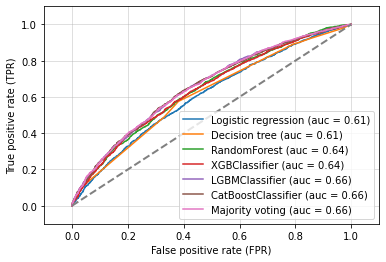

In [94]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

for clf, label in zip(all_clf,clf_labels):

    # assuming the label of the positive class is 1
    y_pred = clf.fit(train_x.iloc[0:5000,:],train_y.iloc[0:5000]).predict_proba(val_x.iloc[0:5000,:])[:, 1]
    fpr, tpr, thresholds = roc_curve(y_true=val_y.iloc[0:5000],
                                     y_score=y_pred)
    roc_auc = auc(x=fpr, y=tpr)
    plt.plot(fpr, tpr,
             label='%s (auc = %0.2f)' % (label, roc_auc))

plt.legend(loc='lower right')
plt.plot([0, 1], [0, 1],
         linestyle='--',
         color='gray',
         linewidth=2)

plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.grid(alpha=0.5)
plt.xlabel('False positive rate (FPR)')
plt.ylabel('True positive rate (TPR)')


#plt.savefig('images/07_04', dpi=300)
plt.show()

### 特微量選択

#### ② RFE

In [79]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

# アンサンブル学習に使うベース分類器
clf1 = make_pipeline(PolynomialFeatures(3),LogisticRegression(C=1, random_state=0, solver='saga'))
clf2 = DecisionTreeClassifier(**{'max_depth': 8, 'min_samples_split': 11, 'max_leaf_nodes': 11})
clf3 = RandomForestClassifier(**{'n_estimators': 61, 'max_depth': 15, 'min_samples_split': 5, 'max_leaf_nodes': 10})
clf4 = xgb_clf = XGBClassifier(**{'n_estimators': 91, 'max_depth': 4, 'subsample': 0.9, 'min_child_weight': 6, 'colsample_bytree': 0.7})
clf5 = LGBMClassifier(**param)
clf6 = CatBoostClassifier(**{'n_estimators': 77, 'max_depth': 4, 'subsample': 0.8})

# 分類器ラベル
clf_labels = []
clf_labels = ['Logistic regression', 'Decision tree','RandomForest', 'XGBClassifier', 'LGBMClassifier', 'CatBoostClassifier']

print('10-fold cross validation:\n')

list_df = pd.DataFrame()
mv_clf = MajorityVoteClassifier(classifiers=[clf1, clf2, clf3, clf4, clf5, clf6], weights=[0.025, 0.075, 0.25,0.15,0.25,0.25])

clf_labels += ['Majority voting']
all_clf = [clf1, clf2, clf3, clf4, clf5, clf6, mv_clf]

for clf, label in zip(all_clf, clf_labels):
    scores = cross_val_score(estimator=clf,
                             X=rfecv_train.iloc[0:5000,:], 
                             y=train_y.iloc[0:5000],
                             cv=10,
                             scoring='accuracy')
    print("accuracy: %0.2f (+/- %0.2f) [%s]"
          % (scores.mean(), scores.std(), label))
    list_df = list_df.append(pd.Series( [scores.mean(), scores.std(),label] ), ignore_index=True)
list_df.columns = ['スコア(平均)', "標準偏差", "識別子"]

10-fold cross validation:

accuracy: 0.59 (+/- 0.01) [Logistic regression]
accuracy: 0.62 (+/- 0.02) [Decision tree]
accuracy: 0.63 (+/- 0.02) [RandomForest]
[07:00:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[07:00:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[07:00:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[07:00:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

Learning rate set to 0.205562
0:	learn: 0.6813023	total: 3.66ms	remaining: 278ms
1:	learn: 0.6728384	total: 7.01ms	remaining: 263ms
2:	learn: 0.6676600	total: 9.65ms	remaining: 238ms
3:	learn: 0.6621959	total: 12.7ms	remaining: 231ms
4:	learn: 0.6588621	total: 15.2ms	remaining: 219ms
5:	learn: 0.6556989	total: 18ms	remaining: 213ms
6:	learn: 0.6534842	total: 21.3ms	remaining: 213ms
7:	learn: 0.6507200	total: 24.2ms	remaining: 208ms
8:	learn: 0.6482838	total: 26.8ms	remaining: 203ms
9:	learn: 0.6461329	total: 29.6ms	remaining: 198ms
10:	learn: 0.6440883	total: 33.1ms	remaining: 198ms
11:	learn: 0.6430773	total: 36.9ms	remaining: 200ms
12:	learn: 0.6416261	total: 40.1ms	remaining: 197ms
13:	learn: 0.6398044	total: 43.4ms	remaining: 195ms
14:	learn: 0.6389321	total: 46.6ms	remaining: 193ms
15:	learn: 0.6376848	total: 49.6ms	remaining: 189ms
16:	learn: 0.6368532	total: 52.4ms	remaining: 185ms
17:	learn: 0.6357557	total: 55.9ms	remaining: 183ms
18:	learn: 0.6348138	total: 58.4ms	remaining: 

28:	learn: 0.6289871	total: 106ms	remaining: 175ms
29:	learn: 0.6282509	total: 109ms	remaining: 171ms
30:	learn: 0.6276947	total: 113ms	remaining: 168ms
31:	learn: 0.6270314	total: 117ms	remaining: 165ms
32:	learn: 0.6263952	total: 121ms	remaining: 162ms
33:	learn: 0.6254914	total: 125ms	remaining: 158ms
34:	learn: 0.6247613	total: 129ms	remaining: 155ms
35:	learn: 0.6240857	total: 132ms	remaining: 150ms
36:	learn: 0.6235059	total: 135ms	remaining: 146ms
37:	learn: 0.6225508	total: 138ms	remaining: 142ms
38:	learn: 0.6218060	total: 142ms	remaining: 139ms
39:	learn: 0.6207033	total: 146ms	remaining: 135ms
40:	learn: 0.6201393	total: 150ms	remaining: 132ms
41:	learn: 0.6197895	total: 153ms	remaining: 128ms
42:	learn: 0.6197096	total: 157ms	remaining: 124ms
43:	learn: 0.6194660	total: 161ms	remaining: 120ms
44:	learn: 0.6184626	total: 163ms	remaining: 116ms
45:	learn: 0.6175838	total: 166ms	remaining: 112ms
46:	learn: 0.6170709	total: 169ms	remaining: 108ms
47:	learn: 0.6161339	total: 172

Learning rate set to 0.205562
0:	learn: 0.6804501	total: 3.15ms	remaining: 239ms
1:	learn: 0.6714663	total: 5.67ms	remaining: 213ms
2:	learn: 0.6685004	total: 8.74ms	remaining: 216ms
3:	learn: 0.6637366	total: 11.3ms	remaining: 206ms
4:	learn: 0.6606846	total: 13.8ms	remaining: 198ms
5:	learn: 0.6568842	total: 16.3ms	remaining: 193ms
6:	learn: 0.6540511	total: 18.6ms	remaining: 186ms
7:	learn: 0.6518034	total: 21.2ms	remaining: 183ms
8:	learn: 0.6495428	total: 24.3ms	remaining: 184ms
9:	learn: 0.6474727	total: 26.8ms	remaining: 180ms
10:	learn: 0.6466476	total: 29.2ms	remaining: 175ms
11:	learn: 0.6454570	total: 31.8ms	remaining: 172ms
12:	learn: 0.6442628	total: 34.2ms	remaining: 168ms
13:	learn: 0.6427623	total: 37.8ms	remaining: 170ms
14:	learn: 0.6416142	total: 41.2ms	remaining: 170ms
15:	learn: 0.6402876	total: 44.5ms	remaining: 170ms
16:	learn: 0.6387988	total: 48.6ms	remaining: 172ms
17:	learn: 0.6371146	total: 51.9ms	remaining: 170ms
18:	learn: 0.6364041	total: 54.6ms	remaining

62:	learn: 0.6074223	total: 191ms	remaining: 42.5ms
63:	learn: 0.6068184	total: 194ms	remaining: 39.5ms
64:	learn: 0.6063502	total: 198ms	remaining: 36.6ms
65:	learn: 0.6058549	total: 201ms	remaining: 33.5ms
66:	learn: 0.6054718	total: 204ms	remaining: 30.4ms
67:	learn: 0.6049367	total: 207ms	remaining: 27.4ms
68:	learn: 0.6044079	total: 211ms	remaining: 24.4ms
69:	learn: 0.6036322	total: 214ms	remaining: 21.4ms
70:	learn: 0.6027192	total: 218ms	remaining: 18.4ms
71:	learn: 0.6021340	total: 221ms	remaining: 15.3ms
72:	learn: 0.6017646	total: 224ms	remaining: 12.3ms
73:	learn: 0.6009173	total: 228ms	remaining: 9.24ms
74:	learn: 0.5999589	total: 231ms	remaining: 6.17ms
75:	learn: 0.5990278	total: 234ms	remaining: 3.08ms
76:	learn: 0.5979297	total: 238ms	remaining: 0us
accuracy: 0.64 (+/- 0.03) [CatBoostClassifier]
[07:01:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logl

59:	learn: 0.6105683	total: 184ms	remaining: 52.1ms
60:	learn: 0.6098509	total: 188ms	remaining: 49.2ms
61:	learn: 0.6094755	total: 191ms	remaining: 46.2ms
62:	learn: 0.6089514	total: 194ms	remaining: 43.2ms
63:	learn: 0.6085641	total: 198ms	remaining: 40.2ms
64:	learn: 0.6077187	total: 201ms	remaining: 37.2ms
65:	learn: 0.6071493	total: 205ms	remaining: 34.2ms
66:	learn: 0.6066398	total: 209ms	remaining: 31.2ms
67:	learn: 0.6061988	total: 212ms	remaining: 28.1ms
68:	learn: 0.6053608	total: 216ms	remaining: 25ms
69:	learn: 0.6042547	total: 220ms	remaining: 22ms
70:	learn: 0.6032847	total: 224ms	remaining: 18.9ms
71:	learn: 0.6026500	total: 227ms	remaining: 15.8ms
72:	learn: 0.6021486	total: 231ms	remaining: 12.6ms
73:	learn: 0.6018943	total: 233ms	remaining: 9.46ms
74:	learn: 0.6012483	total: 236ms	remaining: 6.3ms
75:	learn: 0.6005344	total: 240ms	remaining: 3.15ms
76:	learn: 0.5998355	total: 242ms	remaining: 0us
[07:02:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, t

59:	learn: 0.6097626	total: 192ms	remaining: 54.3ms
60:	learn: 0.6088711	total: 195ms	remaining: 51.1ms
61:	learn: 0.6083405	total: 198ms	remaining: 47.9ms
62:	learn: 0.6074102	total: 201ms	remaining: 44.6ms
63:	learn: 0.6070240	total: 203ms	remaining: 41.3ms
64:	learn: 0.6062566	total: 206ms	remaining: 38.1ms
65:	learn: 0.6058022	total: 209ms	remaining: 34.9ms
66:	learn: 0.6054436	total: 212ms	remaining: 31.6ms
67:	learn: 0.6048654	total: 215ms	remaining: 28.4ms
68:	learn: 0.6043910	total: 218ms	remaining: 25.2ms
69:	learn: 0.6036843	total: 220ms	remaining: 22ms
70:	learn: 0.6033157	total: 223ms	remaining: 18.8ms
71:	learn: 0.6027858	total: 225ms	remaining: 15.7ms
72:	learn: 0.6020279	total: 228ms	remaining: 12.5ms
73:	learn: 0.6016683	total: 233ms	remaining: 9.43ms
74:	learn: 0.6010876	total: 236ms	remaining: 6.3ms
75:	learn: 0.6006302	total: 240ms	remaining: 3.15ms
76:	learn: 0.6002554	total: 243ms	remaining: 0us
[07:02:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0,

57:	learn: 0.6126943	total: 190ms	remaining: 62.1ms
58:	learn: 0.6118175	total: 193ms	remaining: 59ms
59:	learn: 0.6113337	total: 196ms	remaining: 55.6ms
60:	learn: 0.6109270	total: 199ms	remaining: 52.2ms
61:	learn: 0.6097211	total: 202ms	remaining: 48.9ms
62:	learn: 0.6089913	total: 205ms	remaining: 45.5ms
63:	learn: 0.6081417	total: 208ms	remaining: 42.2ms
64:	learn: 0.6074383	total: 210ms	remaining: 38.8ms
65:	learn: 0.6070636	total: 213ms	remaining: 35.5ms
66:	learn: 0.6064620	total: 216ms	remaining: 32.2ms
67:	learn: 0.6058559	total: 219ms	remaining: 29ms
68:	learn: 0.6053478	total: 222ms	remaining: 25.8ms
69:	learn: 0.6047651	total: 225ms	remaining: 22.5ms
70:	learn: 0.6044964	total: 228ms	remaining: 19.3ms
71:	learn: 0.6039663	total: 232ms	remaining: 16.1ms
72:	learn: 0.6029817	total: 235ms	remaining: 12.9ms
73:	learn: 0.6024397	total: 238ms	remaining: 9.66ms
74:	learn: 0.6016661	total: 241ms	remaining: 6.44ms
75:	learn: 0.6012600	total: 244ms	remaining: 3.21ms
76:	learn: 0.600

61:	learn: 0.6076041	total: 176ms	remaining: 42.5ms
62:	learn: 0.6070464	total: 178ms	remaining: 39.6ms
63:	learn: 0.6063877	total: 181ms	remaining: 36.8ms
64:	learn: 0.6056475	total: 184ms	remaining: 34ms
65:	learn: 0.6045196	total: 187ms	remaining: 31.1ms
66:	learn: 0.6038573	total: 189ms	remaining: 28.2ms
67:	learn: 0.6034360	total: 192ms	remaining: 25.4ms
68:	learn: 0.6030247	total: 195ms	remaining: 22.6ms
69:	learn: 0.6024580	total: 197ms	remaining: 19.7ms
70:	learn: 0.6016340	total: 200ms	remaining: 16.9ms
71:	learn: 0.6011583	total: 203ms	remaining: 14.1ms
72:	learn: 0.6003120	total: 206ms	remaining: 11.3ms
73:	learn: 0.5999396	total: 208ms	remaining: 8.45ms
74:	learn: 0.5992744	total: 211ms	remaining: 5.62ms
75:	learn: 0.5985527	total: 214ms	remaining: 2.81ms
76:	learn: 0.5974981	total: 216ms	remaining: 0us
[07:04:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'l

59:	learn: 0.6097680	total: 191ms	remaining: 54.1ms
60:	learn: 0.6087916	total: 196ms	remaining: 51.4ms
61:	learn: 0.6081313	total: 199ms	remaining: 48.2ms
62:	learn: 0.6074223	total: 203ms	remaining: 45.1ms
63:	learn: 0.6068184	total: 207ms	remaining: 42ms
64:	learn: 0.6063502	total: 210ms	remaining: 38.8ms
65:	learn: 0.6058549	total: 213ms	remaining: 35.5ms
66:	learn: 0.6054718	total: 217ms	remaining: 32.5ms
67:	learn: 0.6049367	total: 224ms	remaining: 29.7ms
68:	learn: 0.6044079	total: 227ms	remaining: 26.3ms
69:	learn: 0.6036322	total: 230ms	remaining: 23ms
70:	learn: 0.6027192	total: 232ms	remaining: 19.6ms
71:	learn: 0.6021340	total: 235ms	remaining: 16.3ms
72:	learn: 0.6017646	total: 238ms	remaining: 13ms
73:	learn: 0.6009173	total: 241ms	remaining: 9.79ms
74:	learn: 0.5999589	total: 244ms	remaining: 6.52ms
75:	learn: 0.5990278	total: 247ms	remaining: 3.25ms
76:	learn: 0.5979297	total: 250ms	remaining: 0us
accuracy: 0.65 (+/- 0.03) [Majority voting]


In [80]:
list_df

,スコア(平均),標準偏差,識別子
0,0.5918,0.014573,Logistic regression
1,0.6246,0.020573,Decision tree
2,0.6294,0.015545,RandomForest
3,0.6354,0.023682,XGBClassifier
4,0.6486,0.020299,LGBMClassifier
5,0.6424,0.026318,CatBoostClassifier
6,0.6466,0.025441,Majority voting


#### ③ Lasso

In [85]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

# アンサンブル学習に使うベース分類器
clf1 = make_pipeline(PolynomialFeatures(3),LogisticRegression(C=1, random_state=0, solver='saga'))
clf2 = DecisionTreeClassifier(**{'max_depth': 8, 'min_samples_split': 11, 'max_leaf_nodes': 11})
clf3 = RandomForestClassifier(**{'n_estimators': 61, 'max_depth': 15, 'min_samples_split': 5, 'max_leaf_nodes': 10})
clf4 = xgb_clf = XGBClassifier(**{'n_estimators': 91, 'max_depth': 4, 'subsample': 0.9, 'min_child_weight': 6, 'colsample_bytree': 0.7})
clf5 = LGBMClassifier(**param)
clf6 = CatBoostClassifier(**{'n_estimators': 77, 'max_depth': 4, 'subsample': 0.8})

# 分類器ラベル
clf_labels = []
clf_labels = ['RandomForest', 'XGBClassifier', 'LGBMClassifier', 'CatBoostClassifier']

print('10-fold cross validation:\n')

list_df = pd.DataFrame()
mv_clf = MajorityVoteClassifier(classifiers=[clf3, clf4, clf5, clf6], weights=[0.25,0.15,0.35,0.25])

clf_labels += ['Majority voting']
all_clf = [clf3, clf4, clf5, clf6, mv_clf]

for clf, label in zip(all_clf, clf_labels):
    scores = cross_val_score(estimator=clf,
                             X=lasso_train.iloc[0:5000,:], 
                             y=train_y.iloc[0:5000],
                             cv=10,
                             scoring='accuracy')
    print("accuracy: %0.2f (+/- %0.2f) [%s]"
          % (scores.mean(), scores.std(), label))
    list_df = list_df.append(pd.Series( [scores.mean(), scores.std(),label] ), ignore_index=True)
list_df.columns = ['スコア(平均)', "標準偏差", "識別子"]

10-fold cross validation:

accuracy: 0.63 (+/- 0.02) [RandomForest]
[07:23:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[07:23:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[07:23:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[07:23:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logl

73:	learn: 0.6018123	total: 239ms	remaining: 9.69ms
74:	learn: 0.6010097	total: 243ms	remaining: 6.47ms
75:	learn: 0.6006511	total: 247ms	remaining: 3.25ms
76:	learn: 0.6002534	total: 250ms	remaining: 0us
Learning rate set to 0.205562
0:	learn: 0.6813023	total: 2.52ms	remaining: 192ms
1:	learn: 0.6728384	total: 5.72ms	remaining: 215ms
2:	learn: 0.6676600	total: 9.13ms	remaining: 225ms
3:	learn: 0.6621959	total: 12.3ms	remaining: 225ms
4:	learn: 0.6588621	total: 15.9ms	remaining: 229ms
5:	learn: 0.6556989	total: 19.5ms	remaining: 230ms
6:	learn: 0.6534822	total: 23.7ms	remaining: 237ms
7:	learn: 0.6507190	total: 27.5ms	remaining: 237ms
8:	learn: 0.6482860	total: 30.1ms	remaining: 227ms
9:	learn: 0.6461362	total: 33.1ms	remaining: 222ms
10:	learn: 0.6440899	total: 36.7ms	remaining: 220ms
11:	learn: 0.6428686	total: 40.1ms	remaining: 217ms
12:	learn: 0.6414303	total: 42.9ms	remaining: 211ms
13:	learn: 0.6396195	total: 45.5ms	remaining: 205ms
14:	learn: 0.6389696	total: 48.9ms	remaining: 2

29:	learn: 0.6277858	total: 102ms	remaining: 160ms
30:	learn: 0.6274811	total: 106ms	remaining: 158ms
31:	learn: 0.6269012	total: 110ms	remaining: 155ms
32:	learn: 0.6261053	total: 114ms	remaining: 152ms
33:	learn: 0.6252882	total: 117ms	remaining: 148ms
34:	learn: 0.6245379	total: 120ms	remaining: 143ms
35:	learn: 0.6241953	total: 123ms	remaining: 140ms
36:	learn: 0.6238611	total: 126ms	remaining: 137ms
37:	learn: 0.6233705	total: 130ms	remaining: 133ms
38:	learn: 0.6228550	total: 133ms	remaining: 129ms
39:	learn: 0.6217969	total: 135ms	remaining: 125ms
40:	learn: 0.6205726	total: 138ms	remaining: 121ms
41:	learn: 0.6201064	total: 143ms	remaining: 119ms
42:	learn: 0.6195228	total: 146ms	remaining: 115ms
43:	learn: 0.6192308	total: 149ms	remaining: 111ms
44:	learn: 0.6182614	total: 151ms	remaining: 108ms
45:	learn: 0.6177201	total: 154ms	remaining: 104ms
46:	learn: 0.6171744	total: 157ms	remaining: 100ms
47:	learn: 0.6163658	total: 160ms	remaining: 96.7ms
48:	learn: 0.6151754	total: 16

Learning rate set to 0.205562
0:	learn: 0.6804501	total: 2.67ms	remaining: 203ms
1:	learn: 0.6714663	total: 6.23ms	remaining: 234ms
2:	learn: 0.6685452	total: 9.39ms	remaining: 232ms
3:	learn: 0.6637794	total: 13.3ms	remaining: 242ms
4:	learn: 0.6608250	total: 16.5ms	remaining: 238ms
5:	learn: 0.6570194	total: 19.6ms	remaining: 232ms
6:	learn: 0.6548436	total: 22.4ms	remaining: 224ms
7:	learn: 0.6521715	total: 25.4ms	remaining: 219ms
8:	learn: 0.6503345	total: 27.8ms	remaining: 210ms
9:	learn: 0.6486891	total: 30.5ms	remaining: 204ms
10:	learn: 0.6480492	total: 33.1ms	remaining: 199ms
11:	learn: 0.6460914	total: 35.8ms	remaining: 194ms
12:	learn: 0.6444322	total: 38.7ms	remaining: 191ms
13:	learn: 0.6429360	total: 41.8ms	remaining: 188ms
14:	learn: 0.6414552	total: 44.4ms	remaining: 184ms
15:	learn: 0.6397874	total: 47ms	remaining: 179ms
16:	learn: 0.6388506	total: 50ms	remaining: 176ms
17:	learn: 0.6378325	total: 52.4ms	remaining: 172ms
18:	learn: 0.6371283	total: 54.9ms	remaining: 16

60:	learn: 0.6071123	total: 190ms	remaining: 49.8ms
61:	learn: 0.6062991	total: 194ms	remaining: 46.8ms
62:	learn: 0.6056081	total: 197ms	remaining: 43.9ms
63:	learn: 0.6051455	total: 201ms	remaining: 40.8ms
64:	learn: 0.6044732	total: 204ms	remaining: 37.6ms
65:	learn: 0.6035709	total: 207ms	remaining: 34.5ms
66:	learn: 0.6031093	total: 209ms	remaining: 31.3ms
67:	learn: 0.6021687	total: 212ms	remaining: 28.1ms
68:	learn: 0.6017056	total: 215ms	remaining: 25ms
69:	learn: 0.6009476	total: 219ms	remaining: 21.9ms
70:	learn: 0.6003919	total: 222ms	remaining: 18.7ms
71:	learn: 0.5996514	total: 224ms	remaining: 15.6ms
72:	learn: 0.5994252	total: 227ms	remaining: 12.4ms
73:	learn: 0.5986895	total: 230ms	remaining: 9.32ms
74:	learn: 0.5976041	total: 233ms	remaining: 6.21ms
75:	learn: 0.5971852	total: 235ms	remaining: 3.1ms
76:	learn: 0.5965402	total: 238ms	remaining: 0us
accuracy: 0.64 (+/- 0.02) [CatBoostClassifier]
[07:23:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the 

61:	learn: 0.6083578	total: 194ms	remaining: 46.9ms
62:	learn: 0.6076382	total: 197ms	remaining: 43.7ms
63:	learn: 0.6068846	total: 199ms	remaining: 40.5ms
64:	learn: 0.6062684	total: 202ms	remaining: 37.2ms
65:	learn: 0.6056912	total: 205ms	remaining: 34.1ms
66:	learn: 0.6051014	total: 207ms	remaining: 30.9ms
67:	learn: 0.6045142	total: 210ms	remaining: 27.8ms
68:	learn: 0.6043725	total: 213ms	remaining: 24.7ms
69:	learn: 0.6040976	total: 216ms	remaining: 21.6ms
70:	learn: 0.6034579	total: 219ms	remaining: 18.5ms
71:	learn: 0.6028686	total: 221ms	remaining: 15.4ms
72:	learn: 0.6023254	total: 224ms	remaining: 12.3ms
73:	learn: 0.6018123	total: 227ms	remaining: 9.21ms
74:	learn: 0.6010097	total: 231ms	remaining: 6.15ms
75:	learn: 0.6006511	total: 234ms	remaining: 3.08ms
76:	learn: 0.6002534	total: 237ms	remaining: 0us
[07:23:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 

60:	learn: 0.6100579	total: 187ms	remaining: 49.1ms
61:	learn: 0.6094539	total: 191ms	remaining: 46.2ms
62:	learn: 0.6079821	total: 195ms	remaining: 43.2ms
63:	learn: 0.6072382	total: 197ms	remaining: 40.1ms
64:	learn: 0.6063284	total: 201ms	remaining: 37ms
65:	learn: 0.6059610	total: 204ms	remaining: 34.1ms
66:	learn: 0.6053465	total: 207ms	remaining: 30.9ms
67:	learn: 0.6047690	total: 210ms	remaining: 27.8ms
68:	learn: 0.6042092	total: 212ms	remaining: 24.6ms
69:	learn: 0.6037620	total: 215ms	remaining: 21.5ms
70:	learn: 0.6033215	total: 218ms	remaining: 18.4ms
71:	learn: 0.6030735	total: 222ms	remaining: 15.4ms
72:	learn: 0.6025434	total: 226ms	remaining: 12.4ms
73:	learn: 0.6020588	total: 229ms	remaining: 9.28ms
74:	learn: 0.6013668	total: 232ms	remaining: 6.2ms
75:	learn: 0.6000540	total: 236ms	remaining: 3.1ms
76:	learn: 0.5995758	total: 239ms	remaining: 0us
[07:23:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

65:	learn: 0.6071710	total: 190ms	remaining: 31.6ms
66:	learn: 0.6066908	total: 194ms	remaining: 28.9ms
67:	learn: 0.6063765	total: 197ms	remaining: 26.1ms
68:	learn: 0.6054533	total: 201ms	remaining: 23.2ms
69:	learn: 0.6046062	total: 203ms	remaining: 20.3ms
70:	learn: 0.6044771	total: 206ms	remaining: 17.4ms
71:	learn: 0.6037470	total: 209ms	remaining: 14.5ms
72:	learn: 0.6033306	total: 211ms	remaining: 11.6ms
73:	learn: 0.6024859	total: 214ms	remaining: 8.67ms
74:	learn: 0.6019721	total: 217ms	remaining: 5.78ms
75:	learn: 0.6015518	total: 219ms	remaining: 2.89ms
76:	learn: 0.6010115	total: 222ms	remaining: 0us
[07:23:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.205562
0:	learn: 0.6804135	total: 2.58ms	remaining: 196ms
1:	learn: 0.6724506	total: 5.86ms	remaining: 2

60:	learn: 0.6069092	total: 194ms	remaining: 51ms
61:	learn: 0.6062880	total: 197ms	remaining: 47.7ms
62:	learn: 0.6057725	total: 200ms	remaining: 44.4ms
63:	learn: 0.6053038	total: 203ms	remaining: 41.2ms
64:	learn: 0.6044977	total: 206ms	remaining: 38ms
65:	learn: 0.6040454	total: 209ms	remaining: 34.8ms
66:	learn: 0.6036368	total: 212ms	remaining: 31.6ms
67:	learn: 0.6028829	total: 214ms	remaining: 28.4ms
68:	learn: 0.6027054	total: 217ms	remaining: 25.2ms
69:	learn: 0.6021120	total: 219ms	remaining: 21.9ms
70:	learn: 0.6019060	total: 222ms	remaining: 18.8ms
71:	learn: 0.6015325	total: 225ms	remaining: 15.6ms
72:	learn: 0.6006257	total: 228ms	remaining: 12.5ms
73:	learn: 0.6002897	total: 231ms	remaining: 9.38ms
74:	learn: 0.5995344	total: 234ms	remaining: 6.25ms
75:	learn: 0.5989802	total: 237ms	remaining: 3.12ms
76:	learn: 0.5981253	total: 240ms	remaining: 0us
[07:23:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

58:	learn: 0.6086760	total: 190ms	remaining: 57.9ms
59:	learn: 0.6076612	total: 193ms	remaining: 54.8ms
60:	learn: 0.6071123	total: 197ms	remaining: 51.6ms
61:	learn: 0.6062991	total: 200ms	remaining: 48.5ms
62:	learn: 0.6056081	total: 203ms	remaining: 45.2ms
63:	learn: 0.6051455	total: 207ms	remaining: 42ms
64:	learn: 0.6044732	total: 211ms	remaining: 39ms
65:	learn: 0.6035709	total: 214ms	remaining: 35.7ms
66:	learn: 0.6031093	total: 217ms	remaining: 32.3ms
67:	learn: 0.6021687	total: 220ms	remaining: 29.1ms
68:	learn: 0.6017056	total: 223ms	remaining: 25.9ms
69:	learn: 0.6009476	total: 227ms	remaining: 22.7ms
70:	learn: 0.6003919	total: 230ms	remaining: 19.4ms
71:	learn: 0.5996514	total: 233ms	remaining: 16.2ms
72:	learn: 0.5994252	total: 237ms	remaining: 13ms
73:	learn: 0.5986895	total: 240ms	remaining: 9.72ms
74:	learn: 0.5976041	total: 243ms	remaining: 6.48ms
75:	learn: 0.5971852	total: 246ms	remaining: 3.24ms
76:	learn: 0.5965402	total: 249ms	remaining: 0us
accuracy: 0.64 (+/- 0

In [86]:
list_df

,スコア(平均),標準偏差,識別子
0,0.6296,0.015920,RandomForest
1,0.6340,0.017297,XGBClassifier
2,0.6486,0.020299,LGBMClassifier
3,0.6390,0.021471,CatBoostClassifier
4,0.6440,0.022091,Majority voting


# まとめ

## ① スコア

* DAY3のベストスコア 0.6486
* 使用データ RFE
* ベストスコアのモデル LGBMClassifier
* パラメータ {'n_estimators': 87, 'max_depth': 11.187104401214084,'subsample': 0.8, 'min_child_weight': 8, 'colsample_bytree': 0.7, 'max_leaf_nodes': 8}

## ② できたこと

* DAY3で学んだ「ラッパー法」、「埋め込み法」、決定木による「重要な特微量抽出」を実際に行い、それぞれのデータで精度比較を行った
* ベイズ最適化によるハイパーパラメータチューニングについても基礎的な内容を試すことができた
* ニューラルネットワークの基礎的な活用ができた
* アンサンブル学習についても基本的な内容を試すことができた

## ③ 次回の課題

* ベイズ最適化やアンサンブル学習など以前より多くの手法を扱うことができるようになってきた。しかしベースとなる、データへの理解や特微量エンジニアリングスキルが乏しいため、精度が頭打ちになっているように思う
* 次回の最終課題では、特微量の加工に力を入れた上で、精度の向上を目指したい